# SABR: Sparsity-Accuracy Balanced Regularization

## Project Overview and Technical Documentation

This notebook implements and demonstrates **SABR** (Sparsity-Accuracy Balanced Regularization), a neural network pruning approach that combines adaptive L1 regularization with progressive parameter freezing to achieve high model sparsity while maintaining accuracy.

The primary goal of this project is to significantly reduce computational complexity (number of operations) in neural networks while preserving prediction accuracy, making them more efficient for deployment in resource-constrained environments.

### Core Technical Innovations

1. **Layer-specific Lambda Initialization**: Uses statistical properties (standard deviation) of each layer's weights to determine appropriate regularization strength
2. **Adaptive Lambda Adjustment**: Dynamically adjusts regularization strength based on validation performance
3. **Progressive Parameter Freezing**: Identifies and freezes the most sparse parameters during training
4. **Post-training Pruning**: Converts near-zero weights to exact zeros for deployment

### Methodology: Three-Phase Approach

Our approach consists of three distinct phases:

1. **Base Model Training**: Standard training without regularization to achieve good accuracy
2. **SABR Regularization**: Apply adaptive L1 regularization to induce sparsity while maintaining accuracy
3. **Post-training Pruning**: Convert near-zero weights to exact zeros for deployment

This notebook will walk through each phase, explain the technical implementation details, analyze the resulting sparsity and computational savings.

## Theoretical Background

### L1 Regularization and Sparsity

L1 regularization adds the sum of absolute values of weights to the loss function:

$$L = L_{original} + \lambda \sum_{i} |w_i|$$

Unlike L2 regularization which creates small but non-zero weights, L1 regularization pushes weights exactly to zero when they're not essential, naturally inducing sparsity.

### Challenges with Standard L1 Regularization

Standard L1 regularization has several limitations:

1. **Uniform penalty**: Using the same λ for all layers ignores their different statistical properties
2. **Static approach**: The regularization strength doesn't adapt during training
3. **Accuracy-sparsity tradeoff**: Too strong regularization hurts accuracy, too weak doesn't induce sufficient sparsity

### Why SABR is Different

SABR addresses these challenges with four key innovations:

#### 1. Layer-specific Lambda Initialization

Each layer's lambda is initialized proportional to the standard deviation of its weights:
```python
def calculate_teta1_std_values(model, teta1):
    teta1_std_values = {}
    for name, param in model.named_parameters():
        if 'weight' in name:
            weights = param.data.cpu().numpy()
            std_value = np.std(weights)
            teta1_std = teta1 * std_value
            teta1_std_values[name] = teta1_std
    return teta1_std_values
```

**Why?** Different layers naturally have vastly different weight distributions. Using the same lambda value across all layers would cause over-regularization in layers with small weights and under-regularization in layers with large weights.

#### 2. Adaptive Lambda Adjustment

Lambda values are dynamically adjusted during training based on validation accuracy:

```python
# Reduce lambda if accuracy dropped too much from best
if accuracy_drop > self.accuracy_threshold:
    for layer_name in unfrozen_params:
        self.lambda_values[layer_name] /= self.decrease_rate
# Increase lambda if accuracy is stable compared to best
else:
    for layer_name in unfrozen_params:
        self.lambda_values[layer_name] *= self.growth_rate
```

**Why?** This allows the regularization to adapt to the model's state during training, ensuring that sparsity is induced only when the model can maintain accuracy.

#### 3. Progressive Parameter Freezing

When regularization can no longer increase without accuracy drop, SABR freezes the most sparse parameters:

```python
def find_parameter_to_freeze(self):
    # Find parameter with minimum non-zero elements
    min_param = min(non_zero_counts.items(), key=lambda x: x[1])
    param_name = min_param[0]
    
    # Set requires_grad to False
    for name, param in self.model.named_parameters():
        if name == param_name:
            param.requires_grad = False
            break
```

**Why?** This freezes parameters that have already reached optimal sparsity and reduces computation during backpropagation as training progresses.

#### 4. Post-Training Pruning

After training with adaptive regularization, SABR applies a final pruning step to convert near-zero weights to exact zeros:

```python
# Apply pruning
with torch.no_grad():
    param.data[torch.abs(param.data) < threshold] = 0.0
```

**Why?** Setting weights exactly to zero enables hardware and software optimizations for sparse operations, and sparse representations can significantly reduce model storage requirements.

## Implementation Setup

Let's start by importing the necessary libraries and setting up our environment.

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import models, transforms
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from PIL import Image, ImageOps
import random
import time
import warnings

# Set plotting style
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)

# Import SABR components
from sabr.sabr import SABR
from sabr.pruning import prune_model, eliminate_dropout, calculate_sparsity

# Import utilities
from utils.data_handler import load_dataset, create_data_loaders
from utils.training_utils import evaluate_model, save_model, load_model, calculate_overall_sparsity

# Import enhanced utilities
from notebook_utils.visualization_utils import (
    plot_training_curves, plot_lambda_history, plot_sparsity, 
    plot_weight_distributions, plot_sparsity_evolution,
    create_summary_table, plot_computational_savings,
    create_final_summary_table
)
from notebook_utils.model_utils import get_vgg_model, get_mobilenet_model, print_model_structure, compare_models
from notebook_utils.operations_utils import calculate_operations, calculate_pruned_operations, format_ops
from notebook_utils.testing_utils import load_test_samples, preprocess_image, predict_image, plot_prediction, test_model

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


## Critical Hyperparameters

The effectiveness of SABR depends on several key parameters that control the balance between sparsity and accuracy. Below is a comprehensive explanation of each parameter based on extensive experimentation.

In [2]:
# Dataset path - update this to your dataset location
data_dir = 'C:/Users/orani/bilel/a_miv/a_miv/m1s2/rnna/tp/project/deep_sp/dataset/HG14/HG14-Hand Gesture'

# Output directories
output_dir = 'notebook_results'
base_dir = os.path.join(output_dir, 'base_model')
sabr_dir = os.path.join(output_dir, 'sabr_model')
pruned_dir = os.path.join(output_dir, 'pruned_model')
test_dir = os.path.join(output_dir, 'test_results')

# Create output directories
for dir_path in [output_dir, base_dir, sabr_dir, pruned_dir, test_dir]:
    os.makedirs(dir_path, exist_ok=True)

# Training parameters
batch_size = 64        # Balance between memory usage and convergence speed
image_size = 128       # Input image size for the model
use_gpu_dataset = True # Load entire dataset into GPU memory for faster training
learning_rate = 0.0001 # Standard value for Adam optimizer on image classification tasks

# SABR parameters
teta1 = 5e-4             # Multiplier for std-based lambda initialization
growth_rate = 1.15       # Factor to increase lambda values (15% per epoch)
decrease_rate = 1.2      # Factor to decrease lambda values (divide by 1.2)
accuracy_threshold = 0.007  # Maximum allowed drop in validation accuracy
k_epoch = 2              # Epochs without lambda growth before freezing parameters
epsilon = 1e-5           # Threshold for considering weights as zero

# Pruning parameters
pruning_teta1 = 0.2      # Multiplier for std-based pruning (larger than training teta1)
pruning_gamma = 0.1      # Filter weights below gamma*std when calculating std

# Learning rate scheduler parameters
scheduler_factor = 0.51  # Learning rate reduction factor (slightly offset from 0.5)
scheduler_patience = 3   # Epochs with no improvement before reducing learning rate
min_lr = learning_rate * 0.1  # Minimum learning rate to prevent stagnation

### Hyperparameter Justification

| Parameter | Value | Technical Justification |
|-----------|-------|-------------------------|
| `teta1` | 5e-4 | Small initial lambda values ensure gradual sparsity induction without disrupting early training dynamics. If too large (e.g., 1e-3), it would immediately degrade accuracy; if too small (e.g., 1e-5), regularization would progress too slowly. |
| `growth_rate` | 1.15 | The 15% growth rate strikes a crucial balance. Values above 1.2 caused too aggressive regularization, leading to sudden accuracy drops. Values below 1.1 made pruning progress too slowly. This rate achieves consistent sparsity progress while giving the network time to adapt. |
| `decrease_rate` | 1.2 | Making the decrease rate (20%) slightly larger than the growth rate (15%) creates an intentional asymmetry. It allows quicker recovery from overly aggressive regularization while requiring multiple successful epochs to return to the previous level, preventing oscillations. |
| `accuracy_threshold` | 0.007 | After testing thresholds from 0.001 to 0.01, 0.007 (0.7%) was found optimal. Lower thresholds stalled pruning progress, while higher ones led to unacceptable accuracy degradation. This value represents the "noise level" in validation accuracy during training. |
| `k_epoch` | 2 | This determines how many consecutive epochs without lambda growth trigger parameter freezing. A value of 1 was too aggressive, while values above 3 made the pruning process unnecessarily slow. 2 provides sufficient evidence of regularization stagnation while maintaining reasonable pruning speed. |
| `epsilon` | 1e-5 | This threshold defines when a weight is considered effectively zero. Values below 1e-6 became susceptible to floating-point noise, while values above 1e-4 removed weights that still contributed to model performance. |
| `pruning_teta1` | 0.2 | This larger value (compared to training teta1=5e-4) is used for post-training pruning to be more aggressive in setting near-zero weights to exactly zero, as the model has already adapted to sparsity during training. |
| `pruning_gamma` | 0.1 | When calculating standard deviation for pruning, weights below gamma*std are excluded. This prevents the large number of near-zero weights (resulting from L1 regularization) from skewing the std calculation downward. |
| `scheduler_factor` | 0.51 | Using 0.51 instead of exactly 0.5 prevents potential numerical stability issues when repeatedly halving floating-point values. It also helps avoid getting stuck in the same learning rate pattern across runs. |
| `scheduler_patience` | 3 | Setting patience to 3 strikes a balance between responsiveness and stability. Too low (e.g., 1) would make the scheduler too sensitive to noise, while too high would delay necessary adaptations. |
| `min_lr` | 1e-5 | The minimum learning rate is crucial because as parameters are pruned, the model becomes simpler. Setting a floor of 10% of the initial learning rate ensures training remains effective even when many parameters are frozen. |

## Data Loading

Now, let's load our dataset and create the necessary data loaders. We use GPU-optimized data loading to maximize training efficiency.

In [3]:
# Load dataset
print("Loading dataset...")
image_paths, labels = load_dataset(data_dir, dataset_type='HG14')

# Create data loaders
print("Creating data loaders...")
train_loader, val_loader, test_loader = create_data_loaders(
    image_paths, labels,
    batch_size=batch_size,
    image_size=image_size,
    device=device,
    use_gpu_dataset=use_gpu_dataset
)

Loading dataset...
Loading HG14 dataset paths...


Loading gesture classes: 100%|██████████| 14/14 [00:00<00:00, 490.55it/s]


Total images found: 14000
Creating data loaders...
Split sizes - Train: 10080, Validation: 2520, Test: 1400
Creating GPU-loaded datasets...
Loading all images into GPU memory...


Processing images: 100%|██████████| 10080/10080 [00:41<00:00, 240.15it/s]


Dataset loaded to GPU. Images shape: torch.Size([10080, 3, 128, 128]), Memory used: 1890.00 MB
Loading all images into GPU memory...


Processing images: 100%|██████████| 2520/2520 [00:12<00:00, 205.19it/s]


Dataset loaded to GPU. Images shape: torch.Size([2520, 3, 128, 128]), Memory used: 472.50 MB
Loading all images into GPU memory...


Processing images: 100%|██████████| 1400/1400 [00:10<00:00, 138.91it/s]


Dataset loaded to GPU. Images shape: torch.Size([1400, 3, 128, 128]), Memory used: 262.50 MB


### Why GPU-Optimized Data Loading?

Loading all images into GPU memory at once eliminates the I/O bottleneck during training, which is particularly significant when using SSDs or HDDs for data storage. It also reduces redundant preprocessing computation by applying transformations once during initialization rather than on-the-fly. For datasets that fit in GPU memory, this approach can lead to 2-5x faster training compared to traditional on-the-fly data loading, particularly for smaller models where data loading becomes the bottleneck.

## VGG11 Model Initialization

We'll use the VGG11 architecture with a custom classifier for our hand gesture recognition task.

In [4]:
# Initialize model
model = get_vgg_model(num_classes=14, pretrained=True)
print("VGG11 model initialized with custom classifier")

# Print model architecture
print_model_structure(model, (3, image_size, image_size))

c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG11 model initialized with custom classifier
Model Structure: VGG (on cpu)
Layer Name                               Type            Output Shape         Parameters     
------------------------------------------------------------------------------------------
features.0                               Conv2d          (1, 64, 128, 128)    1,792
features.2                               MaxPool2d       (1, 64, 64, 64)      0
features.3                               Conv2d          (1, 128, 64, 64)     73,856
features.5                               MaxPool2d       (1, 128, 32, 32)     0
features.6                               Conv2d          (1, 256, 32, 32)     295,168
features.8                               Conv2d          (1, 256, 32, 32)     590,080
features.10                              MaxPool2d       (1, 256, 16, 16)     0
features.11                              Conv2d          (1, 512, 16, 16)     1,180,160
features.13                              Conv2d          (1, 512, 16,

(22073230, 22073230)

### Classifier Architecture

Our custom classifier design has the following technical considerations:

- **Dimensionality Reduction**: The first linear layer reduces the flattened convolutional features (512×7×7 = 25,088 dimensions) to 512 dimensions, dramatically reducing parameters while preserving essential information.
- **ReLU with inplace=True**: The inplace parameter modifies the input tensor directly rather than creating a new one, reducing memory usage during training.
- **Dropout Rate of 0.5**: This value is widely recognized as optimal for preventing co-adaptation of neurons. Too low (e.g., 0.3) would provide insufficient regularization, while too high (e.g., 0.7) would make training unstable, especially with the additional L1 regularization.
- **Single Hidden Layer**: A single hidden layer strikes a balance between model capacity and simplicity. Multiple hidden layers would increase parameter count with diminishing returns for this task.
- **Output Softmax**: Provides a probability distribution for predictions, which is essential for meaningful confidence scores during inference.

## Phase 1: Base Model Training

In this phase, we'll train the base model using standard techniques without any regularization to establish a baseline accuracy.

In [5]:
def train_base_model(model, train_loader, val_loader, num_epochs=15, device='cuda', 
                    output_dir='results/base_model', use_gpu_dataset=False,
                    learning_rate=0.0001, scheduler_factor=0.51, scheduler_patience=3, min_lr=0.00001):
    """Train a model without SABR regularization."""
    os.makedirs(output_dir, exist_ok=True)
    
    # Move model to device
    model.to(device)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(
        optimizer, 
        mode='min', 
        factor=scheduler_factor, 
        patience=scheduler_patience, 
        verbose=True,
        min_lr=min_lr
    )
    
    # Initialize tracking variables
    best_val_acc = 0.0
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epochs = []
    lr_history = []
    
    # Training loop
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        start_time = time.time()
        
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        # Create progress bar for training
        train_pbar = tqdm(train_loader, desc="Training")
        for inputs, labels in train_pbar:
            # Only transfer to device if not using GPU dataset
            if not use_gpu_dataset:
                inputs, labels = inputs.to(device), labels.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            # Statistics
            running_loss += loss.item() * inputs.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
            # Update progress bar with current batch statistics
            batch_loss = loss.item()
            batch_acc = predicted.eq(labels).sum().item() / labels.size(0)
            train_pbar.set_postfix({
                'loss': f'{batch_loss:.4f}',
                'acc': f'{batch_acc:.4f}'
            })
        
        train_loss = running_loss / len(train_loader.dataset)
        train_acc = correct / total
        
        # Validation phase
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0
        
        # Create progress bar for validation
        val_pbar = tqdm(val_loader, desc="Validation")
        with torch.no_grad():
            for inputs, labels in val_pbar:
                # Only transfer to device if not using GPU dataset
                if not use_gpu_dataset:
                    inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
                val_running_loss += loss.item() * inputs.size(0)
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()
                
                # Update progress bar with current batch statistics
                batch_loss = loss.item()
                batch_acc = predicted.eq(labels).sum().item() / labels.size(0)
                val_pbar.set_postfix({
                    'loss': f'{batch_loss:.4f}',
                    'acc': f'{batch_acc:.4f}'
                })
        
        val_loss = val_running_loss / len(val_loader.dataset)
        val_acc = val_correct / val_total
        
        # Step the scheduler
        scheduler.step(val_loss)
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Calculate elapsed time
        elapsed_time = time.time() - start_time
        
        # Print epoch summary
        print(f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}')
        print(f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')
        print(f'Learning Rate: {current_lr:.6f}')
        print(f'Epoch time: {elapsed_time:.2f} seconds')
        
        # Save the best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            save_model(model, os.path.join(output_dir, 'best_model.pth'))
            print(f'✓ New best model saved with val_acc: {val_acc:.4f}')
        
        # Store metrics for plotting
        epochs.append(epoch + 1)
        train_losses.append(train_loss)
        train_accs.append(train_acc)
        val_losses.append(val_loss)
        val_accs.append(val_acc)
        lr_history.append(current_lr)
    
    print(f'\nBase model training completed. Best validation accuracy: {best_val_acc:.4f}')
    
    # Save training history
    history_df = pd.DataFrame({
        'Epoch': epochs,
        'Train Loss': train_losses,
        'Val Loss': val_losses,
        'Train Acc': train_accs,
        'Val Acc': val_accs,
        'Learning Rate': lr_history
    })
    history_df.to_csv(os.path.join(output_dir, 'training_history.csv'), index=False)
    
    # Plot training curves
    plot_training_curves(epochs, train_losses, val_losses, train_accs, val_accs, lr_history, output_dir, "Base Model")
    create_summary_table(history_df, output_dir, "Base Model")
    plt.show()
    
    return model, history_df, best_val_acc

Phase 1: Base Model Training

Epoch 1/20


c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 2.1074, Train Acc: 0.6506
Val Loss: 1.9092, Val Acc: 0.8456
Learning Rate: 0.000100
Epoch time: 21.94 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.8456

Epoch 2/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.9139, Train Acc: 0.8422
Val Loss: 1.9003, Val Acc: 0.8540
Learning Rate: 0.000100
Epoch time: 21.55 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.8540

Epoch 3/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.9018, Train Acc: 0.8525
Val Loss: 1.9024, Val Acc: 0.8528
Learning Rate: 0.000100
Epoch time: 21.50 seconds

Epoch 4/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.9039, Train Acc: 0.8511
Val Loss: 1.9007, Val Acc: 0.8540
Learning Rate: 0.000100
Epoch time: 21.51 seconds

Epoch 5/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.9010, Train Acc: 0.8535
Val Loss: 1.8997, Val Acc: 0.8548
Learning Rate: 0.000100
Epoch time: 21.50 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.8548

Epoch 6/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8984, Train Acc: 0.8560
Val Loss: 1.8328, Val Acc: 0.9226
Learning Rate: 0.000100
Epoch time: 21.50 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9226

Epoch 7/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8362, Train Acc: 0.9188
Val Loss: 1.8286, Val Acc: 0.9266
Learning Rate: 0.000100
Epoch time: 21.50 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9266

Epoch 8/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8315, Train Acc: 0.9237
Val Loss: 1.8287, Val Acc: 0.9266
Learning Rate: 0.000100
Epoch time: 21.51 seconds

Epoch 9/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8286, Train Acc: 0.9261
Val Loss: 1.8292, Val Acc: 0.9258
Learning Rate: 0.000100
Epoch time: 21.49 seconds

Epoch 10/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8331, Train Acc: 0.9216
Val Loss: 1.8301, Val Acc: 0.9246
Learning Rate: 0.000100
Epoch time: 21.50 seconds

Epoch 11/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8316, Train Acc: 0.9234
Val Loss: 1.8291, Val Acc: 0.9258
Learning Rate: 0.000051
Epoch time: 21.50 seconds

Epoch 12/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8282, Train Acc: 0.9265
Val Loss: 1.8264, Val Acc: 0.9282
Learning Rate: 0.000051
Epoch time: 21.48 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9282

Epoch 13/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8267, Train Acc: 0.9279
Val Loss: 1.8258, Val Acc: 0.9286
Learning Rate: 0.000051
Epoch time: 21.44 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9286

Epoch 14/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8265, Train Acc: 0.9281
Val Loss: 1.8268, Val Acc: 0.9278
Learning Rate: 0.000051
Epoch time: 21.44 seconds

Epoch 15/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.8265, Train Acc: 0.9279
Val Loss: 1.8260, Val Acc: 0.9286
Learning Rate: 0.000051
Epoch time: 21.43 seconds

Epoch 16/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7783, Train Acc: 0.9770
Val Loss: 1.7655, Val Acc: 0.9893
Learning Rate: 0.000051
Epoch time: 21.43 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9893

Epoch 17/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7647, Train Acc: 0.9905
Val Loss: 1.7594, Val Acc: 0.9956
Learning Rate: 0.000051
Epoch time: 21.43 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9956

Epoch 18/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7573, Train Acc: 0.9975
Val Loss: 1.7558, Val Acc: 0.9992
Learning Rate: 0.000051
Epoch time: 21.41 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9992

Epoch 19/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7558, Train Acc: 0.9991
Val Loss: 1.7553, Val Acc: 0.9996
Learning Rate: 0.000051
Epoch time: 21.41 seconds
Model saved to notebook_results\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9996

Epoch 20/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7556, Train Acc: 0.9993
Val Loss: 1.7569, Val Acc: 0.9980
Learning Rate: 0.000051
Epoch time: 21.42 seconds

Base model training completed. Best validation accuracy: 0.9996


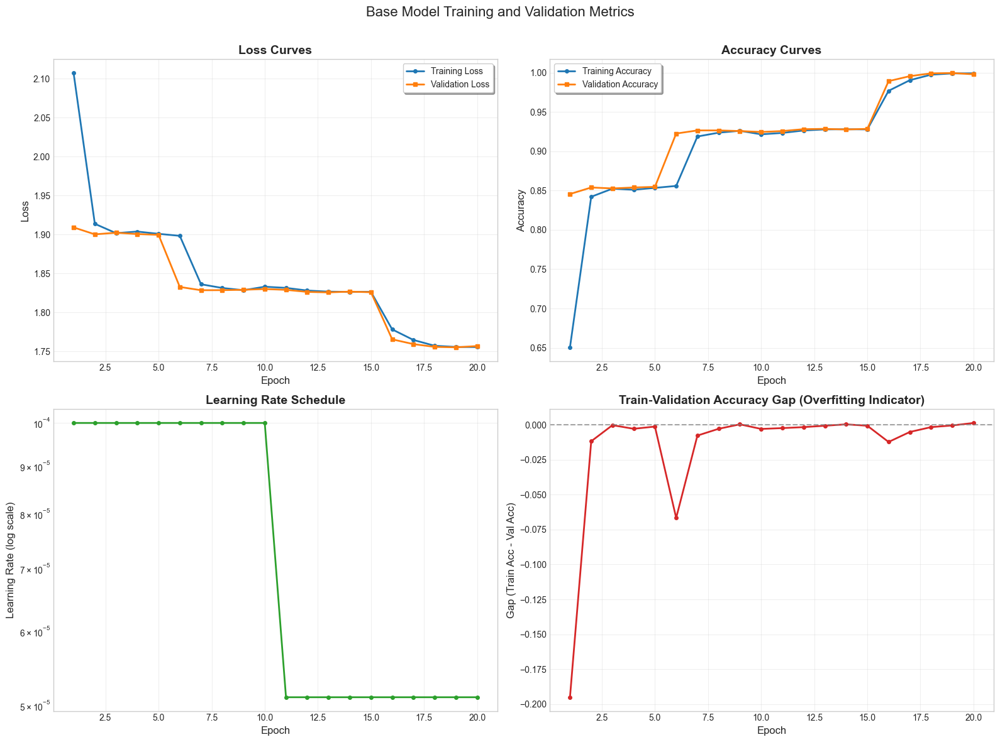

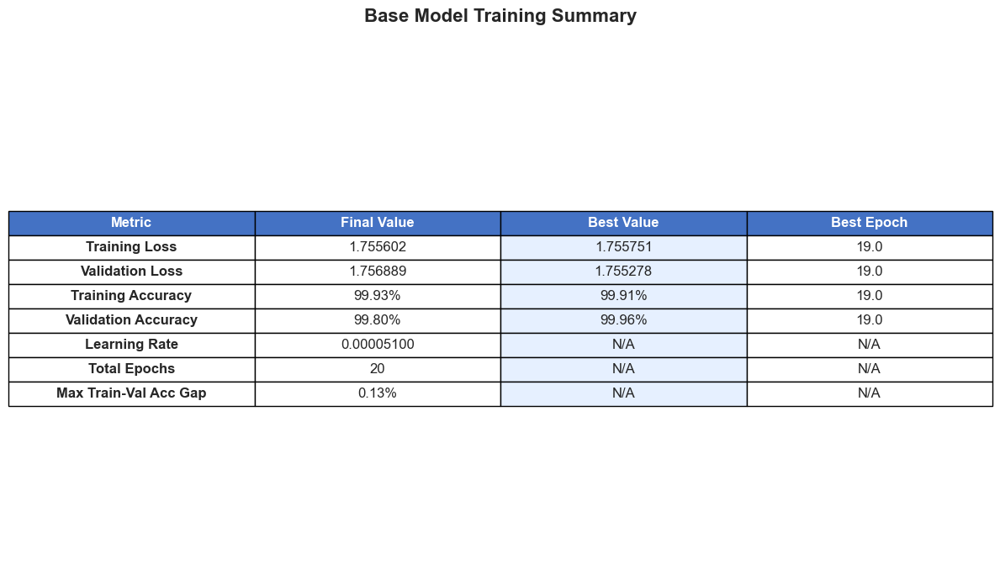

In [6]:
# Specify number of epochs for base training
base_epochs = 20

# Run Phase 1: Base Model Training
print("Phase 1: Base Model Training")
print("=" * 50)

base_model, base_history, base_val_acc = train_base_model(
    model, train_loader, val_loader, 
    num_epochs=base_epochs, 
    device=device, 
    output_dir=base_dir, 
    use_gpu_dataset=use_gpu_dataset,
    learning_rate=learning_rate,
    scheduler_factor=scheduler_factor,
    scheduler_patience=scheduler_patience,
    min_lr=min_lr
)

## Phase 2: SABR Regularization

In this phase, we'll apply SABR regularization to the trained model to induce sparsity while maintaining accuracy. We'll eliminate dropout and use adaptive L1 regularization with progressive parameter freezing.

In [7]:
def train_with_sabr(model, train_loader, val_loader, num_epochs=40, device='cuda', 
                   output_dir='results/sabr_model', use_gpu_dataset=False,
                   teta1=5e-4, growth_rate=1.15, decrease_rate=1.2, accuracy_threshold=0.007, k_epoch=2,
                   learning_rate=0.0001, scheduler_factor=0.51, scheduler_patience=3, min_lr=0.00001,
                   epsilon=1e-5):
    """Train a model with SABR regularization."""
    os.makedirs(output_dir, exist_ok=True)
    plots_dir = os.path.join(output_dir, 'plots')
    os.makedirs(plots_dir, exist_ok=True)
    
    # Move model to device
    model.to(device)
    
    # Set dropout to 0.0 (eliminate dropout)
    print("Setting dropout to 0.0 for deterministic behavior during pruning...")
    eliminate_dropout(model)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(
        optimizer, 
        mode='min', 
        factor=scheduler_factor, 
        patience=scheduler_patience, 
        verbose=True, 
        min_lr=min_lr
    )
    
    # Initialize the SABR regularizer
    print(f"Initializing SABR with: teta1={teta1}, growth_rate={growth_rate}, "
          f"decrease_rate={decrease_rate}, accuracy_threshold={accuracy_threshold}, k_epoch={k_epoch}")
    regularizer = SABR(
        model,
        teta1=teta1,
        growth_rate=growth_rate,
        decrease_rate=decrease_rate,
        accuracy_threshold=accuracy_threshold,
        k_epoch=k_epoch
    )
    
    # Initialize tracking variables
    best_val_acc = 0.0
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epochs = []
    lr_history = []
    sparsity_history = []
    
    # Training loop
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        start_time = time.time()
        
        # Check if all parameters are frozen
        if regularizer.all_parameters_frozen():
            print("All parameters have been frozen. Stopping training.")
            break
        
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        # Create progress bar for training
        train_pbar = tqdm(train_loader, desc="Training")
        for inputs, labels in train_pbar:
            # Only transfer to device if not using GPU dataset
            if not use_gpu_dataset:
                inputs, labels = inputs.to(device), labels.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Add L1 penalty from the regularizer
            l1_penalty = regularizer.get_penalty(model)
            loss = loss + l1_penalty
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            # Statistics
            running_loss += loss.item() * inputs.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
            # Update progress bar with current batch statistics
            batch_loss = loss.item()
            batch_acc = predicted.eq(labels).sum().item() / labels.size(0)
            train_pbar.set_postfix({
                'loss': f'{batch_loss:.4f}',
                'acc': f'{batch_acc:.4f}'
            })
        
        train_loss = running_loss / len(train_loader.dataset)
        train_acc = correct / total
        
        # Validation phase
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0
        
        # Create progress bar for validation
        val_pbar = tqdm(val_loader, desc="Validation")
        with torch.no_grad():
            for inputs, labels in val_pbar:
                # Only transfer to device if not using GPU dataset
                if not use_gpu_dataset:
                    inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
                val_running_loss += loss.item() * inputs.size(0)
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()
                
                # Update progress bar with current batch statistics
                batch_loss = loss.item()
                batch_acc = predicted.eq(labels).sum().item() / labels.size(0)
                val_pbar.set_postfix({
                    'loss': f'{batch_loss:.4f}',
                    'acc': f'{batch_acc:.4f}'
                })
        
        val_loss = val_running_loss / len(val_loader.dataset)
        val_acc = val_correct / val_total
        
        # Update lambda based on validation accuracy
        lambda_values = regularizer.update(val_acc)
        
        # Step the scheduler
        scheduler.step(val_loss)
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Calculate elapsed time
        elapsed_time = time.time() - start_time
        
        # Print epoch summary
        print(f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}')
        print(f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')
        print(f'Learning Rate: {current_lr:.10f}')
        print(f'Epoch time: {elapsed_time:.2f} seconds')
        
        # Print lambda values for key layers (optional, for monitoring)
        print("Lambda values for sample layers:")
        for i, (layer_name, lambda_val) in enumerate(lambda_values.items()):
            if i < 3 or i > len(lambda_values) - 4:  # Show first 3 and last 3 layers
                frozen_status = " (FROZEN)" if layer_name in regularizer.get_frozen_parameters() else ""
                print(f'  {layer_name}: {lambda_val:.10f}{frozen_status}')
        
        # Save the best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            save_model(model, os.path.join(output_dir, 'best_model.pth'))
            print(f'✓ New best model saved with val_acc: {val_acc:.4f}')
        
        # Store metrics for plotting
        epochs.append(epoch + 1)
        train_losses.append(train_loss)
        train_accs.append(train_acc)
        val_losses.append(val_loss)
        val_accs.append(val_acc)
        lr_history.append(current_lr)
        
        # Calculate and plot sparsity
        sparsity_dict = calculate_sparsity(model, epsilon=epsilon)
        if epoch%10 == 0:
            plot_sparsity(sparsity_dict, epoch + 1, plots_dir, "SABR Model")
            plt.show()
            
        # Calculate overall sparsity
        overall_sparsity, total_params, zero_params = calculate_overall_sparsity(model, epsilon=epsilon)
        sparsity_history.append(overall_sparsity)
        
        print(f"Overall model sparsity: {overall_sparsity:.2f}% ({zero_params}/{total_params} weights near zero)")
    
    print(f'\nSABR training completed. Best validation accuracy: {best_val_acc:.4f}')
    
    # Save final model if it's the last epoch
    save_model(model, os.path.join(output_dir, 'final_model.pth'))
    
    # Save training history
    history_df = pd.DataFrame({
        'Epoch': epochs,
        'Train Loss': train_losses,
        'Val Loss': val_losses,
        'Train Acc': train_accs,
        'Val Acc': val_accs,
        'Learning Rate': lr_history,
        'Sparsity': sparsity_history
    })
    history_df.to_csv(os.path.join(output_dir, 'training_history.csv'), index=False)
    
    # Plot training curves
    plot_training_curves(epochs, train_losses, val_losses, train_accs, val_accs, lr_history, output_dir, "SABR Model")
    plt.show()
    
    # Plot lambda histories
    plot_lambda_history(regularizer.get_lambda_history(), regularizer.get_frozen_parameters(), plots_dir, "SABR Model")
    plt.show()
    
    # Plot sparsity evolution
    plot_sparsity_evolution(history_df, output_dir, "SABR Model")
    plt.show()
    
    # Create summary table
    create_summary_table(history_df, output_dir, "SABR Model")
    plt.show()
    
    # Create visualization of weight distributions
    plot_weight_distributions(model, plots_dir, "SABR Model", epsilon=epsilon)
    plt.show()
    
    return model, history_df, regularizer, best_val_acc

Loading best model from Phase 1...
Model loaded from notebook_results\base_model\best_model.pth

Phase 2: SABR Regularization
Setting dropout to 0.0 for deterministic behavior during pruning...
Set dropout probability to 0.0 for Dropout(p=0.0, inplace=False)
Initializing SABR with: teta1=0.0005, growth_rate=1.15, decrease_rate=1.2, accuracy_threshold=0.007, k_epoch=2
Initialized SABR with teta1=0.0005
  features.0.weight: initial lambda = 0.00017845
  features.3.weight: initial lambda = 0.00003273
  features.6.weight: initial lambda = 0.00001872
  features.8.weight: initial lambda = 0.00001500
  features.11.weight: initial lambda = 0.00001233
  features.13.weight: initial lambda = 0.00000960
  features.16.weight: initial lambda = 0.00000998
  features.18.weight: initial lambda = 0.00000947
  classifier.0.weight: initial lambda = 0.00000211
  classifier.3.weight: initial lambda = 0.00001310

Epoch 1/50


c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0000 <= threshold 0.007 from max 0.9861). Increasing all lambda values by factor of 1.150
Train Loss: 3.2013, Train Acc: 0.9946
Val Loss: 1.7707, Val Acc: 0.9861
Learning Rate: 0.0001000000
Epoch time: 22.18 seconds
Lambda values for sample layers:
  features.0.weight: 0.0002052209
  features.3.weight: 0.0000376383
  features.6.weight: 0.0000215319
  features.18.weight: 0.0000108952
  classifier.0.weight: 0.0000024223
  classifier.3.weight: 0.0000150614
Model saved to notebook_results\sabr_model\best_model.pth
✓ New best model saved with val_acc: 0.9861


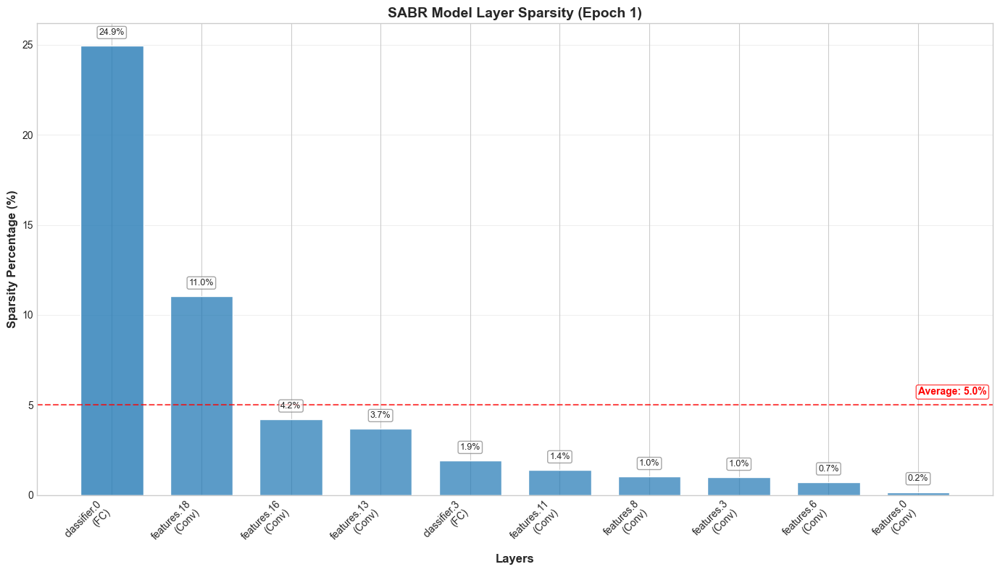

Overall model sparsity: 16.65% (3674109/22069952 weights near zero)

Epoch 2/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: -0.0091 <= threshold 0.007 from max 0.9861). Increasing all lambda values by factor of 1.150
New maximum validation accuracy: 0.9952
Train Loss: 3.0128, Train Acc: 0.9933
Val Loss: 1.7599, Val Acc: 0.9952
Learning Rate: 0.0001000000
Epoch time: 21.96 seconds
Lambda values for sample layers:
  features.0.weight: 0.0002360041
  features.3.weight: 0.0000432840
  features.6.weight: 0.0000247617
  features.18.weight: 0.0000125295
  classifier.0.weight: 0.0000027856
  classifier.3.weight: 0.0000173206
Model saved to notebook_results\sabr_model\best_model.pth
✓ New best model saved with val_acc: 0.9952
Overall model sparsity: 20.49% (4523170/22069952 weights near zero)

Epoch 3/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: -0.0036 <= threshold 0.007 from max 0.9952). Increasing all lambda values by factor of 1.150
New maximum validation accuracy: 0.9988
Train Loss: 2.9697, Train Acc: 0.9978
Val Loss: 1.7559, Val Acc: 0.9988
Learning Rate: 0.0001000000
Epoch time: 21.94 seconds
Lambda values for sample layers:
  features.0.weight: 0.0002714047
  features.3.weight: 0.0000497766
  features.6.weight: 0.0000284759
  features.18.weight: 0.0000144089
  classifier.0.weight: 0.0000032035
  classifier.3.weight: 0.0000199186
Model saved to notebook_results\sabr_model\best_model.pth
✓ New best model saved with val_acc: 0.9988
Overall model sparsity: 33.97% (7496216/22069952 weights near zero)

Epoch 4/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0179 > threshold 0.007 from max 0.9988. Reducing all lambda values by factor of 0.833
Train Loss: 2.9570, Train Acc: 0.9953
Val Loss: 1.7748, Val Acc: 0.9810
Learning Rate: 0.0001000000
Epoch time: 21.96 seconds
Lambda values for sample layers:
  features.0.weight: 0.0002261706
  features.3.weight: 0.0000414805
  features.6.weight: 0.0000237299
  features.18.weight: 0.0000120075
  classifier.0.weight: 0.0000026696
  classifier.3.weight: 0.0000165989
Overall model sparsity: 21.81% (4813273/22069952 weights near zero)

Epoch 5/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0020 <= threshold 0.007 from max 0.9988). Increasing all lambda values by factor of 1.150
Train Loss: 2.6593, Train Acc: 0.9901
Val Loss: 1.7596, Val Acc: 0.9968
Learning Rate: 0.0001000000
Epoch time: 21.97 seconds
Lambda values for sample layers:
  features.0.weight: 0.0002600962
  features.3.weight: 0.0000477026
  features.6.weight: 0.0000272894
  features.18.weight: 0.0000138086
  classifier.0.weight: 0.0000030700
  classifier.3.weight: 0.0000190887
Overall model sparsity: 29.64% (6541550/22069952 weights near zero)

Epoch 6/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0048 <= threshold 0.007 from max 0.9988). Increasing all lambda values by factor of 1.150
Train Loss: 2.6904, Train Acc: 0.9958
Val Loss: 1.7627, Val Acc: 0.9940
Learning Rate: 0.0001000000
Epoch time: 21.97 seconds
Lambda values for sample layers:
  features.0.weight: 0.0002991106
  features.3.weight: 0.0000548580
  features.6.weight: 0.0000313828
  features.18.weight: 0.0000158799
  classifier.0.weight: 0.0000035305
  classifier.3.weight: 0.0000219520
Overall model sparsity: 34.70% (7658088/22069952 weights near zero)

Epoch 7/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0008 <= threshold 0.007 from max 0.9988). Increasing all lambda values by factor of 1.150
Train Loss: 2.7232, Train Acc: 0.9970
Val Loss: 1.7577, Val Acc: 0.9980
Learning Rate: 0.0000510000
Epoch time: 21.96 seconds
Lambda values for sample layers:
  features.0.weight: 0.0003439772
  features.3.weight: 0.0000630867
  features.6.weight: 0.0000360903
  features.18.weight: 0.0000182618
  classifier.0.weight: 0.0000040601
  classifier.3.weight: 0.0000252448
Overall model sparsity: 33.96% (7494241/22069952 weights near zero)

Epoch 8/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: -0.0012 <= threshold 0.007 from max 0.9988). Increasing all lambda values by factor of 1.150
New maximum validation accuracy: 1.0000
Train Loss: 2.7656, Train Acc: 0.9996
Val Loss: 1.7554, Val Acc: 1.0000
Learning Rate: 0.0000510000
Epoch time: 21.96 seconds
Lambda values for sample layers:
  features.0.weight: 0.0003955737
  features.3.weight: 0.0000725497
  features.6.weight: 0.0000415038
  features.18.weight: 0.0000210011
  classifier.0.weight: 0.0000046691
  classifier.3.weight: 0.0000290315
Model saved to notebook_results\sabr_model\best_model.pth
✓ New best model saved with val_acc: 1.0000
Overall model sparsity: 77.68% (17143081/22069952 weights near zero)

Epoch 9/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0004 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 2.8410, Train Acc: 0.9989
Val Loss: 1.7560, Val Acc: 0.9996
Learning Rate: 0.0000510000
Epoch time: 21.95 seconds
Lambda values for sample layers:
  features.0.weight: 0.0004549098
  features.3.weight: 0.0000834322
  features.6.weight: 0.0000477294
  features.18.weight: 0.0000241513
  classifier.0.weight: 0.0000053694
  classifier.3.weight: 0.0000333863
Overall model sparsity: 65.34% (14419569/22069952 weights near zero)

Epoch 10/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0016 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 2.9111, Train Acc: 0.9990
Val Loss: 1.7570, Val Acc: 0.9984
Learning Rate: 0.0000510000
Epoch time: 21.97 seconds
Lambda values for sample layers:
  features.0.weight: 0.0005231462
  features.3.weight: 0.0000959470
  features.6.weight: 0.0000548888
  features.18.weight: 0.0000277740
  classifier.0.weight: 0.0000061748
  classifier.3.weight: 0.0000383942
Overall model sparsity: 44.12% (9736439/22069952 weights near zero)

Epoch 11/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0032 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 2.9860, Train Acc: 0.9978
Val Loss: 1.7599, Val Acc: 0.9968
Learning Rate: 0.0000510000
Epoch time: 22.03 seconds
Lambda values for sample layers:
  features.0.weight: 0.0006016181
  features.3.weight: 0.0001103390
  features.6.weight: 0.0000631221
  features.18.weight: 0.0000319401
  classifier.0.weight: 0.0000071011
  classifier.3.weight: 0.0000441533


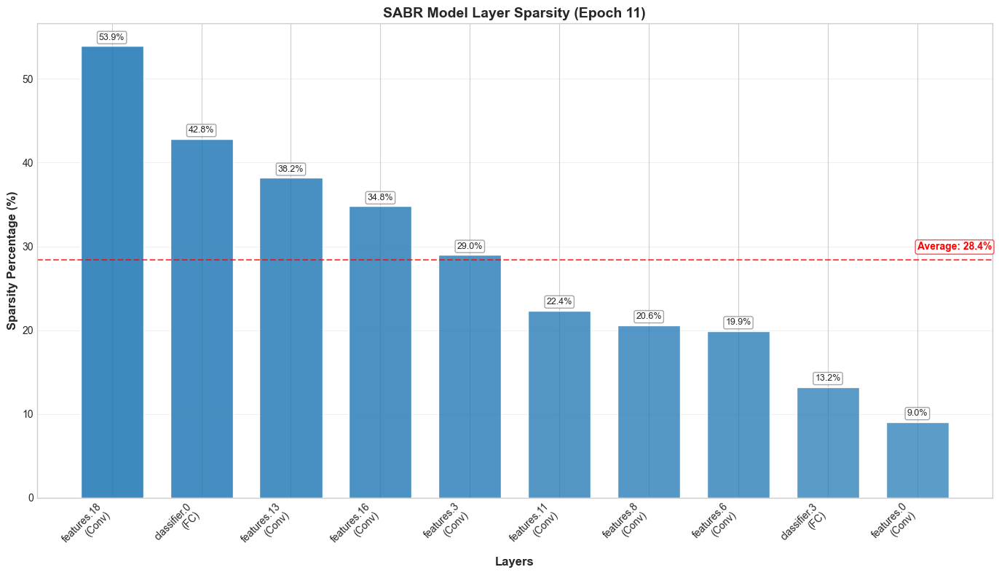

Overall model sparsity: 40.60% (8960635/22069952 weights near zero)

Epoch 12/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.0443, Train Acc: 0.9985
Val Loss: 1.7603, Val Acc: 0.9964
Learning Rate: 0.0000260100
Epoch time: 22.59 seconds
Lambda values for sample layers:
  features.0.weight: 0.0006918608
  features.3.weight: 0.0001268899
  features.6.weight: 0.0000725904
  features.18.weight: 0.0000367311
  classifier.0.weight: 0.0000081662
  classifier.3.weight: 0.0000507763
Overall model sparsity: 32.25% (7118653/22069952 weights near zero)

Epoch 13/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0060 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.1340, Train Acc: 0.9992
Val Loss: 1.7628, Val Acc: 0.9940
Learning Rate: 0.0000260100
Epoch time: 22.19 seconds
Lambda values for sample layers:
  features.0.weight: 0.0007956399
  features.3.weight: 0.0001459234
  features.6.weight: 0.0000834790
  features.18.weight: 0.0000422407
  classifier.0.weight: 0.0000093912
  classifier.3.weight: 0.0000583928
Overall model sparsity: 59.46% (13123147/22069952 weights near zero)

Epoch 14/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.2606, Train Acc: 0.9977
Val Loss: 1.7612, Val Acc: 0.9964
Learning Rate: 0.0000260100
Epoch time: 22.52 seconds
Lambda values for sample layers:
  features.0.weight: 0.0009149858
  features.3.weight: 0.0001678119
  features.6.weight: 0.0000960008
  features.18.weight: 0.0000485768
  classifier.0.weight: 0.0000107998
  classifier.3.weight: 0.0000671517
Overall model sparsity: 47.73% (10535064/22069952 weights near zero)

Epoch 15/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0016 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.3902, Train Acc: 0.9992
Val Loss: 1.7588, Val Acc: 0.9984
Learning Rate: 0.0000260100
Epoch time: 22.49 seconds
Lambda values for sample layers:
  features.0.weight: 0.0010522337
  features.3.weight: 0.0001929836
  features.6.weight: 0.0001104009
  features.18.weight: 0.0000558634
  classifier.0.weight: 0.0000124198
  classifier.3.weight: 0.0000772244
Overall model sparsity: 73.62% (16247052/22069952 weights near zero)

Epoch 16/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0044 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.5287, Train Acc: 0.9988
Val Loss: 1.7624, Val Acc: 0.9956
Learning Rate: 0.0000132651
Epoch time: 22.48 seconds
Lambda values for sample layers:
  features.0.weight: 0.0012100688
  features.3.weight: 0.0002219312
  features.6.weight: 0.0001269611
  features.18.weight: 0.0000642429
  classifier.0.weight: 0.0000142828
  classifier.3.weight: 0.0000888081
Overall model sparsity: 48.84% (10779340/22069952 weights near zero)

Epoch 17/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0052 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.6959, Train Acc: 0.9992
Val Loss: 1.7637, Val Acc: 0.9948
Learning Rate: 0.0000132651
Epoch time: 22.52 seconds
Lambda values for sample layers:
  features.0.weight: 0.0013915792
  features.3.weight: 0.0002552208
  features.6.weight: 0.0001460052
  features.18.weight: 0.0000738793
  classifier.0.weight: 0.0000164252
  classifier.3.weight: 0.0001021293
Overall model sparsity: 71.62% (15806135/22069952 weights near zero)

Epoch 18/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 3.9111, Train Acc: 0.9993
Val Loss: 1.7621, Val Acc: 0.9964
Learning Rate: 0.0000132651
Epoch time: 22.11 seconds
Lambda values for sample layers:
  features.0.weight: 0.0016003160
  features.3.weight: 0.0002935040
  features.6.weight: 0.0001679060
  features.18.weight: 0.0000849612
  classifier.0.weight: 0.0000188890
  classifier.3.weight: 0.0001174487
Overall model sparsity: 77.07% (17008762/22069952 weights near zero)

Epoch 19/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 4.1459, Train Acc: 0.9990
Val Loss: 1.7626, Val Acc: 0.9964
Learning Rate: 0.0000132651
Epoch time: 21.97 seconds
Lambda values for sample layers:
  features.0.weight: 0.0018403634
  features.3.weight: 0.0003375295
  features.6.weight: 0.0001930919
  features.18.weight: 0.0000977054
  classifier.0.weight: 0.0000217223
  classifier.3.weight: 0.0001350660
Overall model sparsity: 74.35% (16409800/22069952 weights near zero)

Epoch 20/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 4.4002, Train Acc: 0.9989
Val Loss: 1.7694, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 22.01 seconds
Lambda values for sample layers:
  features.0.weight: 0.0021164177
  features.3.weight: 0.0003881590
  features.6.weight: 0.0002220556
  features.18.weight: 0.0001123612
  classifier.0.weight: 0.0000249807
  classifier.3.weight: 0.0001553259
Overall model sparsity: 68.26% (15064144/22069952 weights near zero)

Epoch 21/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0052 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 4.6903, Train Acc: 0.9990
Val Loss: 1.7667, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 22.01 seconds
Lambda values for sample layers:
  features.0.weight: 0.0024338805
  features.3.weight: 0.0004463828
  features.6.weight: 0.0002553640
  features.18.weight: 0.0001292153
  classifier.0.weight: 0.0000287278
  classifier.3.weight: 0.0001786247


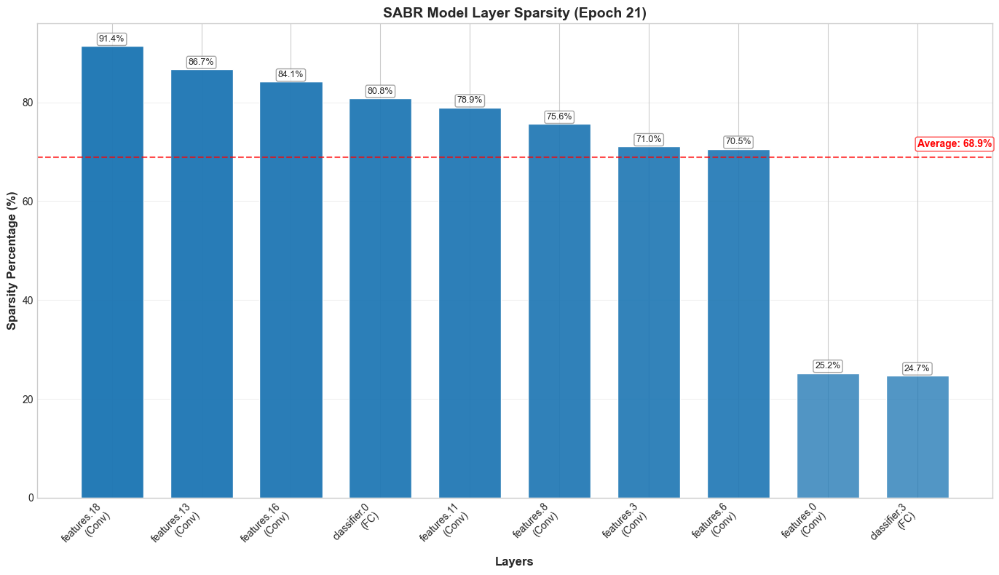

Overall model sparsity: 82.50% (18207912/22069952 weights near zero)

Epoch 22/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0048 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 5.0256, Train Acc: 0.9993
Val Loss: 1.7675, Val Acc: 0.9952
Learning Rate: 0.0000100000
Epoch time: 22.00 seconds
Lambda values for sample layers:
  features.0.weight: 0.0027989624
  features.3.weight: 0.0005133402
  features.6.weight: 0.0002936686
  features.18.weight: 0.0001485976
  classifier.0.weight: 0.0000330370
  classifier.3.weight: 0.0002054185
Overall model sparsity: 72.65% (16033518/22069952 weights near zero)

Epoch 23/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0067 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 5.3966, Train Acc: 0.9988
Val Loss: 1.7705, Val Acc: 0.9933
Learning Rate: 0.0000100000
Epoch time: 22.02 seconds
Lambda values for sample layers:
  features.0.weight: 0.0032188068
  features.3.weight: 0.0005903412
  features.6.weight: 0.0003377188
  features.18.weight: 0.0001708873
  classifier.0.weight: 0.0000379925
  classifier.3.weight: 0.0002362312
Overall model sparsity: 84.20% (18582376/22069952 weights near zero)

Epoch 24/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0052 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 5.8091, Train Acc: 0.9978
Val Loss: 1.7687, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 21.99 seconds
Lambda values for sample layers:
  features.0.weight: 0.0037016277
  features.3.weight: 0.0006788924
  features.6.weight: 0.0003883766
  features.18.weight: 0.0001965203
  classifier.0.weight: 0.0000436914
  classifier.3.weight: 0.0002716659
Overall model sparsity: 83.34% (18394087/22069952 weights near zero)

Epoch 25/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0052 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 6.2643, Train Acc: 0.9982
Val Loss: 1.7721, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 22.11 seconds
Lambda values for sample layers:
  features.0.weight: 0.0042568720
  features.3.weight: 0.0007807263
  features.6.weight: 0.0004466331
  features.18.weight: 0.0002259984
  classifier.0.weight: 0.0000502451
  classifier.3.weight: 0.0003124158
Overall model sparsity: 85.40% (18847879/22069952 weights near zero)

Epoch 26/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0060 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Train Loss: 6.7736, Train Acc: 0.9972
Val Loss: 1.7745, Val Acc: 0.9940
Learning Rate: 0.0000100000
Epoch time: 22.49 seconds
Lambda values for sample layers:
  features.0.weight: 0.0048954026
  features.3.weight: 0.0008978352
  features.6.weight: 0.0005136281
  features.18.weight: 0.0002598981
  classifier.0.weight: 0.0000577818
  classifier.3.weight: 0.0003592781
Overall model sparsity: 83.84% (18502875/22069952 weights near zero)

Epoch 27/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0071 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Train Loss: 7.3382, Train Acc: 0.9968
Val Loss: 1.7773, Val Acc: 0.9929
Learning Rate: 0.0000100000
Epoch time: 22.65 seconds
Lambda values for sample layers:
  features.0.weight: 0.0040795021
  features.3.weight: 0.0007481960
  features.6.weight: 0.0004280234
  features.18.weight: 0.0002165818
  classifier.0.weight: 0.0000481515
  classifier.3.weight: 0.0002993984
Overall model sparsity: 87.11% (19225717/22069952 weights near zero)

Epoch 28/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0087 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.0.weight to non-trainable (requires_grad=False)
Freezing lambda for features.0.weight after 2 epochs without growth. Final lambda value: 0.00339958
Currently 1/10 parameters have frozen lambda values.
Train Loss: 6.2800, Train Acc: 0.9959
Val Loss: 1.7796, Val Acc: 0.9913
Learning Rate: 0.0000100000
Epoch time: 22.72 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0006234966
  features.6.weight: 0.0003566862
  features.18.weight: 0.0001804848
  classifier.0.weight: 0.0000401263
  classifier.3.weight: 0.0002494987
Overall model sparsity: 85.28% (18820214/22069952 weights near zero)

Epoch 29/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0083 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting classifier.3.weight to non-trainable (requires_grad=False)
Freezing lambda for classifier.3.weight after 2 epochs without growth. Final lambda value: 0.00020792
Currently 2/10 parameters have frozen lambda values.
Train Loss: 5.4554, Train Acc: 0.9939
Val Loss: 1.7789, Val Acc: 0.9917
Learning Rate: 0.0000100000
Epoch time: 22.19 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0005195805
  features.6.weight: 0.0002972385
  features.18.weight: 0.0001504040
  classifier.0.weight: 0.0000334386
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 85.19% (18801723/22069952 weights near zero)

Epoch 30/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0067 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 2/10 parameters have frozen lambda values.
Train Loss: 4.9851, Train Acc: 0.9956
Val Loss: 1.7765, Val Acc: 0.9933
Learning Rate: 0.0000100000
Epoch time: 22.10 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0005975176
  features.6.weight: 0.0003418242
  features.18.weight: 0.0001729646
  classifier.0.weight: 0.0000384543
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 85.44% (18855961/22069952 weights near zero)

Epoch 31/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0103 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Currently 2/10 parameters have frozen lambda values.
Train Loss: 5.2413, Train Acc: 0.9958
Val Loss: 1.7803, Val Acc: 0.9897
Learning Rate: 0.0000100000
Epoch time: 22.08 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004979313
  features.6.weight: 0.0002848535
  features.18.weight: 0.0001441372
  classifier.0.weight: 0.0000320453
  classifier.3.weight: 0.0002079156 (FROZEN)


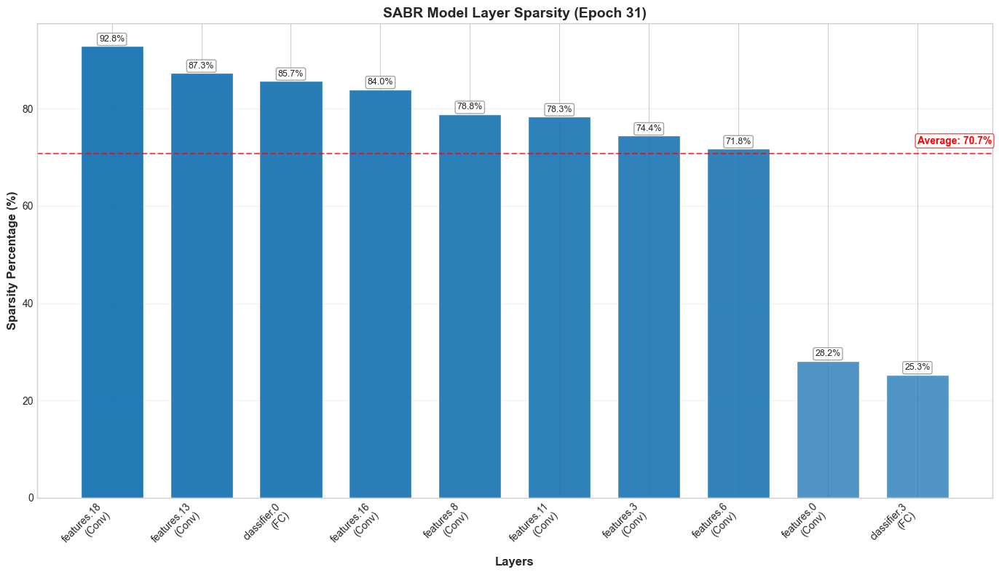

Overall model sparsity: 85.62% (18895802/22069952 weights near zero)

Epoch 32/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0071 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.3.weight after 2 epochs without growth. Final lambda value: 0.00041494
Currently 3/10 parameters have frozen lambda values.
Train Loss: 4.8239, Train Acc: 0.9952
Val Loss: 1.7756, Val Acc: 0.9929
Learning Rate: 0.0000100000
Epoch time: 22.19 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0002373779
  features.18.weight: 0.0001201143
  classifier.0.weight: 0.0000267044
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 88.71% (19578782/22069952 weights near zero)

Epoch 33/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 3/10 parameters have frozen lambda values.
Train Loss: 4.4853, Train Acc: 0.9953
Val Loss: 1.7749, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 21.30 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0002729846
  features.18.weight: 0.0001381314
  classifier.0.weight: 0.0000307101
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 87.31% (19269348/22069952 weights near zero)

Epoch 34/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0083 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Currently 3/10 parameters have frozen lambda values.
Train Loss: 4.6446, Train Acc: 0.9963
Val Loss: 1.7758, Val Acc: 0.9917
Learning Rate: 0.0000100000
Epoch time: 21.30 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0002274872
  features.18.weight: 0.0001151095
  classifier.0.weight: 0.0000255917
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 89.34% (19716806/22069952 weights near zero)

Epoch 35/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0083 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.6.weight to non-trainable (requires_grad=False)
Freezing lambda for features.6.weight after 2 epochs without growth. Final lambda value: 0.00018957
Currently 4/10 parameters have frozen lambda values.
Train Loss: 4.3984, Train Acc: 0.9954
Val Loss: 1.7743, Val Acc: 0.9917
Learning Rate: 0.0000100000
Epoch time: 21.36 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000959246
  classifier.0.weight: 0.0000213264
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 88.62% (19558388/22069952 weights near zero)

Epoch 36/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0103 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.8.weight to non-trainable (requires_grad=False)
Freezing lambda for features.8.weight after 2 epochs without growth. Final lambda value: 0.00012652
Currently 5/10 parameters have frozen lambda values.
Train Loss: 4.1981, Train Acc: 0.9957
Val Loss: 1.7774, Val Acc: 0.9897
Learning Rate: 0.0000100000
Epoch time: 20.72 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000799372
  classifier.0.weight: 0.0000177720
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 85.42% (18853201/22069952 weights near zero)

Epoch 37/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 5/10 parameters have frozen lambda values.
Train Loss: 4.0680, Train Acc: 0.9965
Val Loss: 1.7722, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 19.53 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000919277
  classifier.0.weight: 0.0000204378
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 87.80% (19377494/22069952 weights near zero)

Epoch 38/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 5/10 parameters have frozen lambda values.
Train Loss: 4.1313, Train Acc: 0.9965
Val Loss: 1.7712, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 19.53 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0001057169
  classifier.0.weight: 0.0000235035
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 89.82% (19822424/22069952 weights near zero)

Epoch 39/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0067 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 5/10 parameters have frozen lambda values.
Train Loss: 4.2043, Train Acc: 0.9967
Val Loss: 1.7723, Val Acc: 0.9933
Learning Rate: 0.0000100000
Epoch time: 19.48 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0001215744
  classifier.0.weight: 0.0000270290
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 87.29% (19265299/22069952 weights near zero)

Epoch 40/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0075 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Currently 5/10 parameters have frozen lambda values.
Train Loss: 4.2849, Train Acc: 0.9971
Val Loss: 1.7718, Val Acc: 0.9925
Learning Rate: 0.0000100000
Epoch time: 19.54 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0001013120
  classifier.0.weight: 0.0000225242
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 89.87% (19835218/22069952 weights near zero)

Epoch 41/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0087 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.18.weight to non-trainable (requires_grad=False)
Freezing lambda for features.18.weight after 2 epochs without growth. Final lambda value: 0.00008443
Currently 6/10 parameters have frozen lambda values.
Train Loss: 4.1638, Train Acc: 0.9970
Val Loss: 1.7736, Val Acc: 0.9913
Learning Rate: 0.0000100000
Epoch time: 19.62 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000187702
  classifier.3.weight: 0.0002079156 (FROZEN)


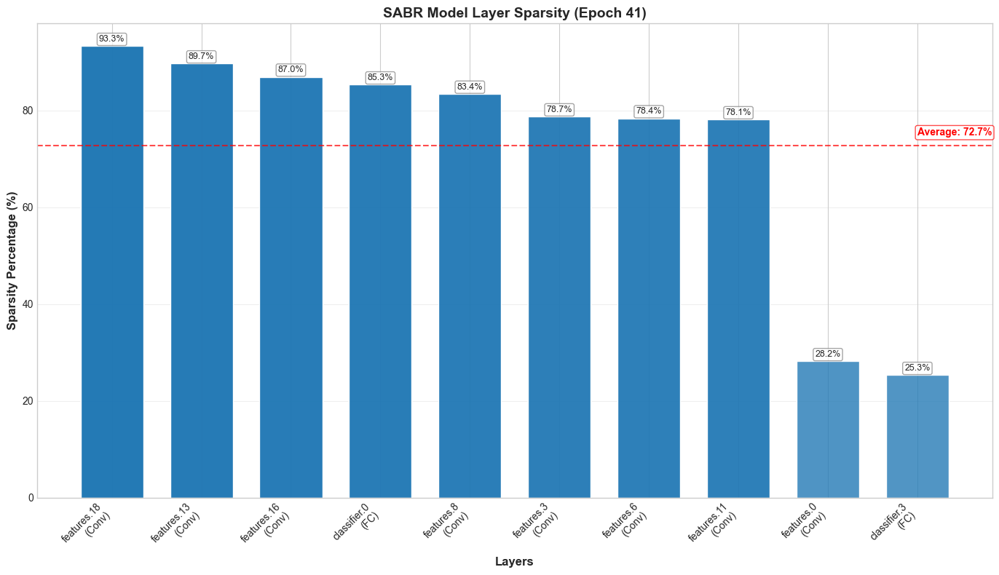

Overall model sparsity: 86.25% (19035583/22069952 weights near zero)

Epoch 42/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0087 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.11.weight to non-trainable (requires_grad=False)
Freezing lambda for features.11.weight after 2 epochs without growth. Final lambda value: 0.00009157
Currently 7/10 parameters have frozen lambda values.
Train Loss: 4.0656, Train Acc: 0.9972
Val Loss: 1.7737, Val Acc: 0.9913
Learning Rate: 0.0000100000
Epoch time: 19.14 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000156418
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 85.66% (18904322/22069952 weights near zero)

Epoch 43/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0075 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Setting features.13.weight to non-trainable (requires_grad=False)
Freezing lambda for features.13.weight after 2 epochs without growth. Final lambda value: 0.00005938
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9958, Train Acc: 0.9979
Val Loss: 1.7708, Val Acc: 0.9925
Learning Rate: 0.0000100000
Epoch time: 18.57 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000130348
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 87.09% (19220625/22069952 weights near zero)

Epoch 44/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9590, Train Acc: 0.9980
Val Loss: 1.7698, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 17.26 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000149901
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 85.48% (18864776/22069952 weights near zero)

Epoch 45/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0067 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9720, Train Acc: 0.9976
Val Loss: 1.7700, Val Acc: 0.9933
Learning Rate: 0.0000100000
Epoch time: 17.30 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000172386
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 87.09% (19220509/22069952 weights near zero)

Epoch 46/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0075 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9875, Train Acc: 0.9981
Val Loss: 1.7698, Val Acc: 0.9925
Learning Rate: 0.0000100000
Epoch time: 17.30 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000143655
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 86.85% (19166752/22069952 weights near zero)

Epoch 47/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0067 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9656, Train Acc: 0.9978
Val Loss: 1.7692, Val Acc: 0.9933
Learning Rate: 0.0000100000
Epoch time: 17.32 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000165203
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 87.87% (19393181/22069952 weights near zero)

Epoch 48/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0103 > threshold 0.007 from max 1.0000. Reducing all lambda values by factor of 0.833
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9800, Train Acc: 0.9980
Val Loss: 1.7717, Val Acc: 0.9897
Learning Rate: 0.0000100000
Epoch time: 17.31 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000137669
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 81.83% (18060297/22069952 weights near zero)

Epoch 49/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9600, Train Acc: 0.9981
Val Loss: 1.7686, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 17.27 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000158319
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 86.36% (19059442/22069952 weights near zero)

Epoch 50/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0063 <= threshold 0.007 from max 1.0000). Increasing all lambda values by factor of 1.150
Currently 8/10 parameters have frozen lambda values.
Train Loss: 3.9734, Train Acc: 0.9982
Val Loss: 1.7686, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 17.31 seconds
Lambda values for sample layers:
  features.0.weight: 0.0033995849 (FROZEN)
  features.3.weight: 0.0004149427 (FROZEN)
  features.6.weight: 0.0001895726 (FROZEN)
  features.18.weight: 0.0000844267 (FROZEN)
  classifier.0.weight: 0.0000182067
  classifier.3.weight: 0.0002079156 (FROZEN)
Overall model sparsity: 85.76% (18927038/22069952 weights near zero)

SABR training completed. Best validation accuracy: 1.0000
Model saved to notebook_results\sabr_model\final_model.pth


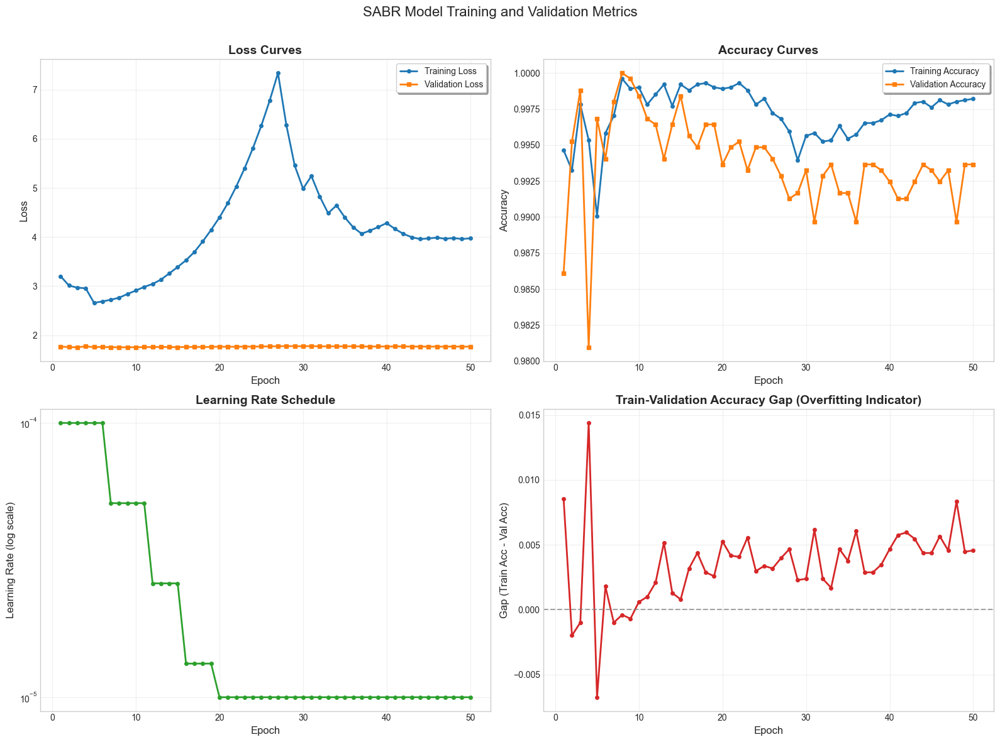

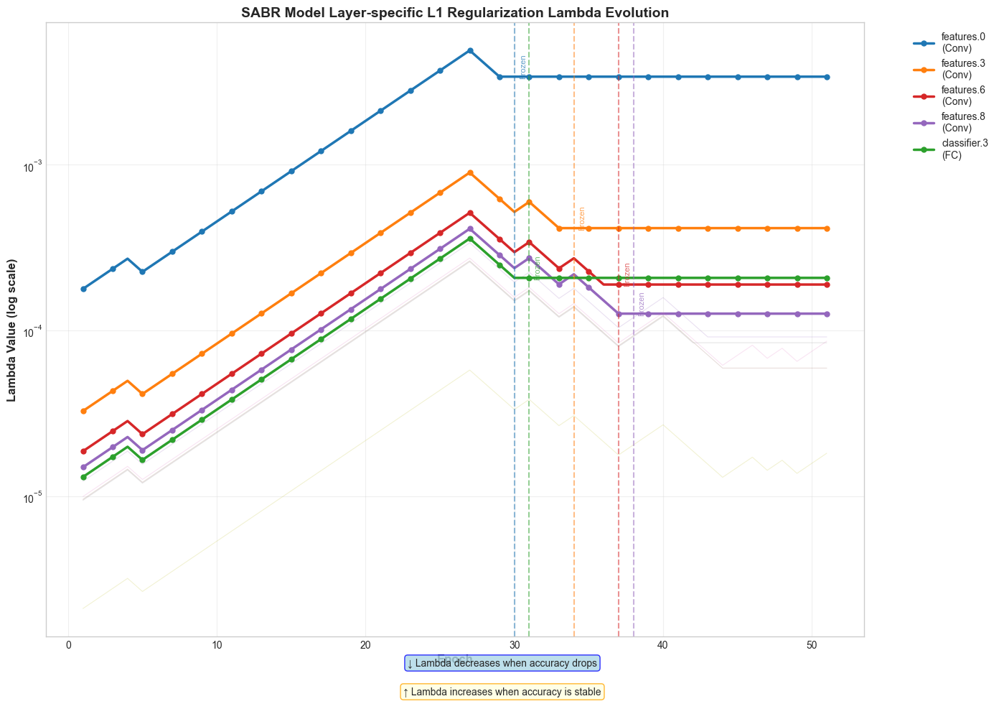

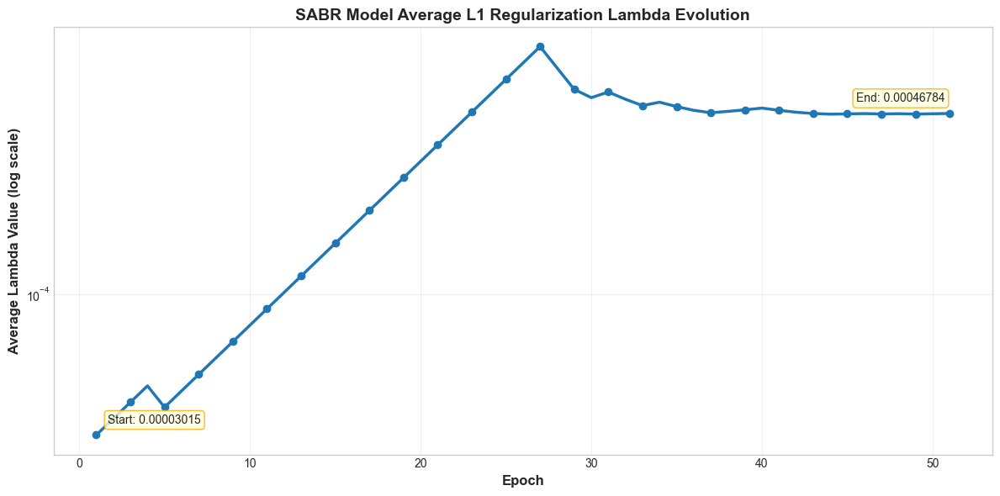

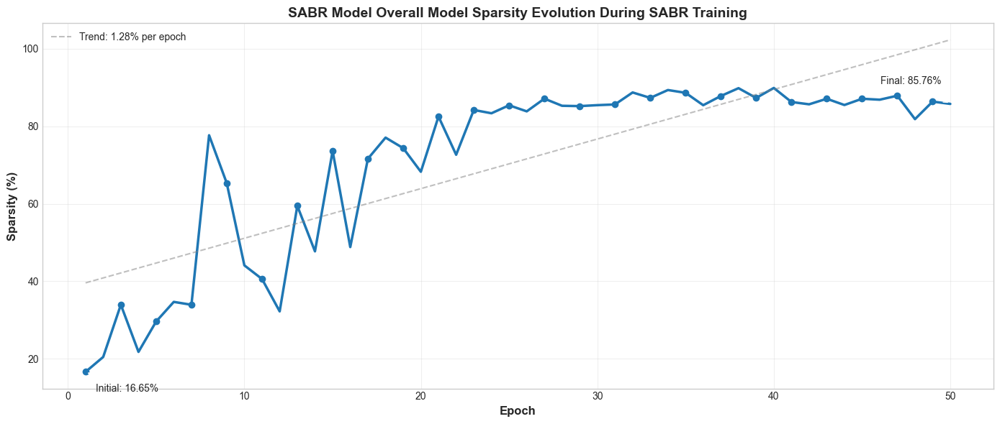

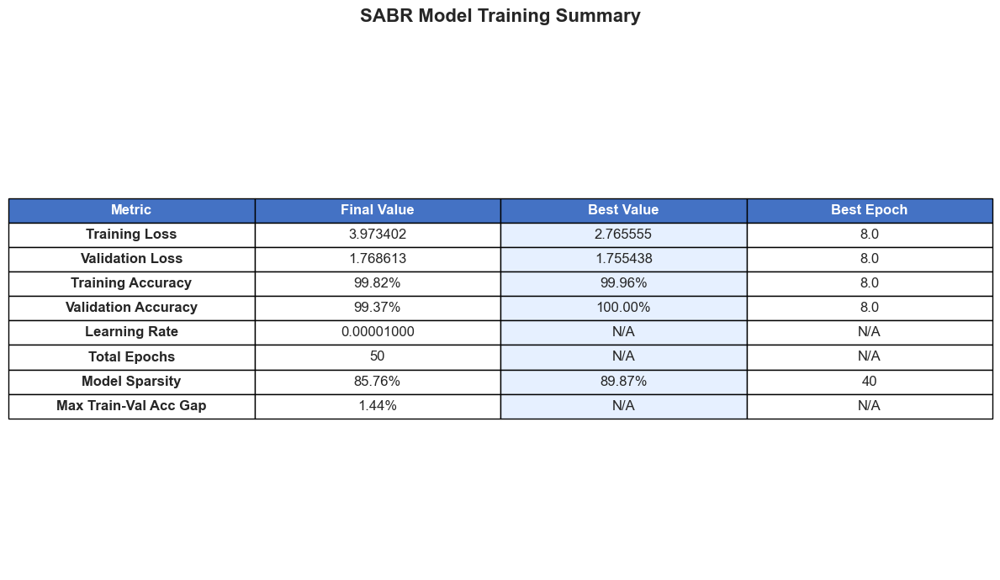

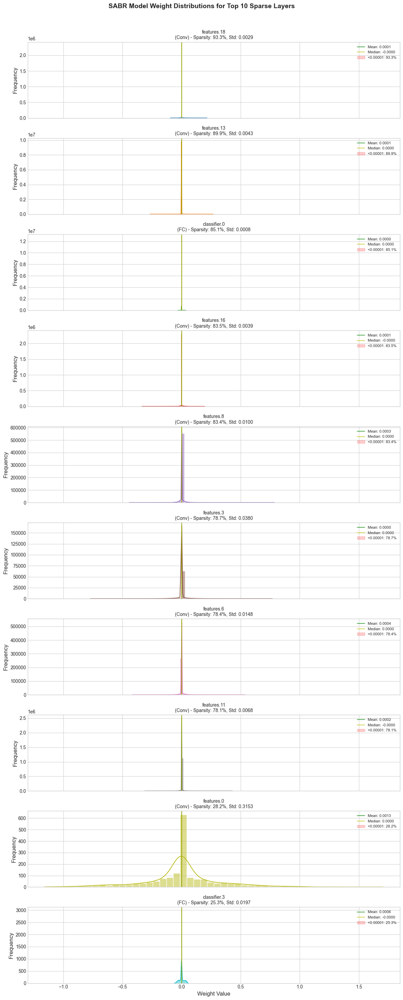

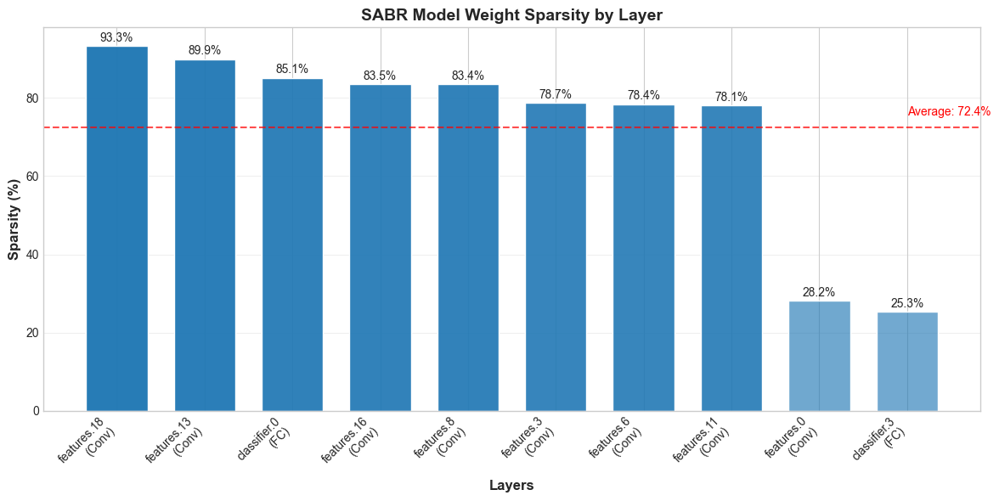

In [8]:
# Load the best model from Phase 1
print("Loading best model from Phase 1...")
load_model(model, os.path.join(base_dir, 'best_model.pth'), device)

# Run Phase 2: SABR Regularization
print("\nPhase 2: SABR Regularization")
print("=" * 50)

# Specify number of epochs for SABR training
sabr_epochs = 50

sabr_model, sabr_history, regularizer, sabr_val_acc = train_with_sabr(
    model, train_loader, val_loader, 
    num_epochs=sabr_epochs, 
    device=device, 
    output_dir=sabr_dir, 
    use_gpu_dataset=use_gpu_dataset,
    teta1=teta1, 
    growth_rate=growth_rate, 
    decrease_rate=decrease_rate, 
    accuracy_threshold=accuracy_threshold, 
    k_epoch=k_epoch,
    learning_rate=learning_rate,
    scheduler_factor=scheduler_factor,
    scheduler_patience=scheduler_patience,
    min_lr=min_lr,
    epsilon=epsilon
)

## Phase 3: Post-Training Pruning

In this final phase, we'll apply post-training pruning to convert near-zero weights to exact zeros for deployment. We'll evaluate the pruned model's performance to ensure it maintains accuracy while achieving high sparsity.

In [9]:
def apply_pruning(model, test_loader, output_dir='results/pruned_model', device='cuda',
                 use_gpu_dataset=False, use_std_based=True, teta1=0.2, gamma=0.1, epsilon=1e-5,
                 image_size=128):
    """Apply post-training pruning to a model."""
    from notebook_utils.operations_utils import calculate_pruned_operations
    os.makedirs(output_dir, exist_ok=True)
    
    # Move model to device
    model.to(device)
    
    # Define loss function for evaluation
    criterion = nn.CrossEntropyLoss()
    
    # Evaluate original model
    print("\nEvaluating original model...")
    original_loss, original_acc = evaluate_model(model, test_loader, criterion, device, use_gpu_dataset)
    print(f'Original Model - Test Loss: {original_loss:.4f}, Test Accuracy: {original_acc:.4f}')
    
    # Calculate initial sparsity
    initial_sparsity, total_params, initial_zero = calculate_overall_sparsity(model, epsilon)
    print(f"Initial sparsity: {initial_sparsity:.2f}% ({initial_zero}/{total_params} weights near zero)")
    
    # Apply pruning
    if use_std_based:
        print(f"\nApplying std-based pruning with teta1 = {teta1} and gamma = {gamma}...")
    else:
        print(f"\nApplying threshold-based pruning with epsilon = {epsilon}...")
    
    pruned_model, pruning_stats = prune_model(model, epsilon, use_std_based, teta1, gamma)
    
    # Evaluate pruned model
    print("\nEvaluating pruned model...")
    pruned_loss, pruned_acc = evaluate_model(pruned_model, test_loader, criterion, device, use_gpu_dataset)
    print(f'Pruned Model - Test Loss: {pruned_loss:.4f}, Test Accuracy: {pruned_acc:.4f}')
    print(f'Accuracy change: {pruned_acc - original_acc:.4f}')
    
    # Calculate overall sparsity
    total_params = sum(stats['total_params'] for stats in pruning_stats.values())
    total_non_zero = sum(stats['non_zero_after'] for stats in pruning_stats.values())
    total_pruned = total_params - total_non_zero
    overall_sparsity = (total_pruned / total_params) * 100
    
    # Print summary
    print("\n" + "="*50)
    print("PRUNING SUMMARY")
    print("="*50)
    if use_std_based:
        print(f"Pruning method: Standard deviation-based (teta1 = {teta1}, gamma = {gamma})")
    else:
        print(f"Pruning method: Threshold-based (epsilon = {epsilon})")
    print(f"Original accuracy: {original_acc:.4f}")
    print(f"Pruned accuracy: {pruned_acc:.4f}")
    print(f"Accuracy change: {pruned_acc - original_acc:.4f}")
    print(f"Initial sparsity: {initial_sparsity:.2f}%")
    print(f"Final sparsity: {overall_sparsity:.2f}%")
    print(f"Sparsity increase: {overall_sparsity - initial_sparsity:.2f}%")
    print(f"Total parameters: {total_params:,}")
    print(f"Non-zero parameters: {total_non_zero:,}")
    print(f"Pruned parameters: {total_pruned:,}")
    print("="*50)
    
    # Save the pruned model
    pruning_method = f"std_based_teta1_{teta1}_gamma_{gamma}" if use_std_based else f"threshold_based_epsilon_{epsilon}"
    model_filename = f'pruned_model_{pruning_method}.pth'
    save_model(pruned_model, os.path.join(output_dir, model_filename))
    
    # Create summary file
    with open(os.path.join(output_dir, 'pruning_summary.txt'), 'w') as f:
        f.write("PRUNING SUMMARY\n")
        f.write("="*50 + "\n")
        if use_std_based:
            f.write(f"Pruning method: Standard deviation-based (teta1 = {teta1}, gamma = {gamma})\n")
        else:
            f.write(f"Pruning method: Threshold-based (epsilon = {epsilon})\n")
        f.write(f"Original accuracy: {original_acc:.4f}\n")
        f.write(f"Pruned accuracy: {pruned_acc:.4f}\n")
        f.write(f"Accuracy change: {pruned_acc - original_acc:.4f}\n")
        f.write(f"Initial sparsity: {initial_sparsity:.2f}%\n")
        f.write(f"Final sparsity: {overall_sparsity:.2f}%\n")
        f.write(f"Sparsity increase: {overall_sparsity - initial_sparsity:.2f}%\n")
        f.write(f"Total parameters: {total_params:,}\n")
        f.write(f"Non-zero parameters: {total_non_zero:,}\n")
        f.write(f"Pruned parameters: {total_pruned:,}\n")
        f.write("="*50 + "\n\n")
        
        f.write("LAYER-WISE SPARSITY\n")
        f.write("="*50 + "\n")
        for layer_name, stats in pruning_stats.items():
            f.write(f"Layer: {layer_name}\n")
            f.write(f"  Total Parameters: {stats['total_params']:,}\n")
            f.write(f"  Non-Zero Parameters: {stats['non_zero_after']:,}\n")
            f.write(f"  Pruned Parameters: {stats['pruned_params']:,}\n")
            f.write(f"  Sparsity: {stats['sparsity_percentage']:.2f}%\n")
            f.write(f"  Threshold: {stats['threshold']:.6f}\n")
            if use_std_based and 'std_value' in stats:
                f.write(f"  Standard Deviation: {stats['std_value']:.6f}\n")
            f.write("\n")
    
    # Calculate operations for the pruned model
    pruned_operations = calculate_pruned_operations(pruned_model, pruning_stats, input_size=(3, image_size, image_size))
    
    # Create visualization of computational savings
    plot_computational_savings(
        pruned_operations,
        {
            'original_acc': original_acc,
            'pruned_acc': pruned_acc,
            'initial_sparsity': initial_sparsity,
            'final_sparsity': overall_sparsity,
            'total_params': total_params,
            'non_zero_params': total_non_zero,
            'pruned_params': total_pruned
        },
        output_dir=output_dir,
        title_prefix="current model"
    )
    plt.show()
    
    # Return the pruned model, stats, pruning results, and operations
    pruning_results = {
        'original_acc': original_acc,
        'pruned_acc': pruned_acc,
        'initial_sparsity': initial_sparsity,
        'final_sparsity': overall_sparsity,
        'total_params': total_params,
        'non_zero_params': total_non_zero,
        'pruned_params': total_pruned
    }
    
    return pruned_model, pruning_stats, pruning_results, pruned_operations

Loading best model from Phase 2...
Model loaded from notebook_results\sabr_model\final_model.pth

Phase 3: Post-Training Pruning

Evaluating original model...


Evaluating: 100%|██████████| 22/22 [00:01<00:00, 19.32it/s, loss=1.7680, acc=1.0000]


Original Model - Test Loss: 1.7663, Test Accuracy: 0.9943
Initial sparsity: 85.76% (18927038/22069952 weights near zero)

Applying std-based pruning with teta1 = 0.2 and gamma = 0.1...
Layer features.0.weight: std = 0.399691, threshold = 0.079938
  (Ignored 653 weights < 0.1 when calculating std)
Layer features.3.weight: std = 0.094213, threshold = 0.018843
  (Ignored 61726 weights < 0.1 when calculating std)
Layer features.6.weight: std = 0.043900, threshold = 0.008780
  (Ignored 261463 weights < 0.1 when calculating std)
Layer features.8.weight: std = 0.034129, threshold = 0.006826
  (Ignored 539660 weights < 0.1 when calculating std)
Layer features.11.weight: std = 0.027795, threshold = 0.005559
  (Ignored 1109570 weights < 0.1 when calculating std)
Layer features.13.weight: std = 0.022324, threshold = 0.004465
  (Ignored 2272914 weights < 0.1 when calculating std)
Layer features.16.weight: std = 0.020127, threshold = 0.004025
  (Ignored 2274036 weights < 0.1 when calculating std)
L

Evaluating: 100%|██████████| 22/22 [00:00<00:00, 24.11it/s, loss=1.7798, acc=0.9821]


Pruned Model - Test Loss: 1.7780, Test Accuracy: 0.9914
Accuracy change: -0.0029

PRUNING SUMMARY
Pruning method: Standard deviation-based (teta1 = 0.2, gamma = 0.1)
Original accuracy: 0.9943
Pruned accuracy: 0.9914
Accuracy change: -0.0029
Initial sparsity: 85.76%
Final sparsity: 97.66%
Sparsity increase: 11.90%
Total parameters: 22,069,952
Non-zero parameters: 515,534
Pruned parameters: 21,554,418
Model saved to notebook_results\pruned_model\pruned_model_std_based_teta1_0.2_gamma_0.1.pth


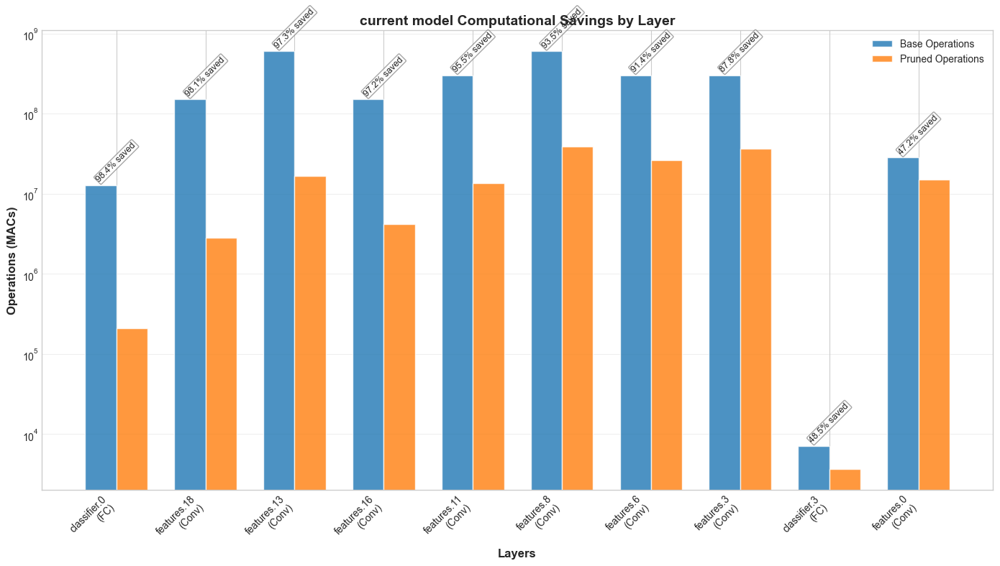

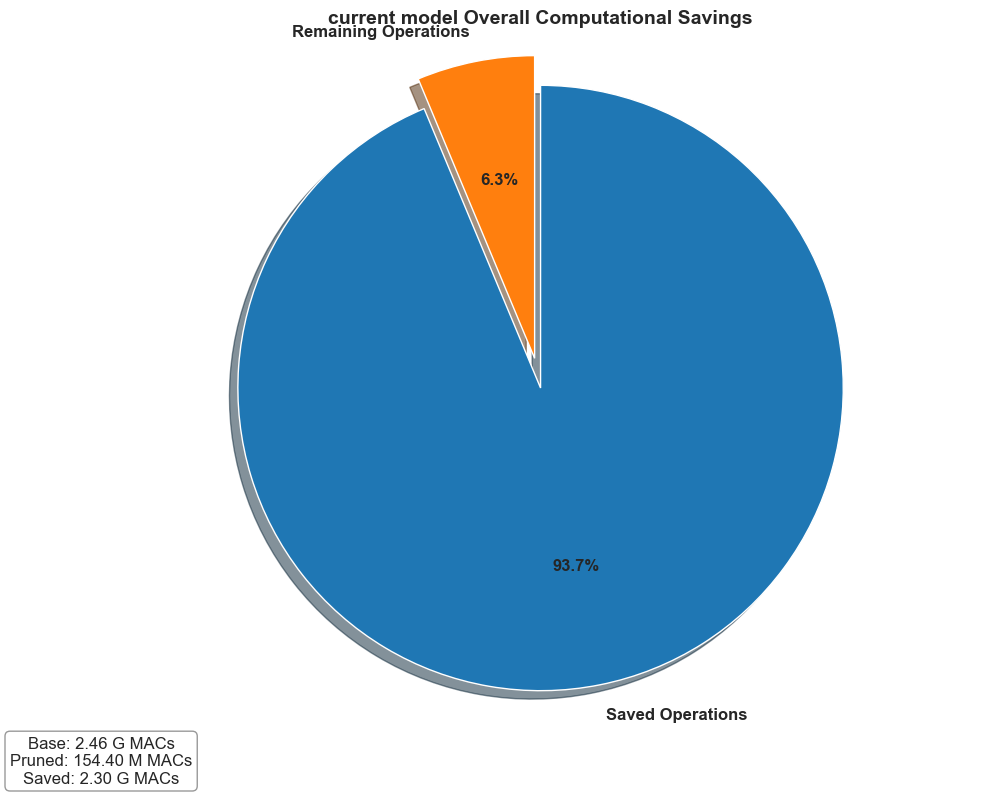

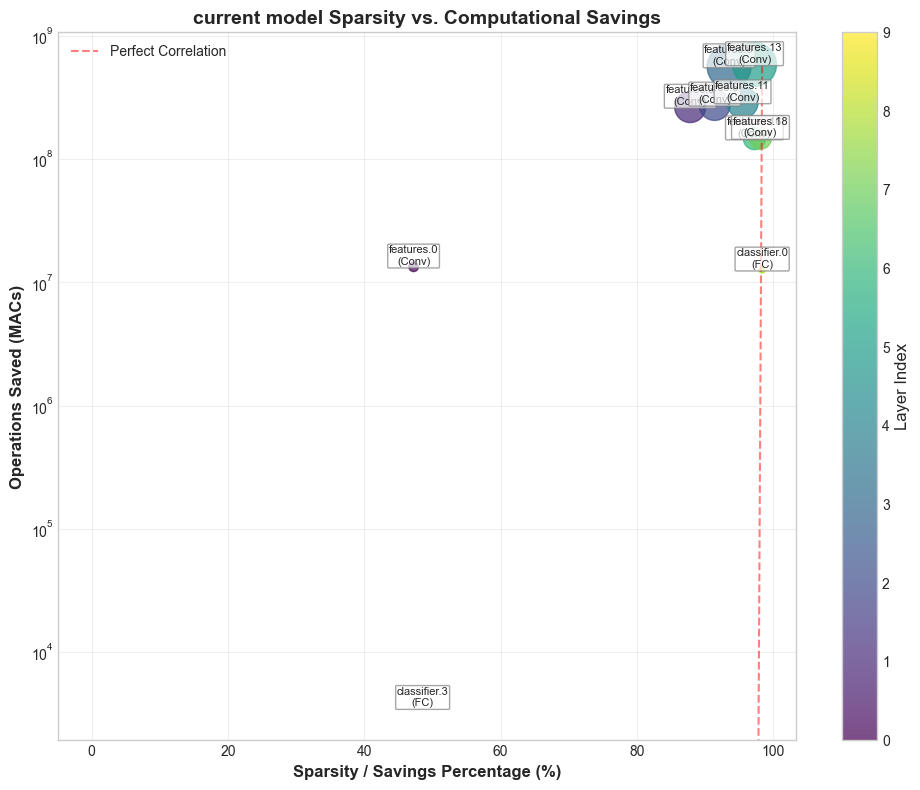

In [17]:
# Load the best model from Phase 2
print("Loading best model from Phase 2...")
load_model(model, os.path.join(sabr_dir, 'final_model.pth'), device)

# Run Phase 3: Post-Training Pruning
print("\nPhase 3: Post-Training Pruning")
print("=" * 50)

pruned_model, pruning_stats, pruning_results, pruned_operations = apply_pruning(
    model, test_loader,
    output_dir=pruned_dir,
    device=device,
    use_gpu_dataset=use_gpu_dataset,
    use_std_based=True,
    teta1=pruning_teta1*1,
    gamma=pruning_gamma*1,
    epsilon=epsilon,
    image_size=image_size
)

## Sparsity Analysis and Computational Savings

Now that we have our pruned model, let's analyze the sparsity and calculate the computational savings for each layer and for the overall model.

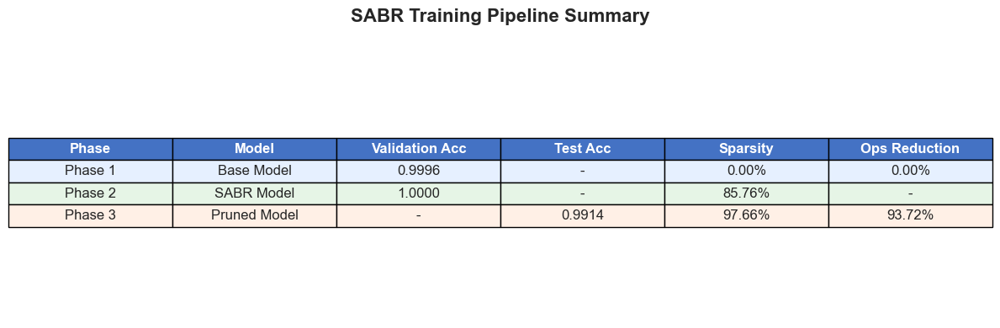

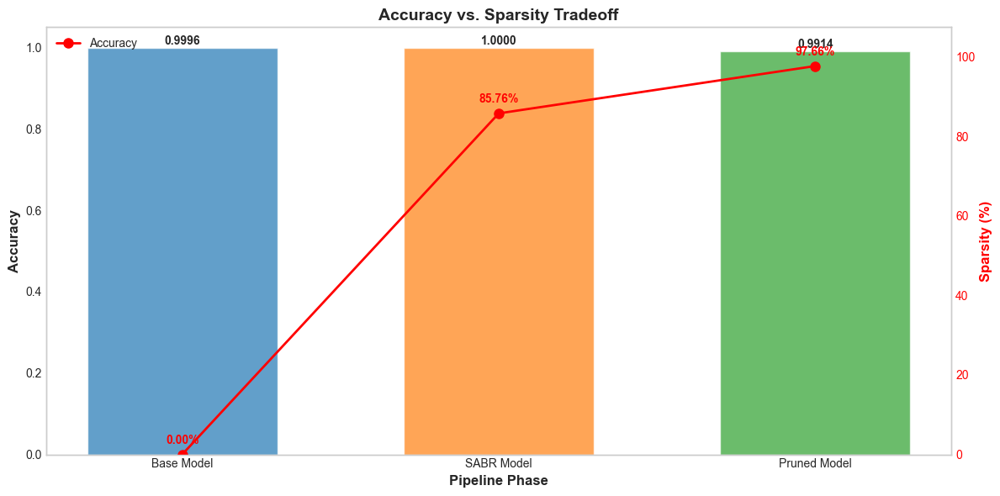

Final summary saved to: notebook_results\final_summary.txt


In [18]:
# Create final summary table
summary_path = create_final_summary_table(
    base_val_acc, 
    sabr_val_acc, 
    pruning_results, 
    pruned_operations, 
    output_dir
)
plt.show()

print(f"Final summary saved to: {summary_path}")

### Relationship Between Sparsity and Operations Reduction

When a neural network contains sparse weights (exact zeros), we can skip the multiply-accumulate operations (MACs) associated with those weights during inference. The relationship is directly proportional:

- For a fully-connected layer with input size $m$ and output size $n$, the total number of MACs is $m \times n$.
- If the weight matrix has a sparsity of $s\%$, then approximately $s\%$ of these operations can be skipped.
- The actual number of MACs becomes $(1 - \frac{s}{100}) \times m \times n$

For convolutional layers, the calculation is similar but involves more dimensions:
- A convolutional layer with $C_{in}$ input channels, $C_{out}$ output channels, and kernel size $K \times K$ has approximately $C_{in} \times C_{out} \times K \times K \times H_{out} \times W_{out}$ MACs.
- With a sparsity of $s\%$, the number of MACs reduces to $(1 - \frac{s}{100}) \times C_{in} \times C_{out} \times K \times K \times H_{out} \times W_{out}$

Note that fully materializing these computational savings requires hardware and/or software that can efficiently skip operations for zero weights. Many modern deep learning frameworks and hardware accelerators have optimizations for sparse operations, but the extent of actual speedup depends on the specific deployment environment.

## Visual Testing of the Pruned Model

Let's test our pruned model on some sample images from the dataset to verify that it still performs well on real data.

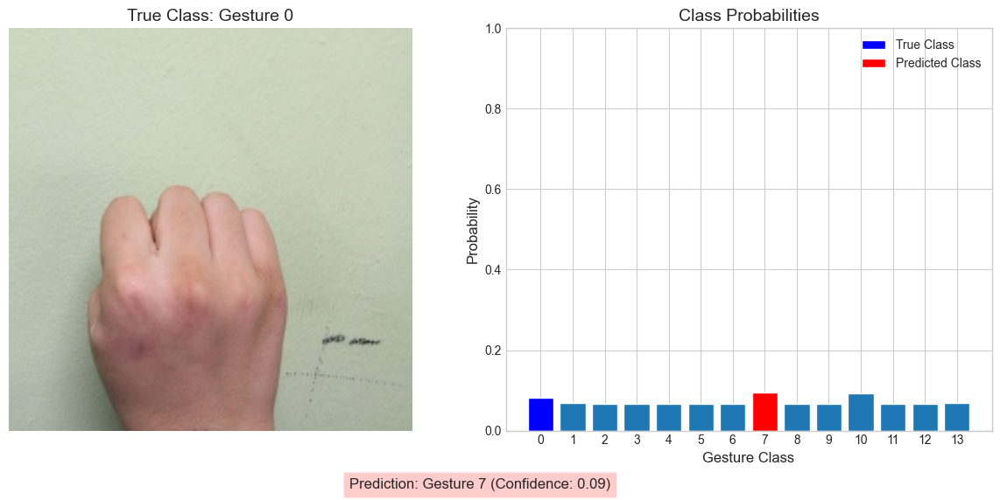

Sample 1: ✗ Incorrect | True: Gesture 0 | Predicted: Gesture 7 | Confidence: 0.09


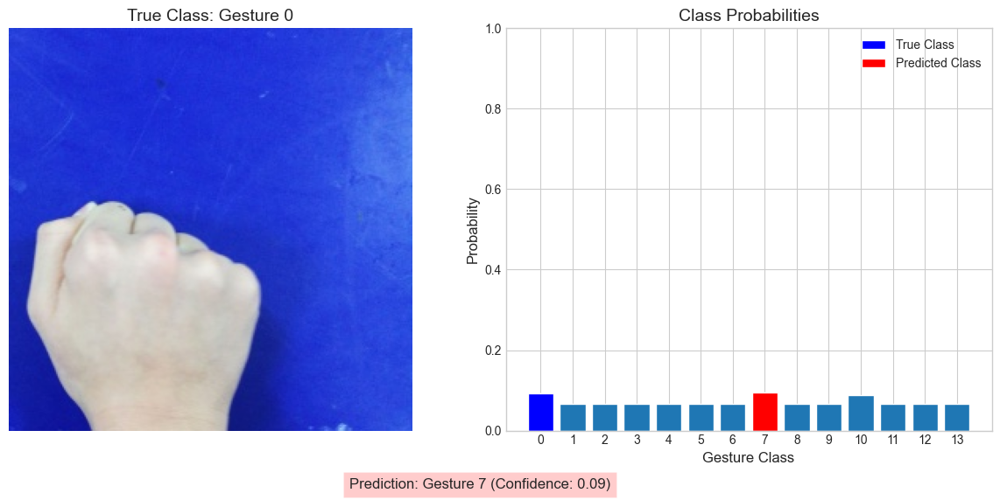

Sample 2: ✗ Incorrect | True: Gesture 0 | Predicted: Gesture 7 | Confidence: 0.09


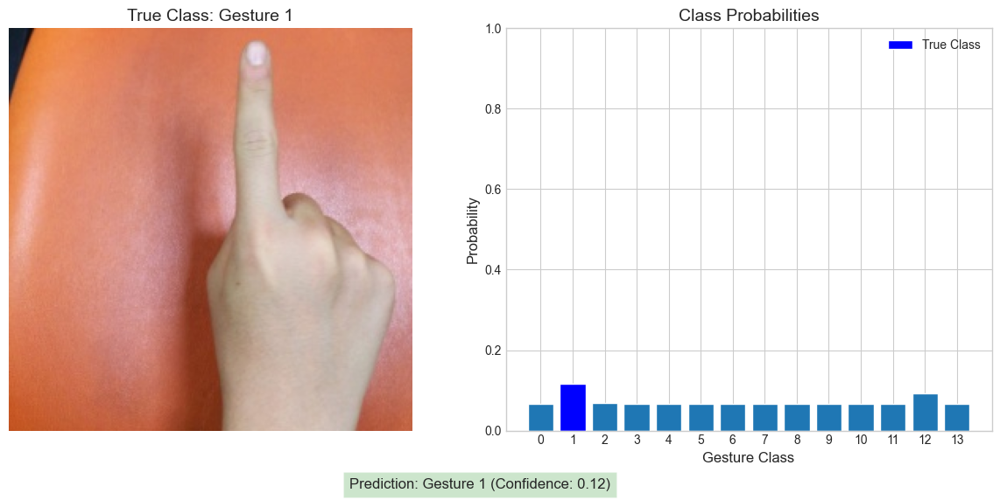

Sample 3: ✓ Correct | True: Gesture 1 | Predicted: Gesture 1 | Confidence: 0.12


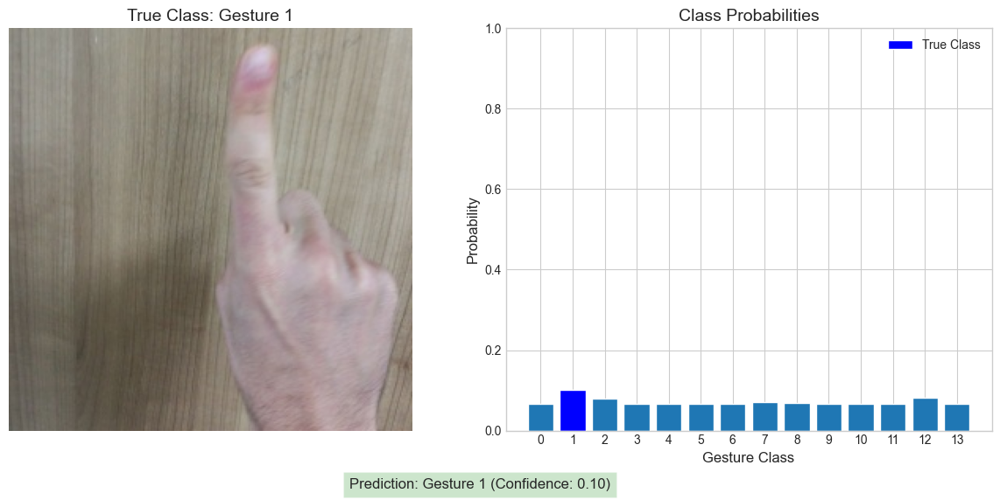

Sample 4: ✓ Correct | True: Gesture 1 | Predicted: Gesture 1 | Confidence: 0.10


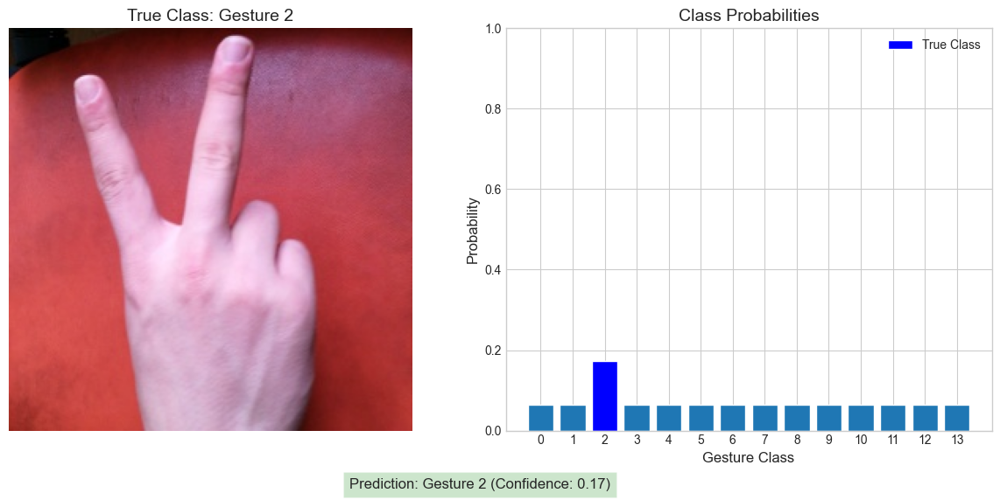

Sample 5: ✓ Correct | True: Gesture 2 | Predicted: Gesture 2 | Confidence: 0.17


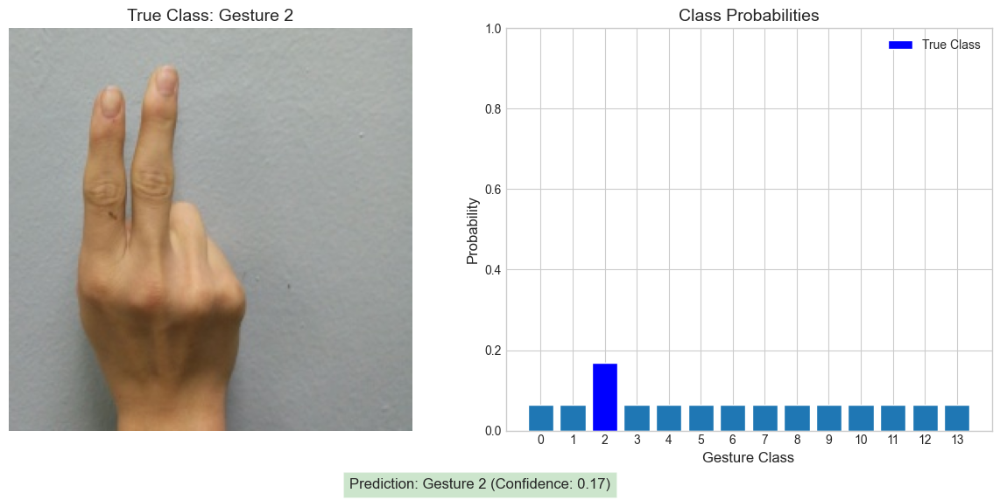

Sample 6: ✓ Correct | True: Gesture 2 | Predicted: Gesture 2 | Confidence: 0.17


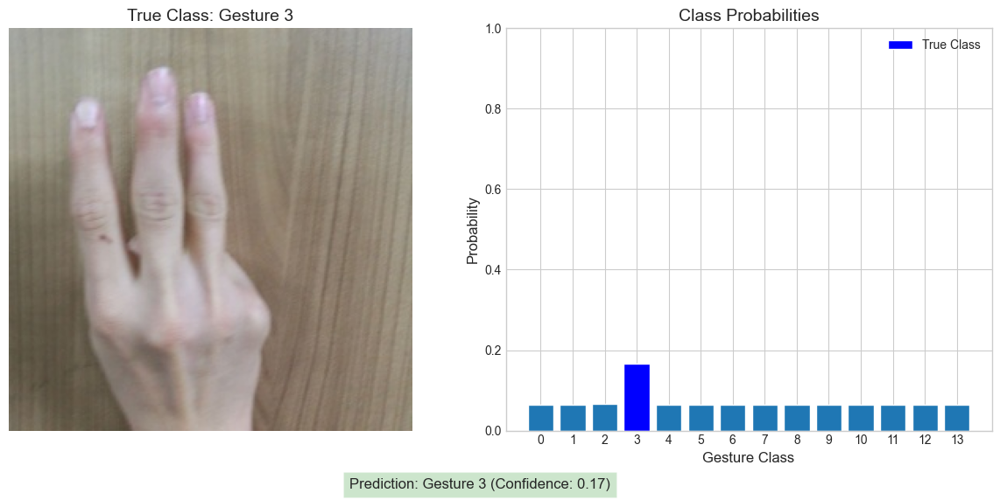

Sample 7: ✓ Correct | True: Gesture 3 | Predicted: Gesture 3 | Confidence: 0.17


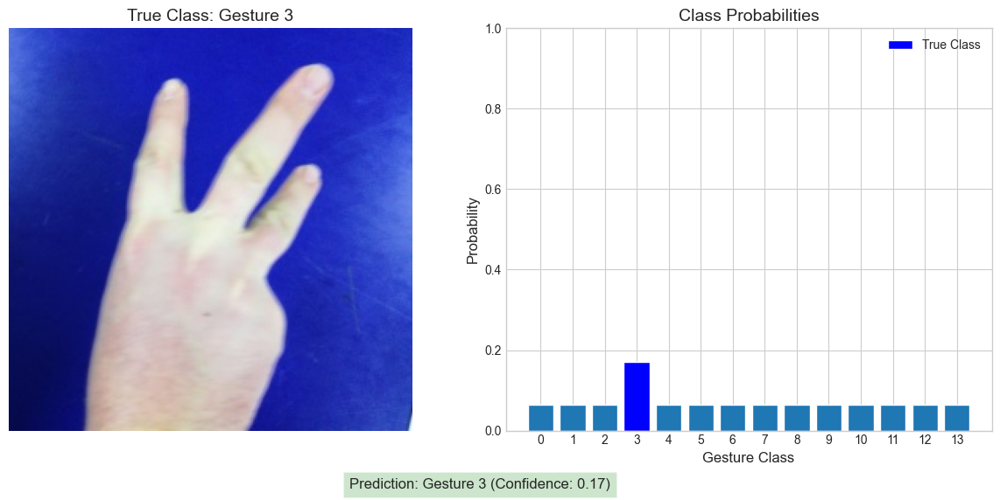

Sample 8: ✓ Correct | True: Gesture 3 | Predicted: Gesture 3 | Confidence: 0.17


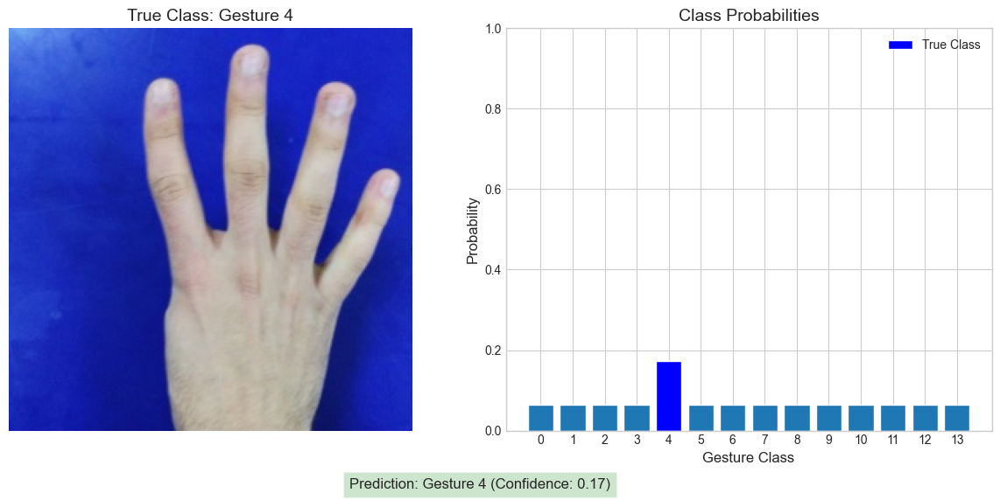

Sample 9: ✓ Correct | True: Gesture 4 | Predicted: Gesture 4 | Confidence: 0.17


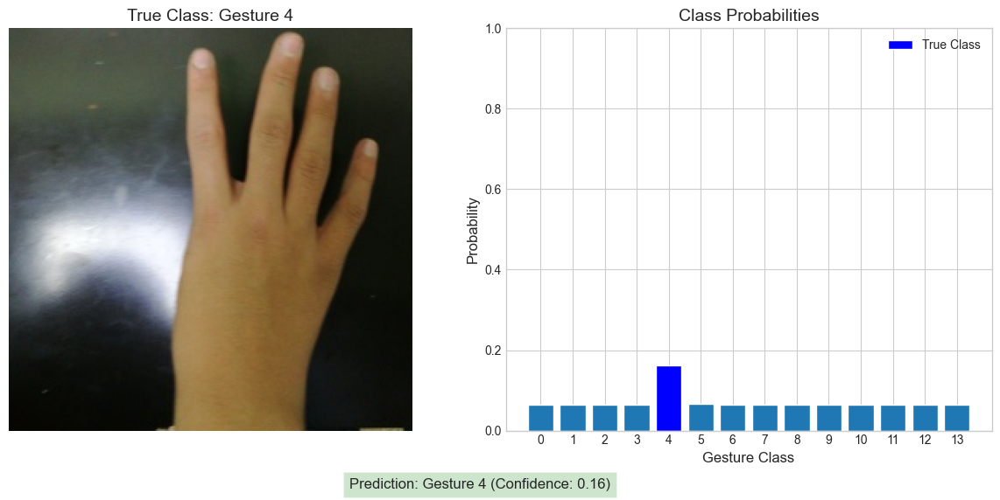

Sample 10: ✓ Correct | True: Gesture 4 | Predicted: Gesture 4 | Confidence: 0.16


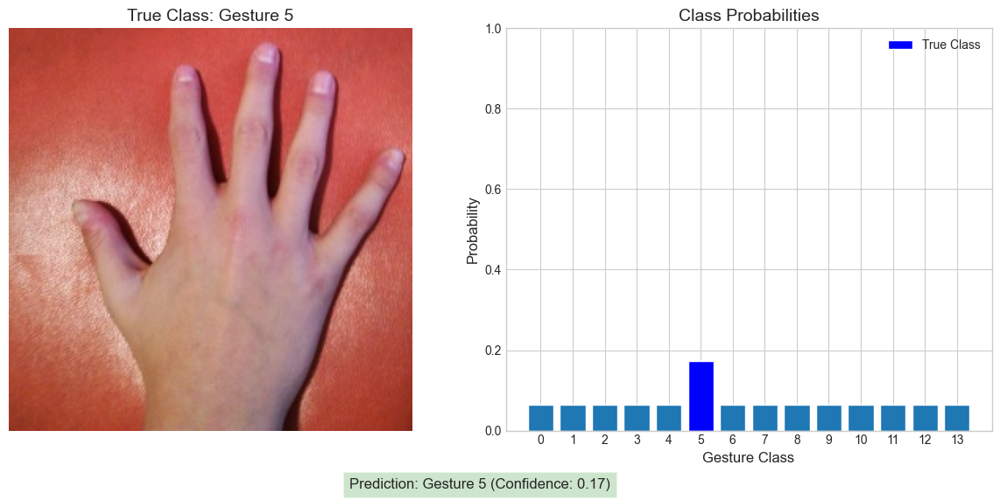

Sample 11: ✓ Correct | True: Gesture 5 | Predicted: Gesture 5 | Confidence: 0.17


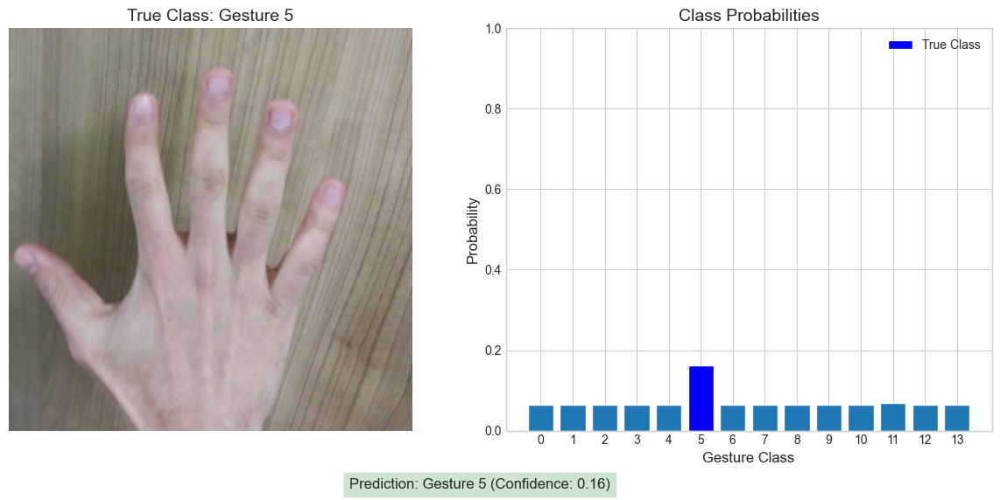

Sample 12: ✓ Correct | True: Gesture 5 | Predicted: Gesture 5 | Confidence: 0.16


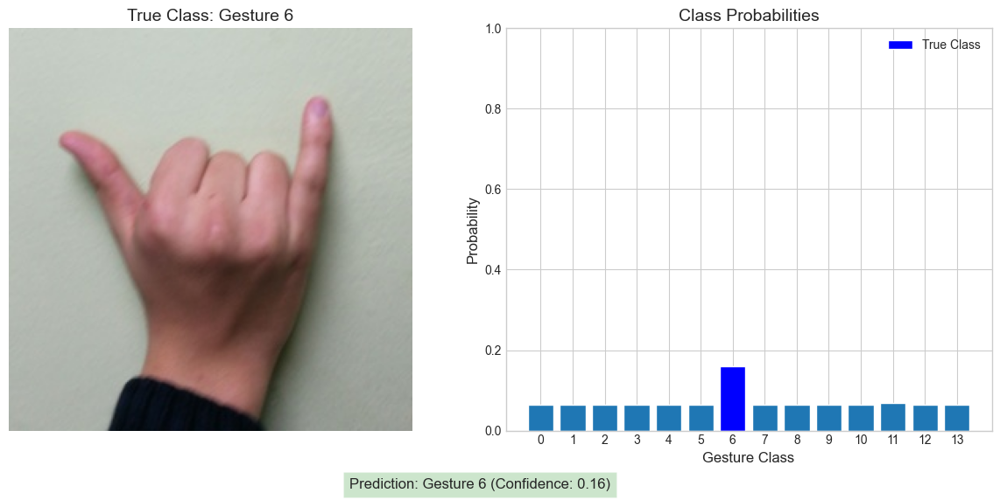

Sample 13: ✓ Correct | True: Gesture 6 | Predicted: Gesture 6 | Confidence: 0.16


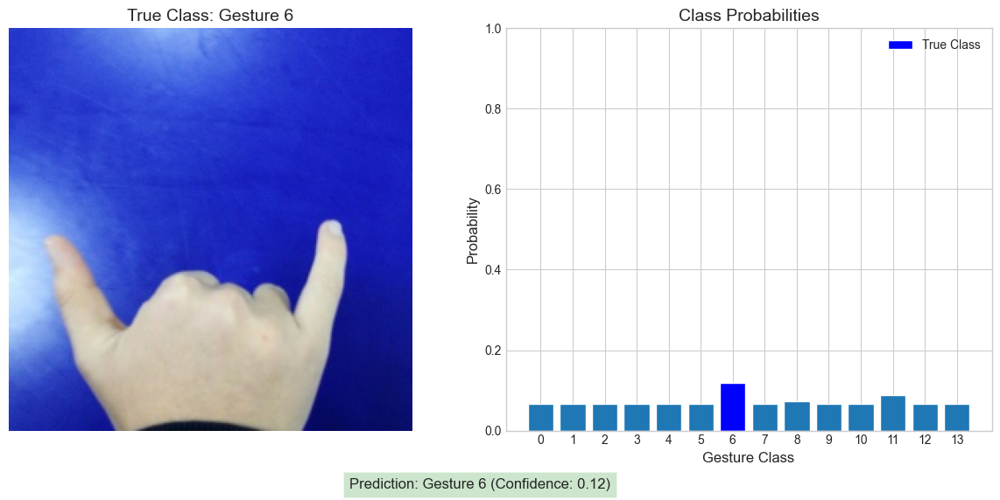

Sample 14: ✓ Correct | True: Gesture 6 | Predicted: Gesture 6 | Confidence: 0.12


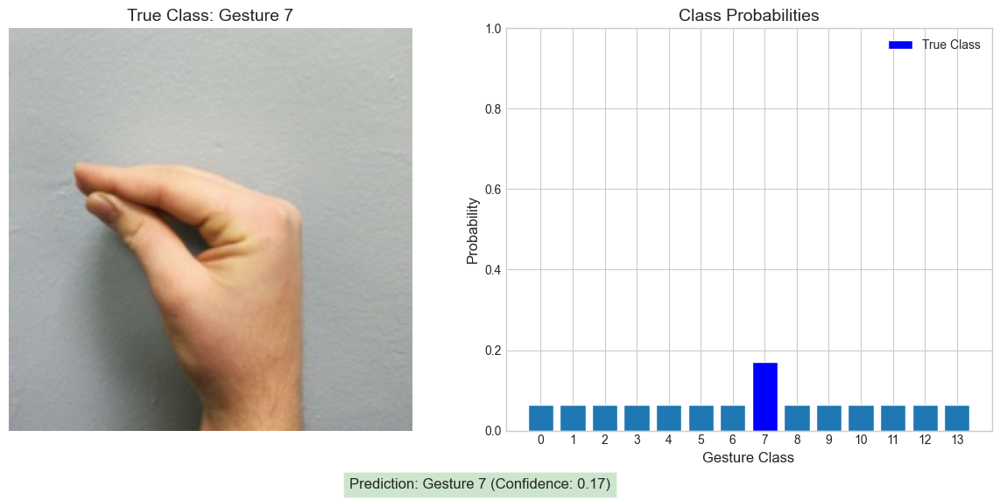

Sample 15: ✓ Correct | True: Gesture 7 | Predicted: Gesture 7 | Confidence: 0.17


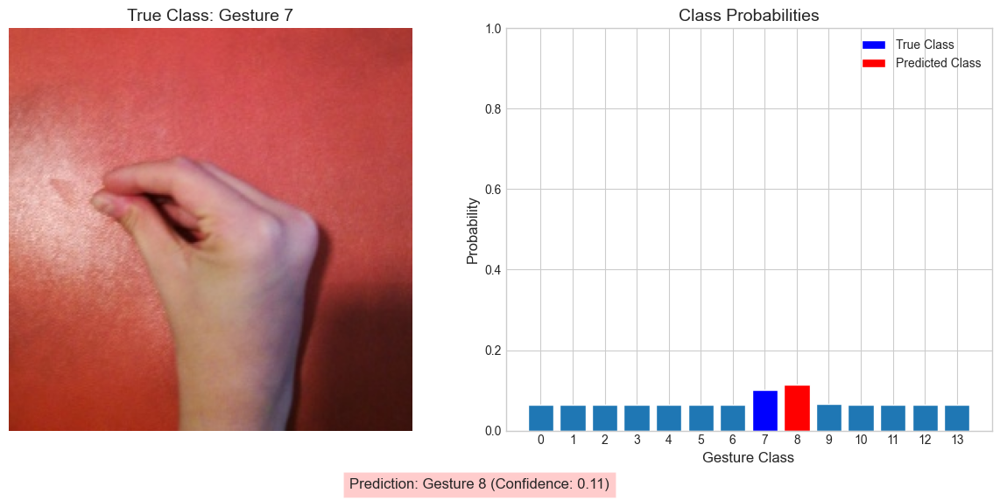

Sample 16: ✗ Incorrect | True: Gesture 7 | Predicted: Gesture 8 | Confidence: 0.11


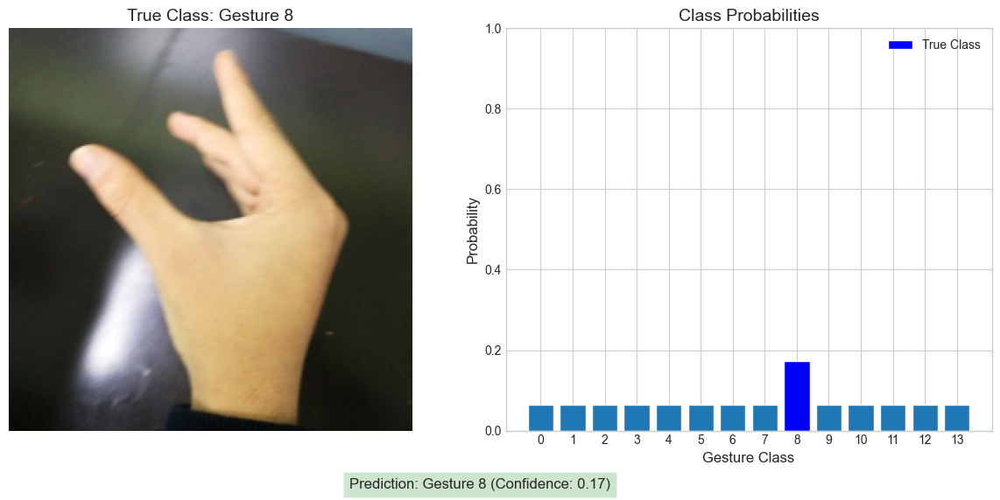

Sample 17: ✓ Correct | True: Gesture 8 | Predicted: Gesture 8 | Confidence: 0.17


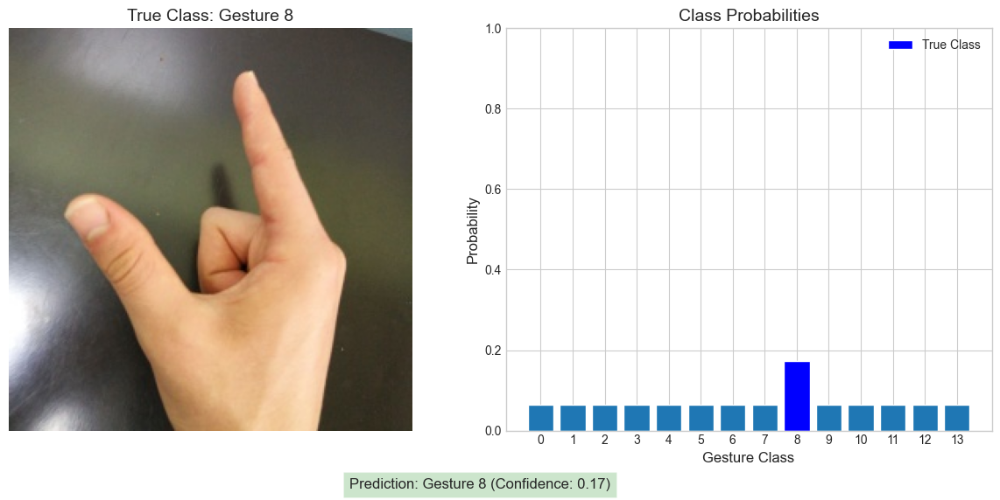

Sample 18: ✓ Correct | True: Gesture 8 | Predicted: Gesture 8 | Confidence: 0.17


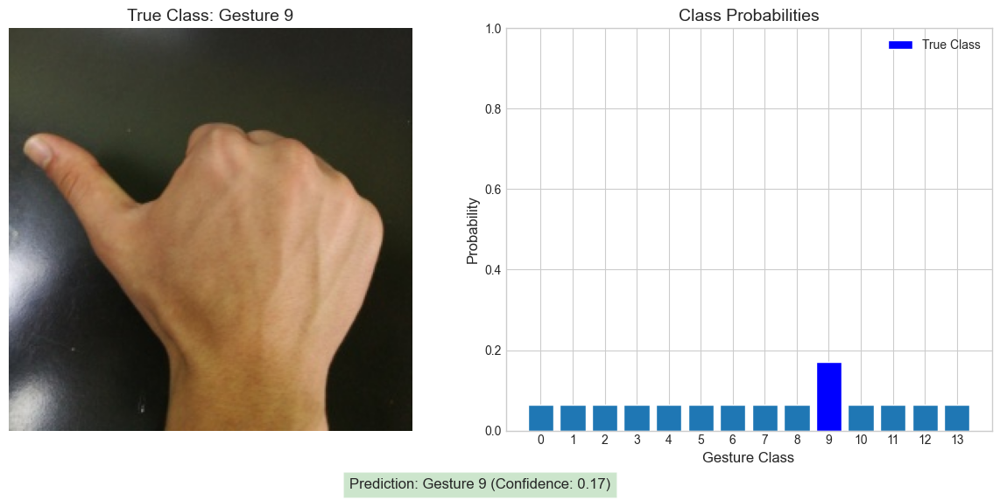

Sample 19: ✓ Correct | True: Gesture 9 | Predicted: Gesture 9 | Confidence: 0.17


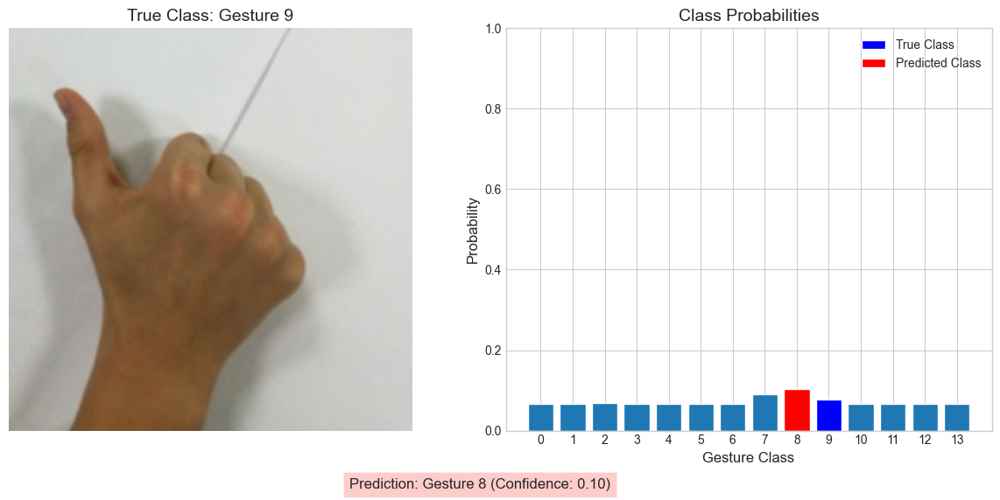

Sample 20: ✗ Incorrect | True: Gesture 9 | Predicted: Gesture 8 | Confidence: 0.10


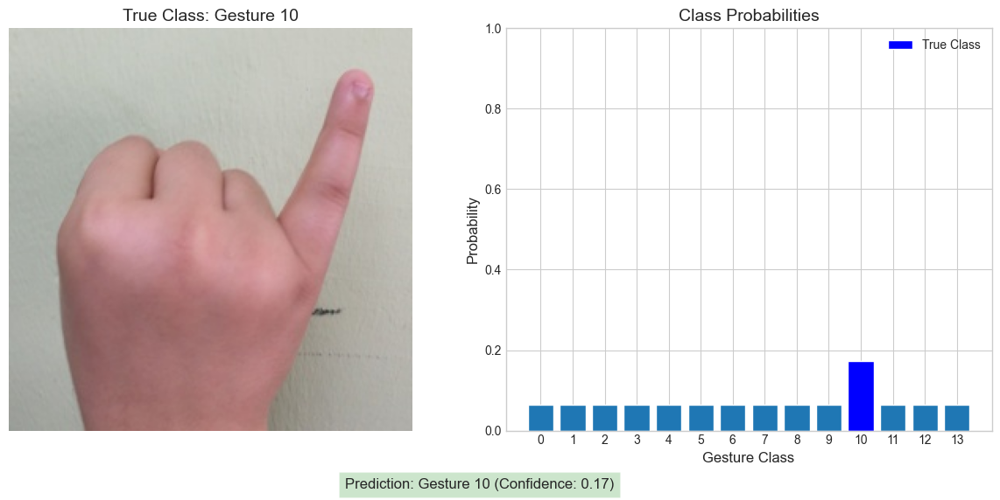

Sample 21: ✓ Correct | True: Gesture 10 | Predicted: Gesture 10 | Confidence: 0.17


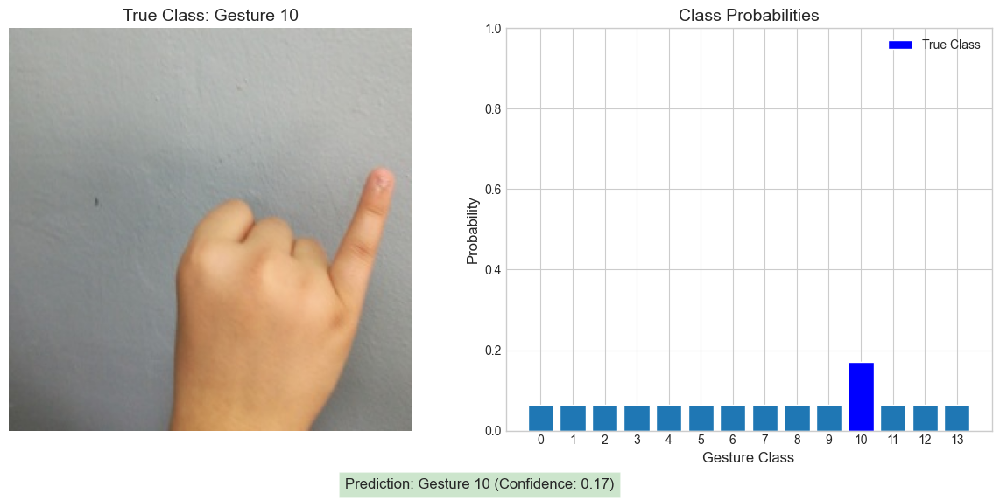

Sample 22: ✓ Correct | True: Gesture 10 | Predicted: Gesture 10 | Confidence: 0.17


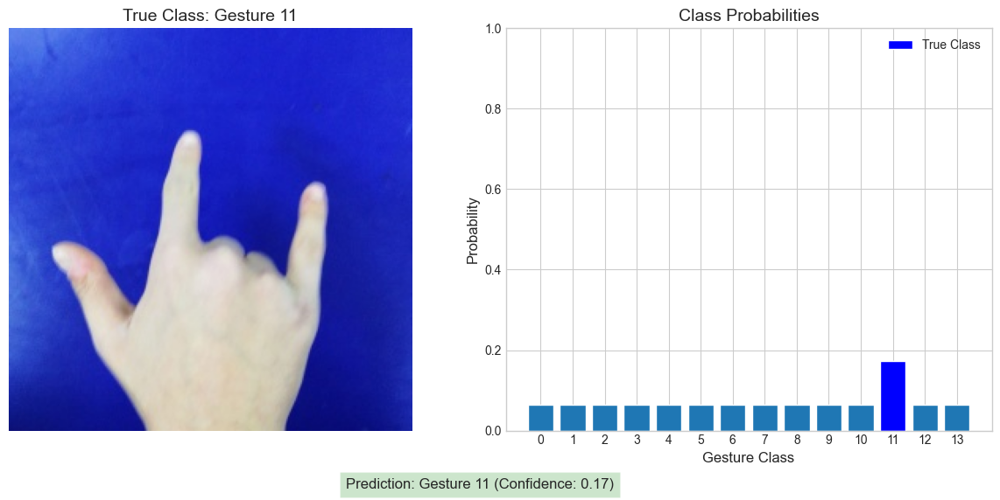

Sample 23: ✓ Correct | True: Gesture 11 | Predicted: Gesture 11 | Confidence: 0.17


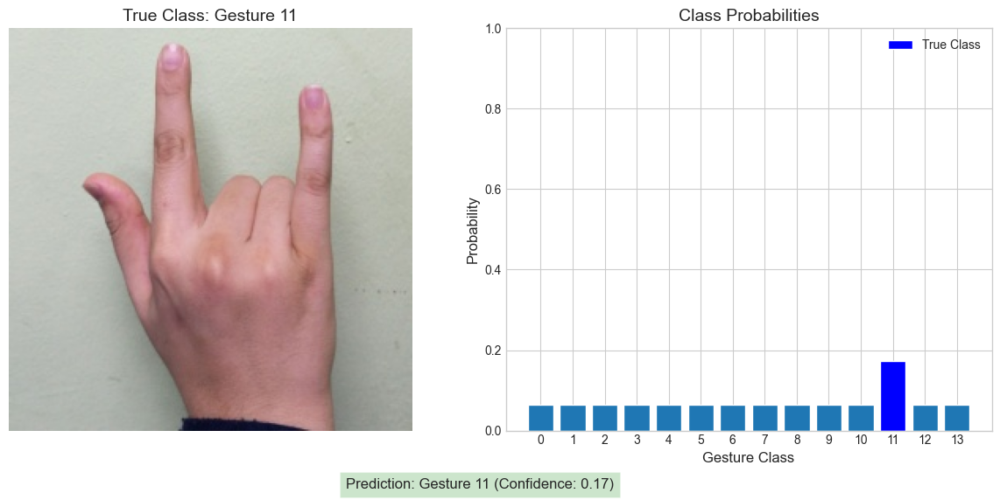

Sample 24: ✓ Correct | True: Gesture 11 | Predicted: Gesture 11 | Confidence: 0.17


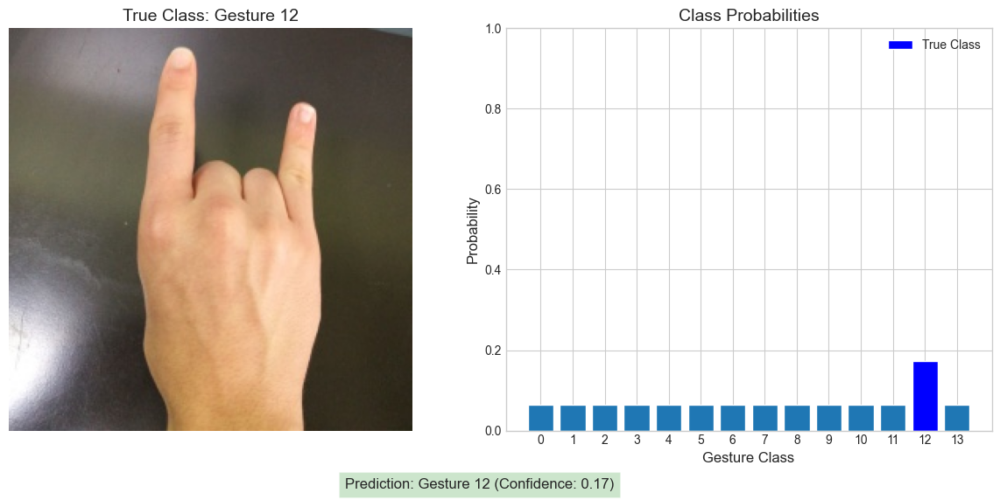

Sample 25: ✓ Correct | True: Gesture 12 | Predicted: Gesture 12 | Confidence: 0.17


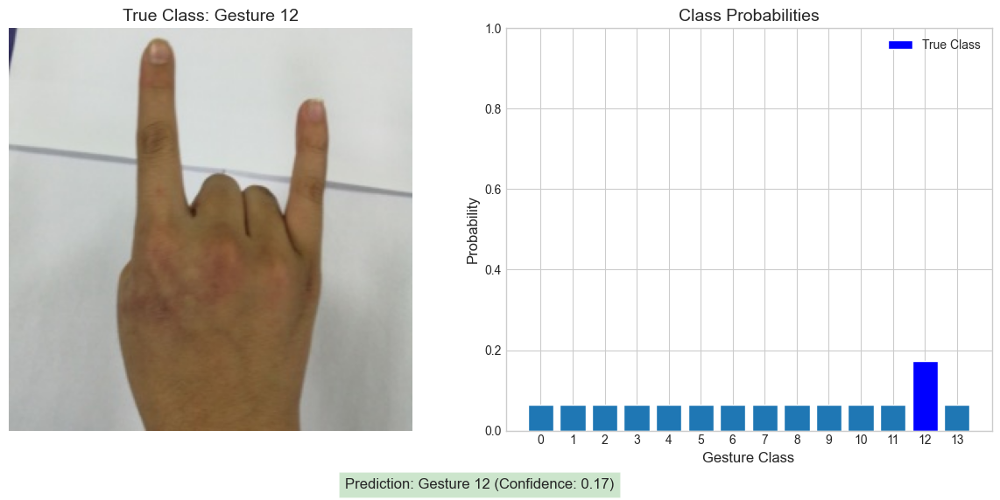

Sample 26: ✓ Correct | True: Gesture 12 | Predicted: Gesture 12 | Confidence: 0.17


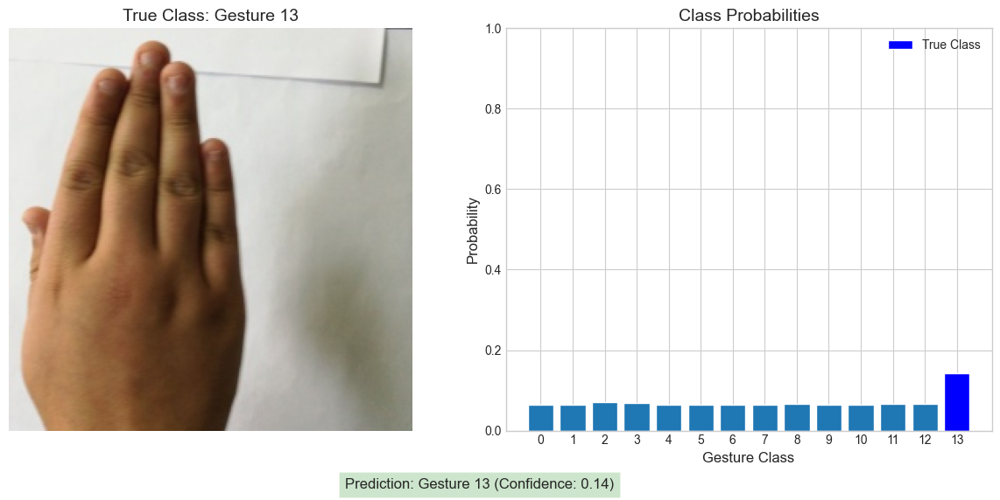

Sample 27: ✓ Correct | True: Gesture 13 | Predicted: Gesture 13 | Confidence: 0.14


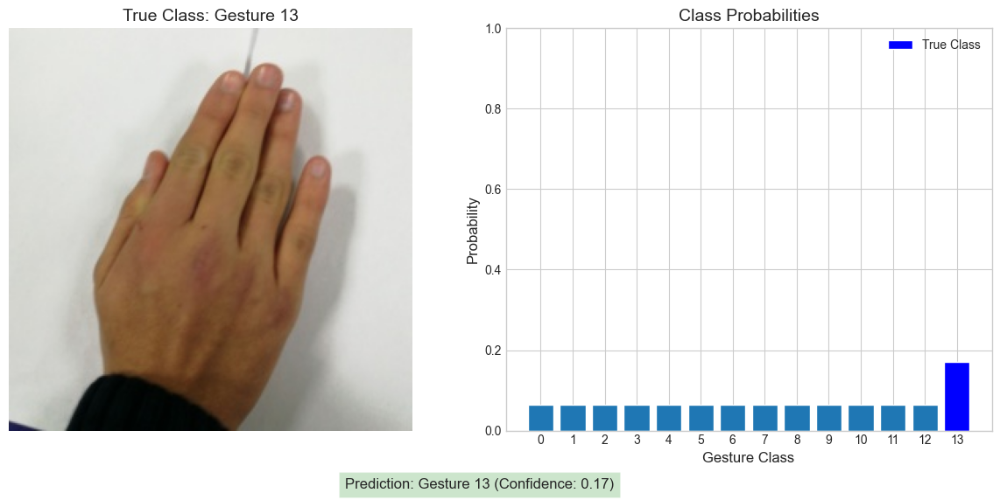

Sample 28: ✓ Correct | True: Gesture 13 | Predicted: Gesture 13 | Confidence: 0.17

Test accuracy on 28 samples: 0.86


In [12]:
# Test the pruned model on sample images
results, accuracy = test_model(
    pruned_model, 
    data_dir, 
    test_dir, 
    device=device, 
    image_size=image_size,
    num_samples_per_class=2
)

## MobileNetV2 Implementation

Now let's apply the same SABR pipeline to a MobileNetV2 model to demonstrate its versatility across different architectures.

Running complete SABR pipeline with MobileNetV2
Phase 1: Base Model Training (MobileNetV2)

Epoch 1/20


c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 2.1232, Train Acc: 0.6741
Val Loss: 1.7787, Val Acc: 0.9897
Learning Rate: 0.000100
Epoch time: 8.94 seconds
Model saved to notebook_results\mobilenet\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9897

Epoch 2/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7730, Train Acc: 0.9919
Val Loss: 1.7609, Val Acc: 0.9980
Learning Rate: 0.000100
Epoch time: 8.56 seconds
Model saved to notebook_results\mobilenet\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9980

Epoch 3/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7623, Train Acc: 0.9964
Val Loss: 1.7570, Val Acc: 0.9992
Learning Rate: 0.000100
Epoch time: 8.57 seconds
Model saved to notebook_results\mobilenet\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9992

Epoch 4/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7583, Train Acc: 0.9984
Val Loss: 1.7568, Val Acc: 0.9992
Learning Rate: 0.000100
Epoch time: 8.55 seconds

Epoch 5/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7578, Train Acc: 0.9987
Val Loss: 1.7576, Val Acc: 0.9980
Learning Rate: 0.000100
Epoch time: 8.56 seconds

Epoch 6/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7567, Train Acc: 0.9990
Val Loss: 1.7571, Val Acc: 0.9980
Learning Rate: 0.000100
Epoch time: 8.63 seconds

Epoch 7/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7574, Train Acc: 0.9989
Val Loss: 1.7570, Val Acc: 0.9980
Learning Rate: 0.000051
Epoch time: 10.07 seconds

Epoch 8/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7563, Train Acc: 0.9993
Val Loss: 1.7566, Val Acc: 0.9988
Learning Rate: 0.000051
Epoch time: 9.88 seconds

Epoch 9/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7555, Train Acc: 0.9998
Val Loss: 1.7564, Val Acc: 0.9988
Learning Rate: 0.000051
Epoch time: 10.12 seconds

Epoch 10/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7556, Train Acc: 0.9998
Val Loss: 1.7557, Val Acc: 0.9996
Learning Rate: 0.000051
Epoch time: 10.21 seconds
Model saved to notebook_results\mobilenet\base_model\best_model.pth
✓ New best model saved with val_acc: 0.9996

Epoch 11/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7555, Train Acc: 0.9997
Val Loss: 1.7554, Val Acc: 0.9996
Learning Rate: 0.000051
Epoch time: 10.06 seconds

Epoch 12/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7556, Train Acc: 0.9996
Val Loss: 1.7556, Val Acc: 0.9996
Learning Rate: 0.000051
Epoch time: 10.06 seconds

Epoch 13/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7556, Train Acc: 0.9995
Val Loss: 1.7565, Val Acc: 0.9988
Learning Rate: 0.000051
Epoch time: 10.10 seconds

Epoch 14/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7554, Train Acc: 0.9999
Val Loss: 1.7592, Val Acc: 0.9956
Learning Rate: 0.000051
Epoch time: 9.79 seconds

Epoch 15/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7550, Train Acc: 1.0000
Val Loss: 1.7550, Val Acc: 1.0000
Learning Rate: 0.000051
Epoch time: 9.87 seconds
Model saved to notebook_results\mobilenet\base_model\best_model.pth
✓ New best model saved with val_acc: 1.0000

Epoch 16/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7551, Train Acc: 0.9999
Val Loss: 1.7552, Val Acc: 0.9996
Learning Rate: 0.000051
Epoch time: 9.82 seconds

Epoch 17/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7549, Train Acc: 1.0000
Val Loss: 1.7550, Val Acc: 1.0000
Learning Rate: 0.000051
Epoch time: 9.82 seconds

Epoch 18/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7550, Train Acc: 0.9999
Val Loss: 1.7552, Val Acc: 0.9996
Learning Rate: 0.000051
Epoch time: 9.78 seconds

Epoch 19/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7557, Train Acc: 0.9994
Val Loss: 1.7552, Val Acc: 0.9996
Learning Rate: 0.000026
Epoch time: 9.95 seconds

Epoch 20/20


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Train Loss: 1.7552, Train Acc: 0.9999
Val Loss: 1.7553, Val Acc: 0.9996
Learning Rate: 0.000026
Epoch time: 9.77 seconds

Base model training completed. Best validation accuracy: 1.0000


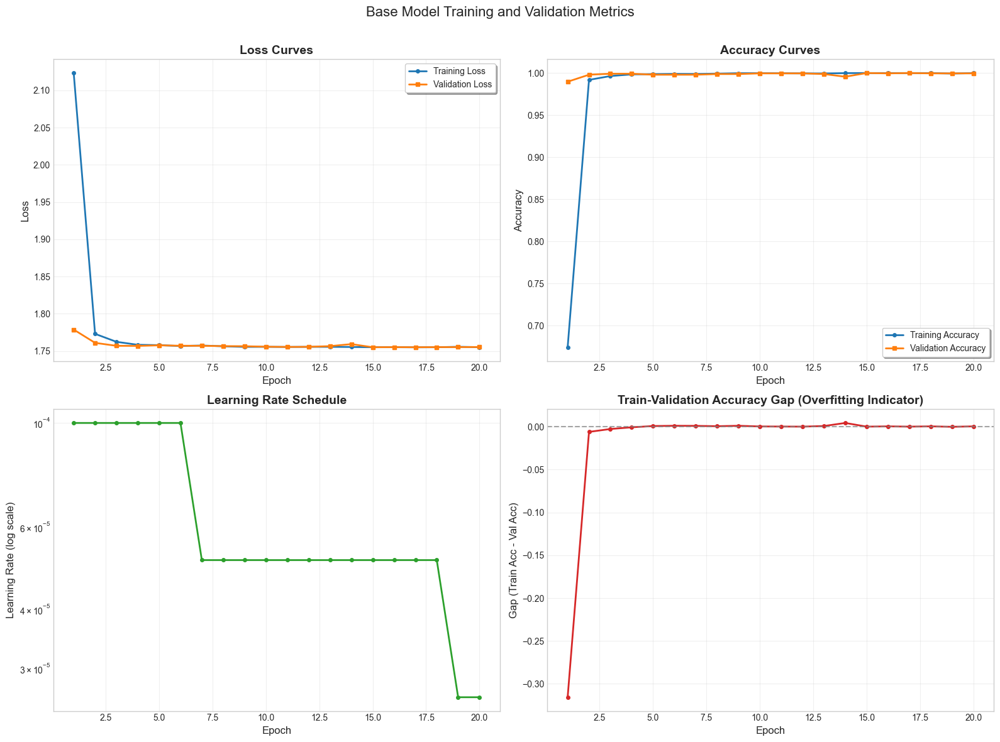

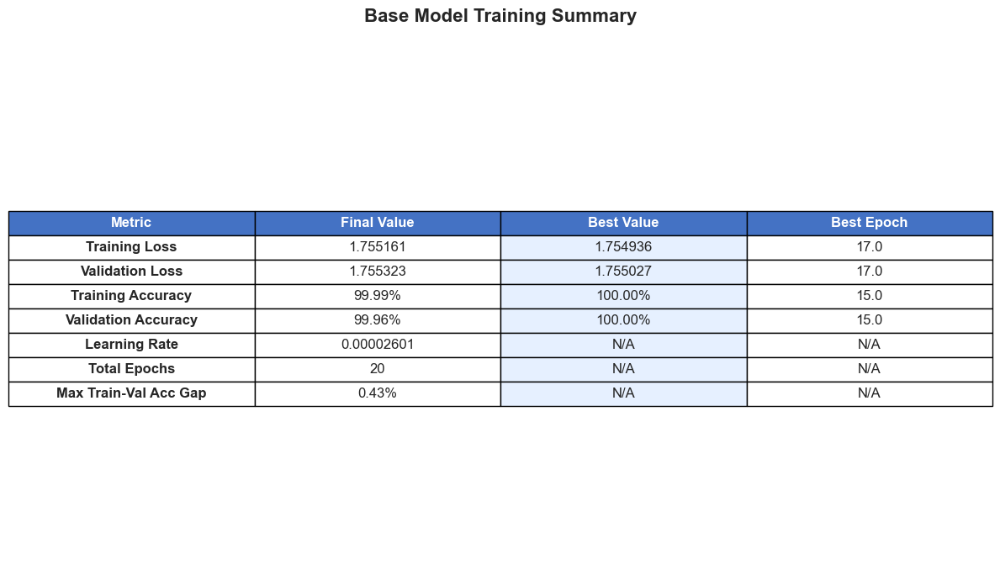

In [13]:
# Complete pipeline for MobileNetV2
print("Running complete SABR pipeline with MobileNetV2")
mobilenet_dir = os.path.join(output_dir, 'mobilenet')
mobilenet_base_dir = os.path.join(mobilenet_dir, 'base_model')
mobilenet_sabr_dir = os.path.join(mobilenet_dir, 'sabr_model')
mobilenet_pruned_dir = os.path.join(mobilenet_dir, 'pruned_model')
for dir_path in [mobilenet_dir, mobilenet_base_dir, mobilenet_sabr_dir, mobilenet_pruned_dir]:
    os.makedirs(dir_path, exist_ok=True)

# Initialize MobileNetV2 model
mobilenet_model = get_mobilenet_model(num_classes=14, pretrained=True)

# Phase 1: Base Model Training for MobileNetV2
print("Phase 1: Base Model Training (MobileNetV2)")
mobilenet_base, mobilenet_base_history, mobilenet_base_val_acc = train_base_model(
    mobilenet_model, train_loader, val_loader, 
    num_epochs=base_epochs, 
    device=device, 
    output_dir=mobilenet_base_dir, 
    use_gpu_dataset=use_gpu_dataset,
    learning_rate=learning_rate,
    scheduler_factor=scheduler_factor,
    scheduler_patience=scheduler_patience,
    min_lr=min_lr
)



Model loaded from notebook_results\mobilenet\base_model\best_model.pth
Phase 2: SABR Regularization (MobileNetV2)
Setting dropout to 0.0 for deterministic behavior during pruning...
Set dropout probability to 0.0 for Dropout(p=0.0, inplace=False)
Initializing SABR with: teta1=0.005, growth_rate=1.15, decrease_rate=1.0999999999999999, accuracy_threshold=0.004, k_epoch=1
Initialized SABR with teta1=0.005
  features.0.0.weight: initial lambda = 0.00114162
  features.0.1.weight: initial lambda = 0.00074441
  features.1.conv.0.0.weight: initial lambda = 0.00237939
  features.1.conv.0.1.weight: initial lambda = 0.00162212
  features.1.conv.1.weight: initial lambda = 0.00111241
  features.1.conv.2.weight: initial lambda = 0.00034412
  features.2.conv.0.0.weight: initial lambda = 0.00086096
  features.2.conv.0.1.weight: initial lambda = 0.00072948
  features.2.conv.1.0.weight: initial lambda = 0.00080018
  features.2.conv.1.1.weight: initial lambda = 0.00059729
  features.2.conv.2.weight: init

c:\Users\orani\anaconda3\envs\env_dl\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0000 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Train Loss: 23.4054, Train Acc: 0.9998
Val Loss: 1.7631, Val Acc: 0.9996
Learning Rate: 0.0001000000
Epoch time: 15.72 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0013128656
  features.0.1.weight: 0.0008560760
  features.1.conv.0.0.weight: 0.0027363005
  features.18.0.weight: 0.0001764346
  features.18.1.weight: 0.0001904822
  classifier.1.weight: 0.0001091673
Model saved to notebook_results\mobilenet\sabr_model\best_model.pth
✓ New best model saved with val_acc: 0.9996


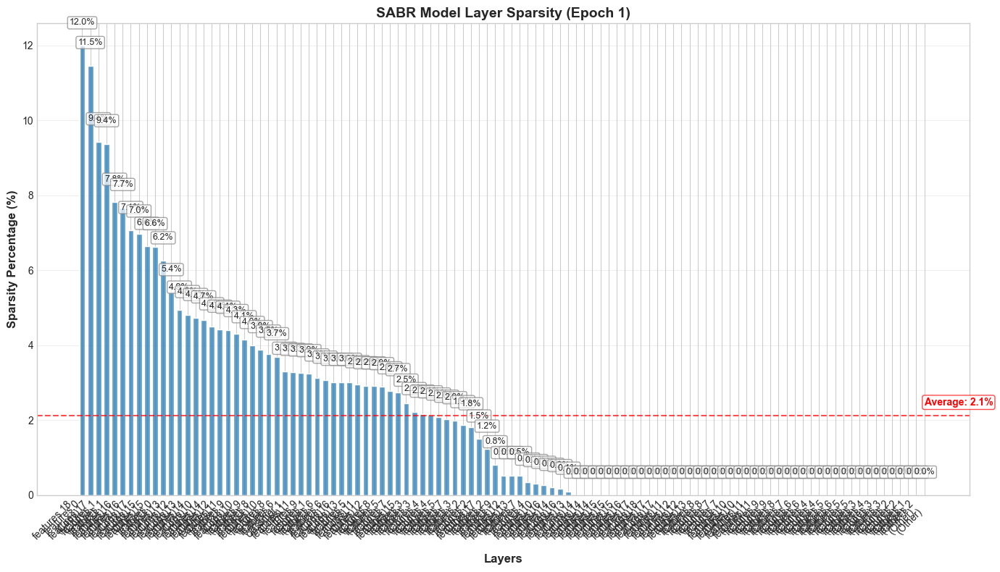

Overall model sparsity: 7.25% (161278/2224736 weights near zero)

Epoch 2/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0012 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Train Loss: 19.4882, Train Acc: 0.9973
Val Loss: 1.7627, Val Acc: 0.9984
Learning Rate: 0.0001000000
Epoch time: 16.26 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0015097954
  features.0.1.weight: 0.0009844874
  features.1.conv.0.0.weight: 0.0031467455
  features.18.0.weight: 0.0002028997
  features.18.1.weight: 0.0002190545
  classifier.1.weight: 0.0001255424
Overall model sparsity: 7.70% (171394/2224736 weights near zero)

Epoch 3/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0012 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Train Loss: 16.9797, Train Acc: 0.9961
Val Loss: 1.7682, Val Acc: 0.9984
Learning Rate: 0.0001000000
Epoch time: 15.85 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0017362647
  features.0.1.weight: 0.0011321604
  features.1.conv.0.0.weight: 0.0036187572
  features.18.0.weight: 0.0002333347
  features.18.1.weight: 0.0002519126
  classifier.1.weight: 0.0001443738
Overall model sparsity: 11.10% (247021/2224736 weights near zero)

Epoch 4/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0063 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.1.conv.2.weight to non-trainable (requires_grad=False)
Freezing lambda for features.1.conv.2.weight after 1 epochs without growth. Final lambda value: 0.00047578
Currently 1/105 parameters have frozen lambda values.
Train Loss: 15.3341, Train Acc: 0.9943
Val Loss: 1.7751, Val Acc: 0.9933
Learning Rate: 0.0001000000
Epoch time: 15.59 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0015784224
  features.0.1.weight: 0.0010292367
  features.1.conv.0.0.weight: 0.0032897792
  features.18.0.weight: 0.0002121224
  features.18.1.weight: 0.0002290115
  classifier.1.weight: 0.0001312489
Overall model sparsity: 10.30% (229214/2224736 weights near zero)

Epoch 5/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0063 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.2.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.2.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00056527
Currently 2/105 parameters have frozen lambda values.
Train Loss: 11.8835, Train Acc: 0.9890
Val Loss: 1.7660, Val Acc: 0.9933
Learning Rate: 0.0001000000
Epoch time: 16.63 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0014349294
  features.0.1.weight: 0.0009356697
  features.1.conv.0.0.weight: 0.0029907082
  features.18.0.weight: 0.0001928386
  features.18.1.weight: 0.0002081922
  classifier.1.weight: 0.0001193172
Overall model sparsity: 13.92% (309647/2224736 weights near zero)

Epoch 6/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0000 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 2/105 parameters have frozen lambda values.
Train Loss: 9.7759, Train Acc: 0.9873
Val Loss: 1.7594, Val Acc: 0.9996
Learning Rate: 0.0001000000
Epoch time: 16.44 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0016501688
  features.0.1.weight: 0.0010760202
  features.1.conv.0.0.weight: 0.0034393144
  features.18.0.weight: 0.0002217643
  features.18.1.weight: 0.0002394211
  classifier.1.weight: 0.0001372148
Overall model sparsity: 20.36% (452996/2224736 weights near zero)

Epoch 7/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0028 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 2/105 parameters have frozen lambda values.
Train Loss: 9.9261, Train Acc: 0.9938
Val Loss: 1.7614, Val Acc: 0.9968
Learning Rate: 0.0001000000
Epoch time: 15.87 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0018976941
  features.0.1.weight: 0.0012374232
  features.1.conv.0.0.weight: 0.0039552115
  features.18.0.weight: 0.0002550290
  features.18.1.weight: 0.0002753342
  classifier.1.weight: 0.0001577970
Overall model sparsity: 20.39% (453523/2224736 weights near zero)

Epoch 8/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0095 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.3.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.3.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00071569
Currently 3/105 parameters have frozen lambda values.
Train Loss: 10.1588, Train Acc: 0.9887
Val Loss: 1.7681, Val Acc: 0.9901
Learning Rate: 0.0001000000
Epoch time: 15.81 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0017251763
  features.0.1.weight: 0.0011249301
  features.1.conv.0.0.weight: 0.0035956467
  features.18.0.weight: 0.0002318445
  features.18.1.weight: 0.0002503038
  classifier.1.weight: 0.0001434518
Overall model sparsity: 20.98% (466791/2224736 weights near zero)

Epoch 9/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0198 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.0.1.weight after 1 epochs without growth. Final lambda value: 0.00102266
Currently 4/105 parameters have frozen lambda values.
Train Loss: 8.6439, Train Acc: 0.9898
Val Loss: 1.7779, Val Acc: 0.9798
Learning Rate: 0.0001000000
Epoch time: 15.47 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0015683421
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0032687697
  features.18.0.weight: 0.0002107677
  features.18.1.weight: 0.0002275489
  classifier.1.weight: 0.0001304107
Overall model sparsity: 25.02% (556686/2224736 weights near zero)

Epoch 10/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0107 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.1.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.1.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00202586
Currently 5/105 parameters have frozen lambda values.
Train Loss: 7.5643, Train Acc: 0.9868
Val Loss: 1.7745, Val Acc: 0.9889
Learning Rate: 0.0000510000
Epoch time: 15.40 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0014257655
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0029716087
  features.18.0.weight: 0.0001916070
  features.18.1.weight: 0.0002068626
  classifier.1.weight: 0.0001185552
Overall model sparsity: 30.82% (685669/2224736 weights near zero)

Epoch 11/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0020 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 6.7155, Train Acc: 0.9971
Val Loss: 1.7586, Val Acc: 0.9976
Learning Rate: 0.0000510000
Epoch time: 15.38 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0016396303
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0034173499
  features.18.0.weight: 0.0002203481
  features.18.1.weight: 0.0002378920
  classifier.1.weight: 0.0001363385


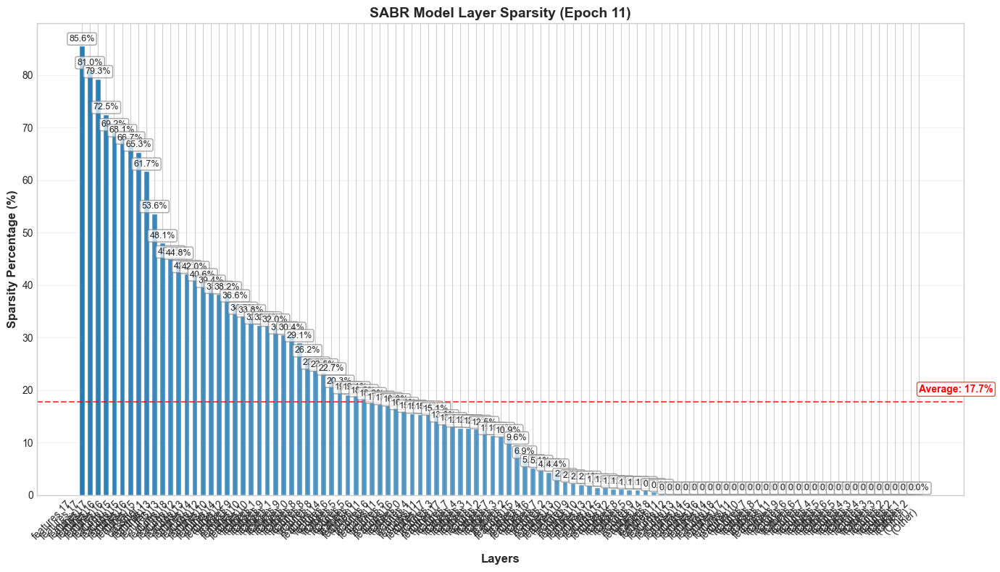

Overall model sparsity: 56.41% (1254929/2224736 weights near zero)

Epoch 12/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0008 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 7.2403, Train Acc: 0.9968
Val Loss: 1.7569, Val Acc: 0.9988
Learning Rate: 0.0000510000
Epoch time: 15.47 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0018855748
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0039299522
  features.18.0.weight: 0.0002534003
  features.18.1.weight: 0.0002735759
  classifier.1.weight: 0.0001567892
Overall model sparsity: 48.90% (1087791/2224736 weights near zero)

Epoch 13/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0040 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 7.8159, Train Acc: 0.9966
Val Loss: 1.7615, Val Acc: 0.9956
Learning Rate: 0.0000510000
Epoch time: 15.02 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0021684109
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0045194449
  features.18.0.weight: 0.0002914103
  features.18.1.weight: 0.0003146122
  classifier.1.weight: 0.0001803076
Overall model sparsity: 51.99% (1156676/2224736 weights near zero)

Epoch 14/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0024 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 8.4047, Train Acc: 0.9973
Val Loss: 1.7596, Val Acc: 0.9972
Learning Rate: 0.0000510000
Epoch time: 15.41 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0024936725
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0051973616
  features.18.0.weight: 0.0003351219
  features.18.1.weight: 0.0003618041
  classifier.1.weight: 0.0002073537
Overall model sparsity: 53.24% (1184449/2224736 weights near zero)

Epoch 15/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0008 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 9.0397, Train Acc: 0.9958
Val Loss: 1.7594, Val Acc: 0.9988
Learning Rate: 0.0000510000
Epoch time: 15.42 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0028677233
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0059769657
  features.18.0.weight: 0.0003853902
  features.18.1.weight: 0.0004160747
  classifier.1.weight: 0.0002384568
Overall model sparsity: 51.88% (1154230/2224736 weights near zero)

Epoch 16/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0028 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 9.6835, Train Acc: 0.9950
Val Loss: 1.7609, Val Acc: 0.9968
Learning Rate: 0.0000260100
Epoch time: 15.59 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0032978817
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0068735103
  features.18.0.weight: 0.0004431987
  features.18.1.weight: 0.0004784859
  classifier.1.weight: 0.0002742253
Overall model sparsity: 51.57% (1147267/2224736 weights near zero)

Epoch 17/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0028 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 10.4611, Train Acc: 0.9972
Val Loss: 1.7612, Val Acc: 0.9968
Learning Rate: 0.0000260100
Epoch time: 15.99 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0037925639
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0079045370
  features.18.0.weight: 0.0005096784
  features.18.1.weight: 0.0005502587
  classifier.1.weight: 0.0003153591
Overall model sparsity: 67.53% (1502470/2224736 weights near zero)

Epoch 18/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 5/105 parameters have frozen lambda values.
Train Loss: 11.4383, Train Acc: 0.9967
Val Loss: 1.7619, Val Acc: 0.9960
Learning Rate: 0.0000260100
Epoch time: 15.85 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0043614483
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0090902178
  features.18.0.weight: 0.0005861302
  features.18.1.weight: 0.0006327975
  classifier.1.weight: 0.0003626629
Overall model sparsity: 69.41% (1544258/2224736 weights near zero)

Epoch 19/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0067 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.4.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.4.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00137087
Currently 6/105 parameters have frozen lambda values.
Train Loss: 12.5065, Train Acc: 0.9956
Val Loss: 1.7666, Val Acc: 0.9929
Learning Rate: 0.0000260100
Epoch time: 15.90 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0039649531
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0082638338
  features.18.0.weight: 0.0005328456
  features.18.1.weight: 0.0005752705
  classifier.1.weight: 0.0003296936
Overall model sparsity: 68.61% (1526388/2224736 weights near zero)

Epoch 20/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0052 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.5.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.5.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00153173
Currently 7/105 parameters have frozen lambda values.
Train Loss: 11.2161, Train Acc: 0.9967
Val Loss: 1.7647, Val Acc: 0.9944
Learning Rate: 0.0000132651
Epoch time: 16.04 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0036045026
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0075125759
  features.18.0.weight: 0.0004844051
  features.18.1.weight: 0.0005229732
  classifier.1.weight: 0.0002997214
Overall model sparsity: 71.99% (1601500/2224736 weights near zero)

Epoch 21/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0028 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 7/105 parameters have frozen lambda values.
Train Loss: 10.1664, Train Acc: 0.9968
Val Loss: 1.7624, Val Acc: 0.9968
Learning Rate: 0.0000132651
Epoch time: 16.34 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0041451780
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0086394623
  features.18.0.weight: 0.0005570658
  features.18.1.weight: 0.0006014191
  classifier.1.weight: 0.0003446796


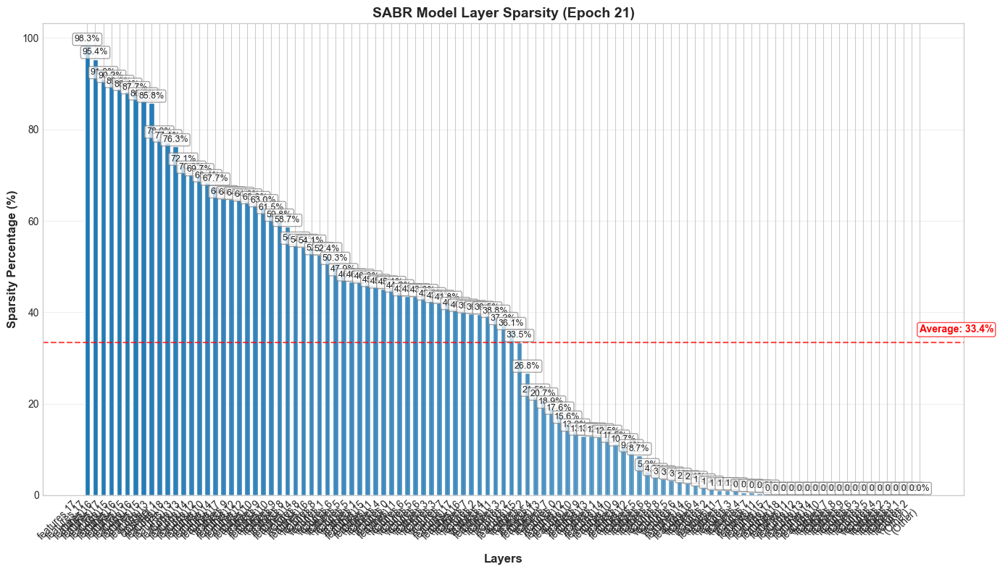

Overall model sparsity: 79.45% (1767561/2224736 weights near zero)

Epoch 22/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0056 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.6.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.6.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00121738
Currently 8/105 parameters have frozen lambda values.
Train Loss: 11.2773, Train Acc: 0.9949
Val Loss: 1.7640, Val Acc: 0.9940
Learning Rate: 0.0000132651
Epoch time: 15.54 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0037683435
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0078540565
  features.18.0.weight: 0.0005064235
  features.18.1.weight: 0.0005467447
  classifier.1.weight: 0.0003133451
Overall model sparsity: 76.81% (1708811/2224736 weights near zero)

Epoch 23/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0040 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 8/105 parameters have frozen lambda values.
Train Loss: 10.3005, Train Acc: 0.9962
Val Loss: 1.7633, Val Acc: 0.9956
Learning Rate: 0.0000132651
Epoch time: 15.26 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0043335948
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0090321647
  features.18.0.weight: 0.0005823870
  features.18.1.weight: 0.0006287564
  classifier.1.weight: 0.0003603469
Overall model sparsity: 78.76% (1752290/2224736 weights near zero)

Epoch 24/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0032 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 8/105 parameters have frozen lambda values.
Train Loss: 11.4299, Train Acc: 0.9968
Val Loss: 1.7634, Val Acc: 0.9964
Learning Rate: 0.0000100000
Epoch time: 15.54 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0049836338
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0103869895
  features.18.0.weight: 0.0006697450
  features.18.1.weight: 0.0007230698
  classifier.1.weight: 0.0004143989
Overall model sparsity: 82.23% (1829324/2224736 weights near zero)

Epoch 25/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0052 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.7.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.7.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00144981
Currently 9/105 parameters have frozen lambda values.
Train Loss: 12.7153, Train Acc: 0.9972
Val Loss: 1.7646, Val Acc: 0.9944
Learning Rate: 0.0000100000
Epoch time: 15.65 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0045305761
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0094427178
  features.18.0.weight: 0.0006088591
  features.18.1.weight: 0.0006573362
  classifier.1.weight: 0.0003767262
Overall model sparsity: 85.65% (1905458/2224736 weights near zero)

Epoch 26/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0044 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.8.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.8.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00154570
Currently 10/105 parameters have frozen lambda values.
Train Loss: 11.6128, Train Acc: 0.9972
Val Loss: 1.7645, Val Acc: 0.9952
Learning Rate: 0.0000100000
Epoch time: 14.55 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0041187056
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0085842889
  features.18.0.weight: 0.0005535083
  features.18.1.weight: 0.0005975784
  classifier.1.weight: 0.0003424784
Overall model sparsity: 85.11% (1893490/2224736 weights near zero)

Epoch 27/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0048 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.9.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.9.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00082246
Currently 11/105 parameters have frozen lambda values.
Train Loss: 10.6373, Train Acc: 0.9972
Val Loss: 1.7642, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 15.17 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0037442779
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0078038988
  features.18.0.weight: 0.0005031893
  features.18.1.weight: 0.0005432530
  classifier.1.weight: 0.0003113440
Overall model sparsity: 84.20% (1873212/2224736 weights near zero)

Epoch 28/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0067 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.10.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.10.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00073350
Currently 12/105 parameters have frozen lambda values.
Train Loss: 9.7717, Train Acc: 0.9967
Val Loss: 1.7651, Val Acc: 0.9929
Learning Rate: 0.0000100000
Epoch time: 15.38 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0034038890
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0070944531
  features.18.0.weight: 0.0004574448
  features.18.1.weight: 0.0004938664
  classifier.1.weight: 0.0002830400
Overall model sparsity: 82.07% (1825730/2224736 weights near zero)

Epoch 29/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0067 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.2.conv.1.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.2.conv.1.1.weight after 1 epochs without growth. Final lambda value: 0.00161900
Currently 13/105 parameters have frozen lambda values.
Train Loss: 9.0002, Train Acc: 0.9967
Val Loss: 1.7647, Val Acc: 0.9929
Learning Rate: 0.0000100000
Epoch time: 14.88 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0030944445
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0064495029
  features.18.0.weight: 0.0004158589
  features.18.1.weight: 0.0004489694
  classifier.1.weight: 0.0002573091
Overall model sparsity: 82.48% (1834980/2224736 weights near zero)

Epoch 30/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0067 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.2.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.2.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00179756
Currently 14/105 parameters have frozen lambda values.
Train Loss: 8.3118, Train Acc: 0.9961
Val Loss: 1.7646, Val Acc: 0.9929
Learning Rate: 0.0000100000
Epoch time: 14.90 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0028131313
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0058631841
  features.18.0.weight: 0.0003780536
  features.18.1.weight: 0.0004081540
  classifier.1.weight: 0.0002339174
Overall model sparsity: 83.28% (1852686/2224736 weights near zero)

Epoch 31/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0063 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.11.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.11.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00049270
Currently 15/105 parameters have frozen lambda values.
Train Loss: 7.6947, Train Acc: 0.9968
Val Loss: 1.7643, Val Acc: 0.9933
Learning Rate: 0.0000100000
Epoch time: 15.70 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0025573920
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0053301672
  features.18.0.weight: 0.0003436851
  features.18.1.weight: 0.0003710491
  classifier.1.weight: 0.0002126521


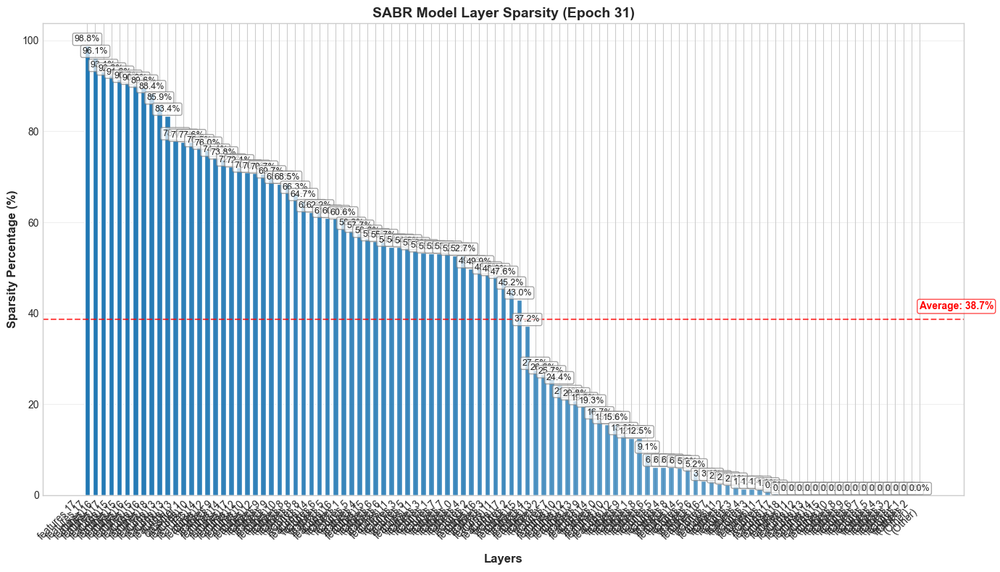

Overall model sparsity: 84.46% (1879100/2224736 weights near zero)

Epoch 32/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0056 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.12.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.12.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00043428
Currently 16/105 parameters have frozen lambda values.
Train Loss: 7.1435, Train Acc: 0.9978
Val Loss: 1.7639, Val Acc: 0.9940
Learning Rate: 0.0000100000
Epoch time: 16.18 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0023249018
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0048456066
  features.18.0.weight: 0.0003124410
  features.18.1.weight: 0.0003373174
  classifier.1.weight: 0.0001933201
Overall model sparsity: 82.37% (1832564/2224736 weights near zero)

Epoch 33/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0048 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.13.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.13.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00066360
Currently 17/105 parameters have frozen lambda values.
Train Loss: 6.6530, Train Acc: 0.9968
Val Loss: 1.7633, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 15.20 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0021135469
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0044050966
  features.18.0.weight: 0.0002840372
  features.18.1.weight: 0.0003066521
  classifier.1.weight: 0.0001757455
Overall model sparsity: 82.83% (1842838/2224736 weights near zero)

Epoch 34/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0044 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.4.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.4.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00070590
Currently 18/105 parameters have frozen lambda values.
Train Loss: 6.2100, Train Acc: 0.9973
Val Loss: 1.7636, Val Acc: 0.9952
Learning Rate: 0.0000100000
Epoch time: 15.60 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0019214062
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0040046331
  features.18.0.weight: 0.0002582157
  features.18.1.weight: 0.0002787746
  classifier.1.weight: 0.0001597687
Overall model sparsity: 81.15% (1805351/2224736 weights near zero)

Epoch 35/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 18/105 parameters have frozen lambda values.
Train Loss: 5.8121, Train Acc: 0.9972
Val Loss: 1.7622, Val Acc: 0.9960
Learning Rate: 0.0000100000
Epoch time: 15.85 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0022096171
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0046053277
  features.18.0.weight: 0.0002969480
  features.18.1.weight: 0.0003205908
  classifier.1.weight: 0.0001837340
Overall model sparsity: 83.21% (1851116/2224736 weights near zero)

Epoch 36/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0071 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.3.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.3.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00058222
Currently 19/105 parameters have frozen lambda values.
Train Loss: 6.3526, Train Acc: 0.9981
Val Loss: 1.7640, Val Acc: 0.9925
Learning Rate: 0.0000100000
Epoch time: 15.87 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0020087427
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0041866614
  features.18.0.weight: 0.0002699527
  features.18.1.weight: 0.0002914462
  classifier.1.weight: 0.0001670309
Overall model sparsity: 81.72% (1817989/2224736 weights near zero)

Epoch 37/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0071 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.1.conv.0.0.weight to non-trainable (requires_grad=False)
Freezing lambda for features.1.conv.0.0.weight after 1 epochs without growth. Final lambda value: 0.00380606
Currently 20/105 parameters have frozen lambda values.
Train Loss: 5.9423, Train Acc: 0.9977
Val Loss: 1.7642, Val Acc: 0.9925
Learning Rate: 0.0000100000
Epoch time: 15.37 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0018261296
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002454116
  features.18.1.weight: 0.0002649511
  classifier.1.weight: 0.0001518463
Overall model sparsity: 82.22% (1829285/2224736 weights near zero)

Epoch 38/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0067 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.3.conv.1.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.3.conv.1.1.weight after 1 epochs without growth. Final lambda value: 0.00044533
Currently 21/105 parameters have frozen lambda values.
Train Loss: 5.5742, Train Acc: 0.9974
Val Loss: 1.7635, Val Acc: 0.9929
Learning Rate: 0.0000100000
Epoch time: 15.31 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0016601178
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002231014
  features.18.1.weight: 0.0002408646
  classifier.1.weight: 0.0001380420
Overall model sparsity: 80.75% (1796491/2224736 weights near zero)

Epoch 39/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0048 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.4.conv.1.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.4.conv.1.1.weight after 1 epochs without growth. Final lambda value: 0.00052743
Currently 22/105 parameters have frozen lambda values.
Train Loss: 5.2559, Train Acc: 0.9980
Val Loss: 1.7622, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 15.48 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0015091980
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002028195
  features.18.1.weight: 0.0002189678
  classifier.1.weight: 0.0001254928
Overall model sparsity: 81.56% (1814391/2224736 weights near zero)

Epoch 40/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0083 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.16.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.16.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00099830
Currently 23/105 parameters have frozen lambda values.
Train Loss: 4.9710, Train Acc: 0.9983
Val Loss: 1.7657, Val Acc: 0.9913
Learning Rate: 0.0000100000
Epoch time: 14.81 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0013719981
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001843813
  features.18.1.weight: 0.0001990617
  classifier.1.weight: 0.0001140843
Overall model sparsity: 80.44% (1789682/2224736 weights near zero)

Epoch 41/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0048 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.14.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.14.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00028182
Currently 24/105 parameters have frozen lambda values.
Train Loss: 4.7165, Train Acc: 0.9985
Val Loss: 1.7623, Val Acc: 0.9948
Learning Rate: 0.0000100000
Epoch time: 14.73 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0012472710
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001676194
  features.18.1.weight: 0.0001809651
  classifier.1.weight: 0.0001037130


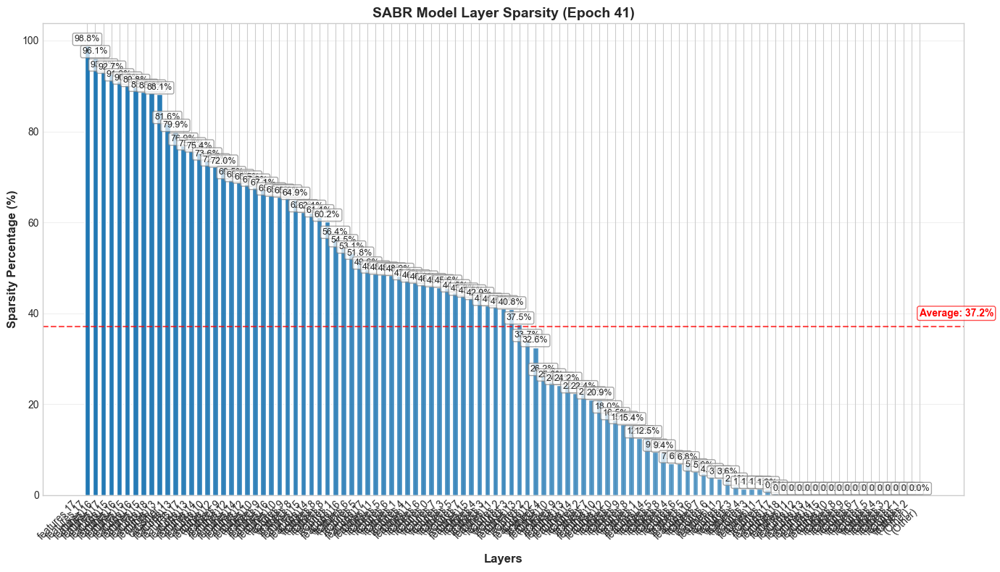

Overall model sparsity: 83.63% (1860552/2224736 weights near zero)

Epoch 42/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 24/105 parameters have frozen lambda values.
Train Loss: 4.4888, Train Acc: 0.9983
Val Loss: 1.7613, Val Acc: 0.9960
Learning Rate: 0.0000100000
Epoch time: 14.81 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0014343616
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001927623
  features.18.1.weight: 0.0002081099
  classifier.1.weight: 0.0001192700
Overall model sparsity: 80.83% (1798345/2224736 weights near zero)

Epoch 43/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0040 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 24/105 parameters have frozen lambda values.
Train Loss: 4.8067, Train Acc: 0.9978
Val Loss: 1.7621, Val Acc: 0.9956
Learning Rate: 0.0000100000
Epoch time: 14.67 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0016495158
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002216766
  features.18.1.weight: 0.0002393264
  classifier.1.weight: 0.0001371605
Overall model sparsity: 81.65% (1816598/2224736 weights near zero)

Epoch 44/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy stable (drop: 0.0036 <= threshold 0.004 from max 0.9996). Increasing all lambda values by factor of 1.150
Currently 24/105 parameters have frozen lambda values.
Train Loss: 5.1646, Train Acc: 0.9989
Val Loss: 1.7617, Val Acc: 0.9960
Learning Rate: 0.0000100000
Epoch time: 14.63 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0018969432
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002549281
  features.18.1.weight: 0.0002752253
  classifier.1.weight: 0.0001577345
Overall model sparsity: 82.91% (1844438/2224736 weights near zero)

Epoch 45/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0044 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.15.conv.3.weight to non-trainable (requires_grad=False)
Freezing lambda for features.15.conv.3.weight after 1 epochs without growth. Final lambda value: 0.00036076
Currently 25/105 parameters have frozen lambda values.
Train Loss: 5.5762, Train Acc: 0.9979
Val Loss: 1.7616, Val Acc: 0.9952
Learning Rate: 0.0000100000
Epoch time: 14.40 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0017244938
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002317528
  features.18.1.weight: 0.0002502048
  classifier.1.weight: 0.0001433950
Overall model sparsity: 82.94% (1845279/2224736 weights near zero)

Epoch 46/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0044 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.5.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.5.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00027126
Currently 26/105 parameters have frozen lambda values.
Train Loss: 5.2635, Train Acc: 0.9982
Val Loss: 1.7621, Val Acc: 0.9952
Learning Rate: 0.0000100000
Epoch time: 14.89 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0015677216
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0002106844
  features.18.1.weight: 0.0002274589
  classifier.1.weight: 0.0001303591
Overall model sparsity: 82.52% (1835756/2224736 weights near zero)

Epoch 47/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0056 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.6.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.6.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00021012
Currently 27/105 parameters have frozen lambda values.
Train Loss: 4.9831, Train Acc: 0.9978
Val Loss: 1.7630, Val Acc: 0.9940
Learning Rate: 0.0000100000
Epoch time: 15.49 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0014252014
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001915312
  features.18.1.weight: 0.0002067809
  classifier.1.weight: 0.0001185083
Overall model sparsity: 83.12% (1849178/2224736 weights near zero)

Epoch 48/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0056 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.5.conv.1.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.5.conv.1.1.weight after 1 epochs without growth. Final lambda value: 0.00034920
Currently 28/105 parameters have frozen lambda values.
Train Loss: 4.7299, Train Acc: 0.9982
Val Loss: 1.7627, Val Acc: 0.9940
Learning Rate: 0.0000100000
Epoch time: 15.22 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0012956376
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001741193
  features.18.1.weight: 0.0001879826
  classifier.1.weight: 0.0001077348
Overall model sparsity: 81.44% (1811925/2224736 weights near zero)

Epoch 49/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0060 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.7.conv.0.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.7.conv.0.1.weight after 1 epochs without growth. Final lambda value: 0.00030012
Currently 29/105 parameters have frozen lambda values.
Train Loss: 4.5051, Train Acc: 0.9978
Val Loss: 1.7625, Val Acc: 0.9937
Learning Rate: 0.0000100000
Epoch time: 15.29 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0011778523
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001582903
  features.18.1.weight: 0.0001708933
  classifier.1.weight: 0.0000979407
Overall model sparsity: 80.55% (1791945/2224736 weights near zero)

Epoch 50/50


Training:   0%|          | 0/158 [00:00<?, ?it/s]

Validation:   0%|          | 0/40 [00:00<?, ?it/s]

Accuracy dropped by 0.0044 > threshold 0.004 from max 0.9996. Reducing all lambda values by factor of 0.909
Setting features.6.conv.1.1.weight to non-trainable (requires_grad=False)
Freezing lambda for features.6.conv.1.1.weight after 1 epochs without growth. Final lambda value: 0.00026536
Currently 30/105 parameters have frozen lambda values.
Train Loss: 4.2983, Train Acc: 0.9983
Val Loss: 1.7614, Val Acc: 0.9952
Learning Rate: 0.0000100000
Epoch time: 15.43 seconds
Lambda values for sample layers:
  features.0.0.weight: 0.0010707747
  features.0.1.weight: 0.0010226637 (FROZEN)
  features.1.conv.0.0.weight: 0.0038060558 (FROZEN)
  features.18.0.weight: 0.0001439003
  features.18.1.weight: 0.0001553575
  classifier.1.weight: 0.0000890370
Overall model sparsity: 86.25% (1918889/2224736 weights near zero)

SABR training completed. Best validation accuracy: 0.9996
Model saved to notebook_results\mobilenet\sabr_model\final_model.pth


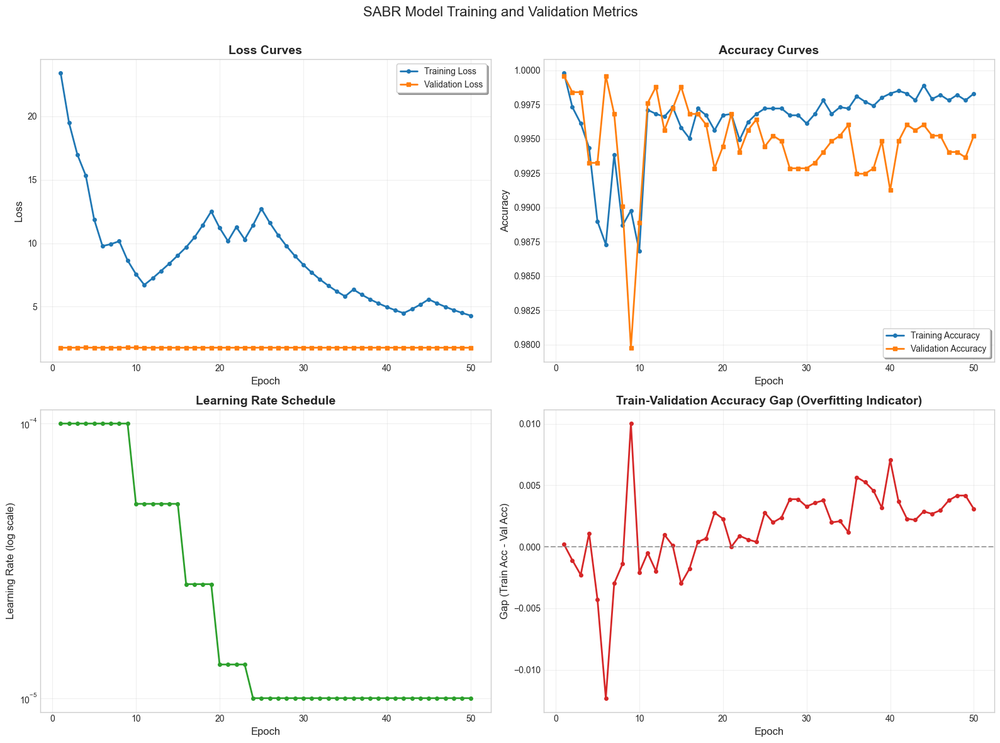

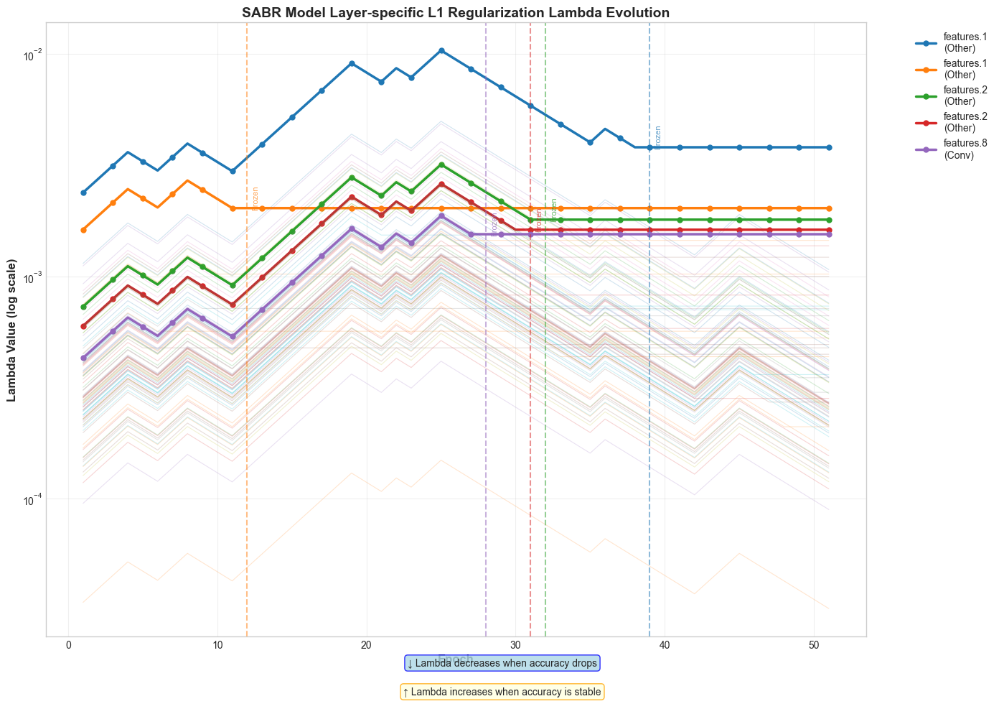

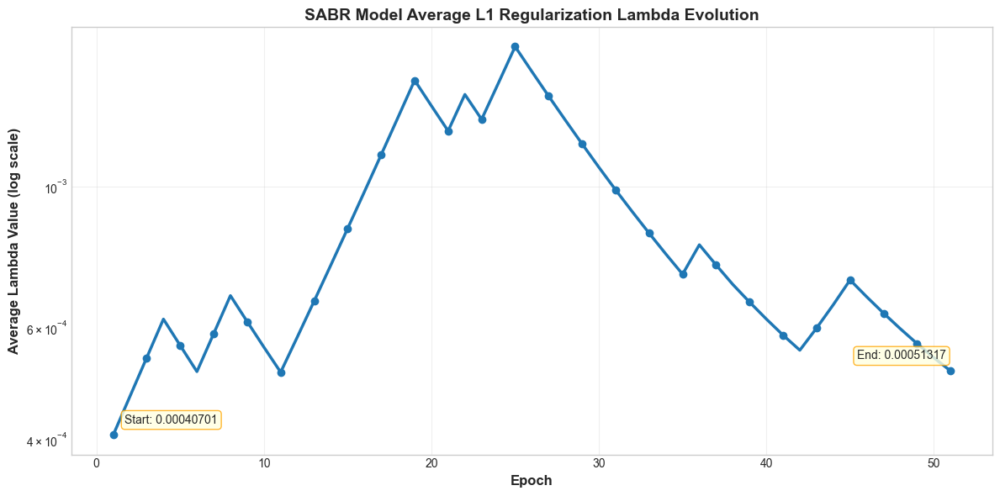

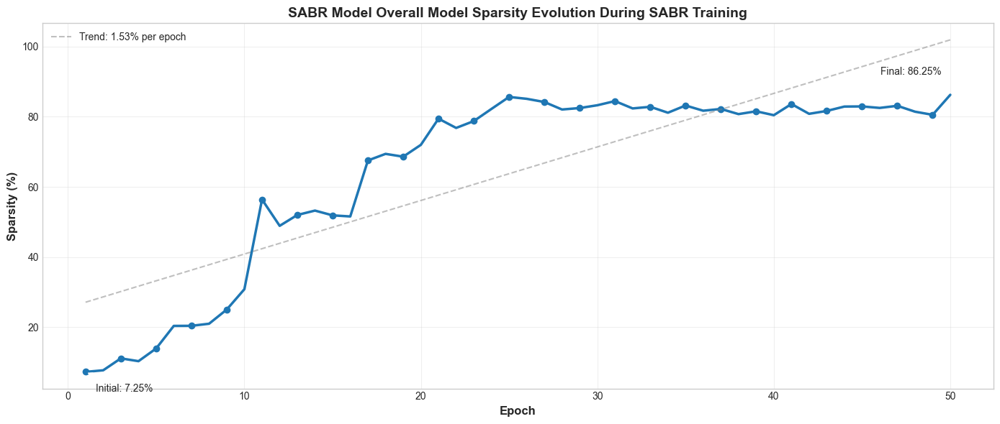

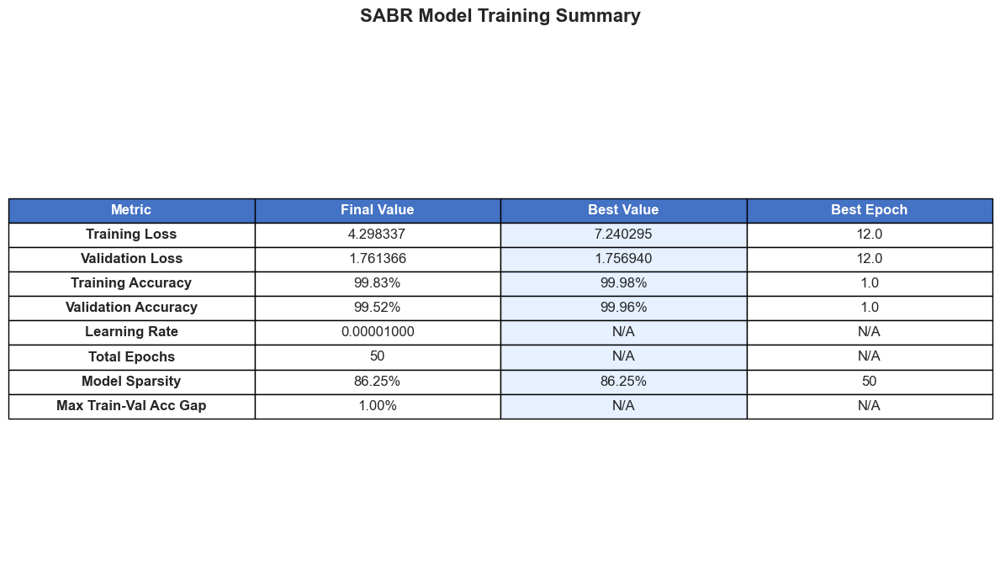

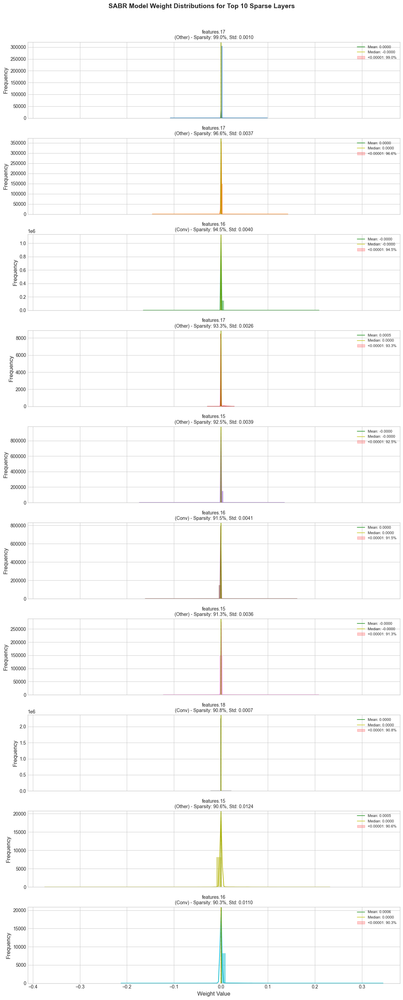

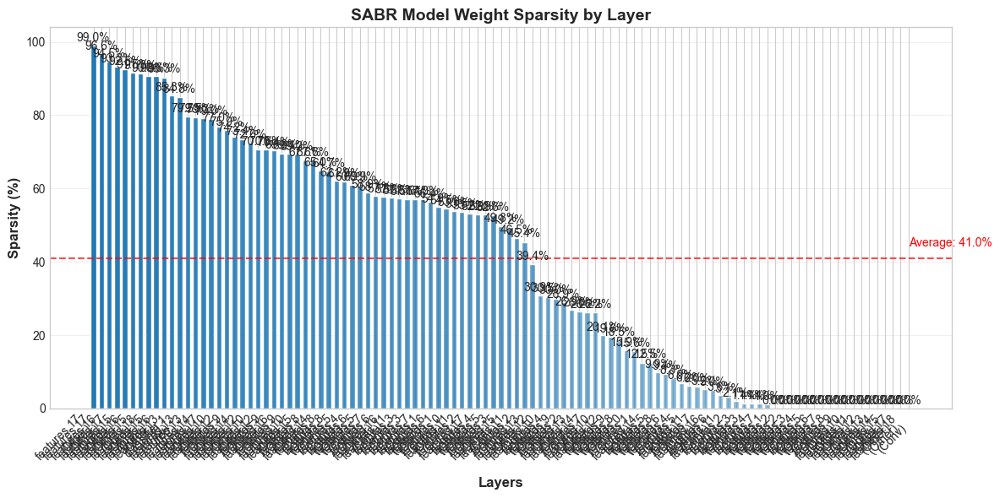

In [14]:
# Load best base model
load_model(mobilenet_model, os.path.join(mobilenet_base_dir, 'best_model.pth'), device)

# Phase 2: SABR Regularization for MobileNetV2
print("Phase 2: SABR Regularization (MobileNetV2)")
mobilenet_sabr, mobilenet_sabr_history, mobilenet_regularizer, mobilenet_sabr_val_acc = train_with_sabr(
    mobilenet_model, train_loader, val_loader, 
    num_epochs=sabr_epochs, 
    device=device, 
    output_dir=mobilenet_sabr_dir, 
    use_gpu_dataset=use_gpu_dataset,
    teta1=teta1*10, 
    growth_rate=growth_rate, 
    decrease_rate=decrease_rate-0.1, 
    accuracy_threshold=accuracy_threshold-0.003, 
    k_epoch=k_epoch-1,
    learning_rate=learning_rate,
    scheduler_factor=scheduler_factor,
    scheduler_patience=scheduler_patience,
    min_lr=min_lr,
    epsilon=epsilon
)



Model loaded from notebook_results\mobilenet\sabr_model\final_model.pth
Phase 3: Post-Training Pruning (MobileNetV2)

Evaluating original model...


Evaluating: 100%|██████████| 22/22 [00:00<00:00, 41.72it/s, loss=1.7550, acc=1.0000]


Original Model - Test Loss: 1.7636, Test Accuracy: 0.9936
Initial sparsity: 86.25% (1918889/2224736 weights near zero)

Applying std-based pruning with teta1 = 0.05 and gamma = 0.025...
Layer features.0.0.weight: std = 0.323812, threshold = 0.016191
  (Ignored 605 weights < 0.025 when calculating std)
Layer features.0.1.weight: std = 0.104084, threshold = 0.005204
  (Ignored 7 weights < 0.025 when calculating std)
Layer features.1.conv.0.0.weight: std = 0.689575, threshold = 0.034479
  (Ignored 187 weights < 0.025 when calculating std)
Layer features.1.conv.0.1.weight: std = 0.286581, threshold = 0.014329
  (Ignored 7 weights < 0.025 when calculating std)
Layer features.1.conv.1.weight: std = 0.233544, threshold = 0.011677
  (Ignored 312 weights < 0.025 when calculating std)
Layer features.1.conv.2.weight: std = 0.068297, threshold = 0.003415
  (Ignored 0 weights < 0.025 when calculating std)
Layer features.2.conv.0.0.weight: std = 0.143845, threshold = 0.007192
  (Ignored 946 weights 

Evaluating: 100%|██████████| 22/22 [00:00<00:00, 67.92it/s, loss=1.7578, acc=1.0000]


Pruned Model - Test Loss: 1.7746, Test Accuracy: 0.9843
Accuracy change: -0.0093

PRUNING SUMMARY
Pruning method: Standard deviation-based (teta1 = 0.05, gamma = 0.025)
Original accuracy: 0.9936
Pruned accuracy: 0.9843
Accuracy change: -0.0093
Initial sparsity: 86.25%
Final sparsity: 95.61%
Sparsity increase: 9.35%
Total parameters: 2,224,736
Non-zero parameters: 97,747
Pruned parameters: 2,126,989
Model saved to notebook_results\mobilenet\pruned_model\pruned_model_std_based_teta1_0.05_gamma_0.025.pth


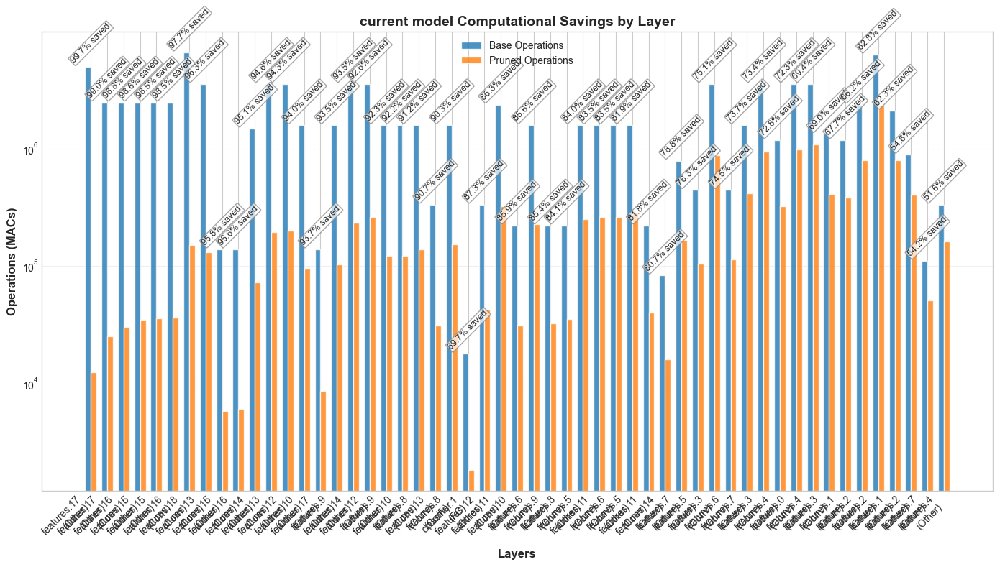

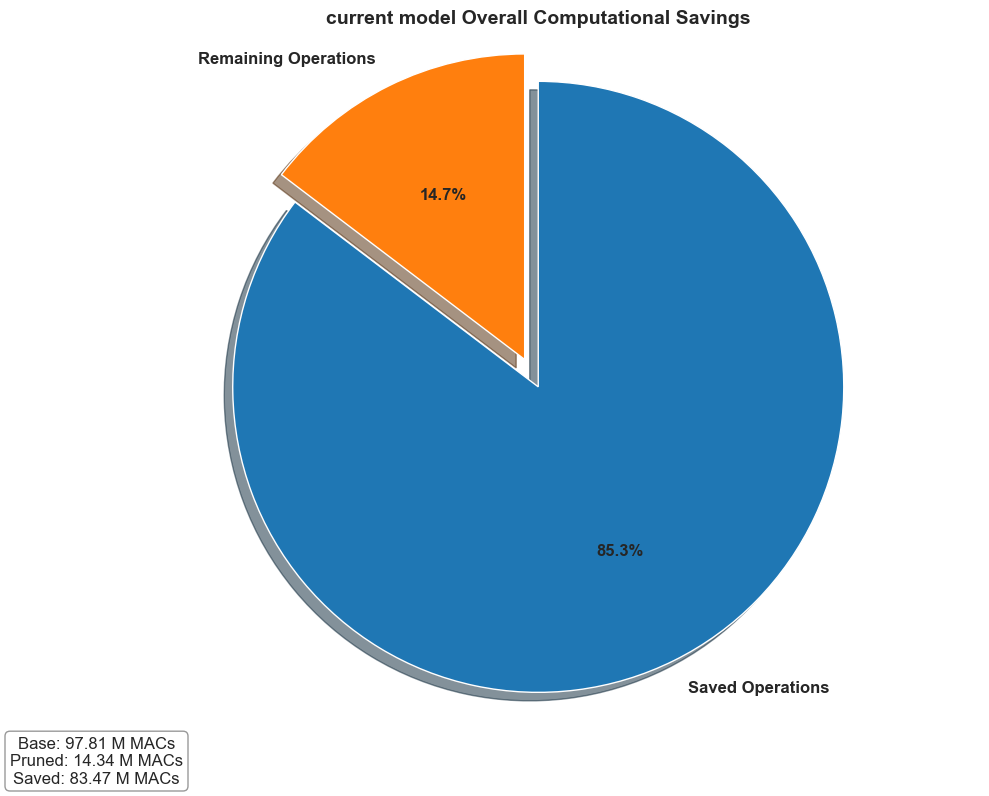

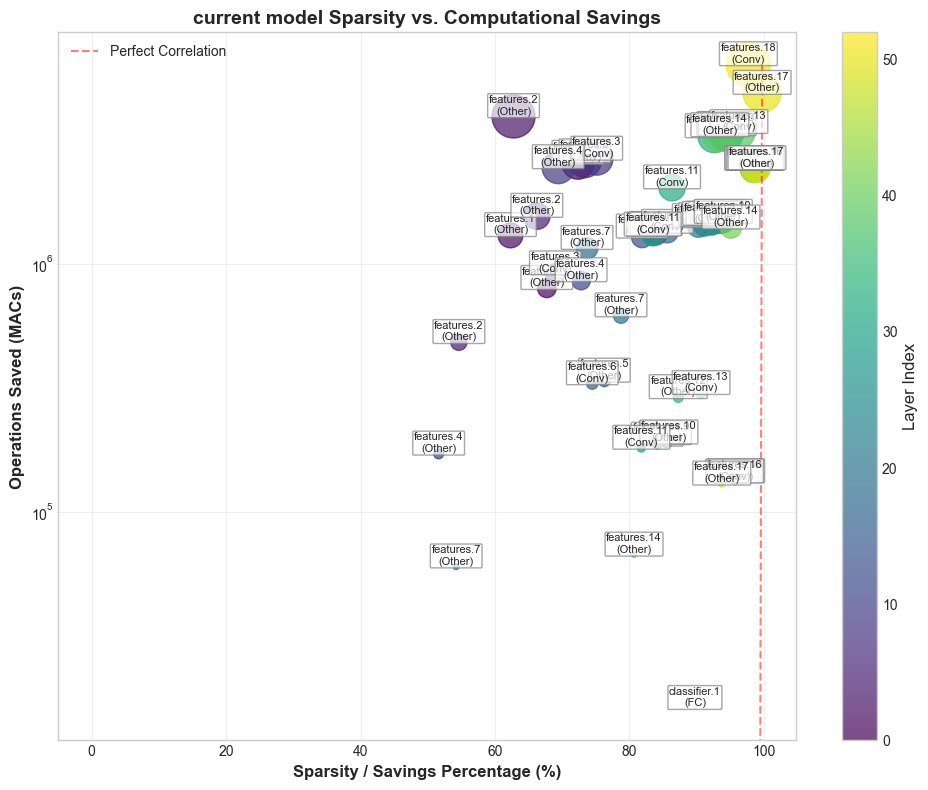

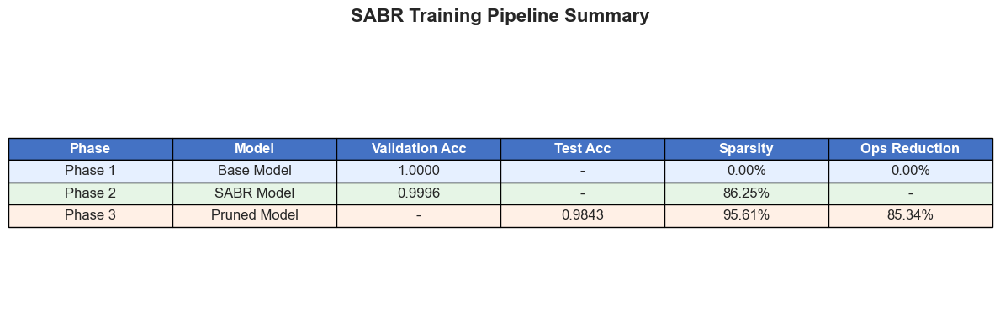

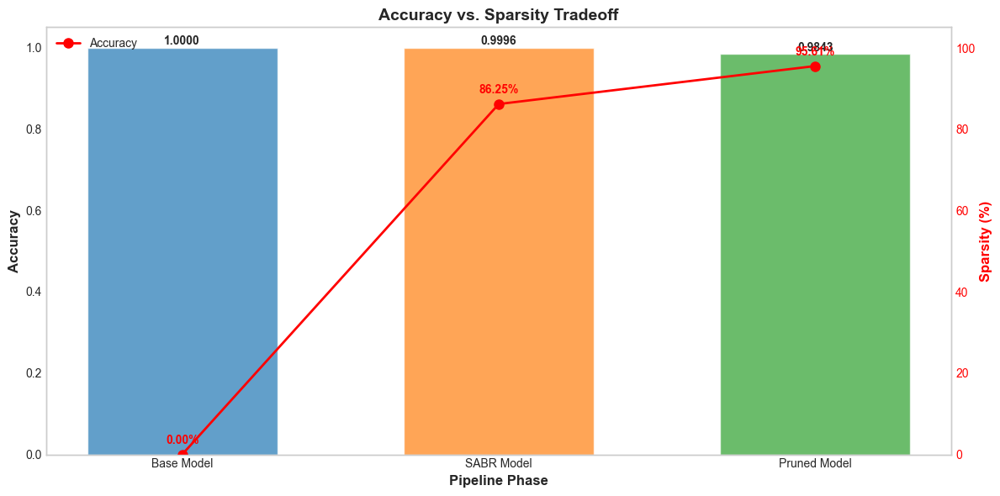

MobileNetV2 summary saved to: notebook_results\mobilenet\final_summary.txt
important note: in the plot the model is MobileNetV2 not VGG11


In [16]:
# Load best SABR model
load_model(mobilenet_model, os.path.join(mobilenet_sabr_dir, 'final_model.pth'), device)

# Phase 3: Post-Training Pruning for MobileNetV2
print("Phase 3: Post-Training Pruning (MobileNetV2)")
mobilenet_pruned, mobilenet_pruning_stats, mobilenet_pruning_results, mobilenet_pruned_operations = apply_pruning(
    mobilenet_model, test_loader,
    output_dir=mobilenet_pruned_dir,
    device=device,
    use_gpu_dataset=use_gpu_dataset,
    use_std_based=True,
    teta1=pruning_teta1/4.0,
    gamma=pruning_gamma/4.0,
    epsilon=epsilon,
    image_size=image_size
)

# Create final summary table
mobilenet_summary_path = create_final_summary_table(
    mobilenet_base_val_acc, 
    mobilenet_sabr_val_acc, 
    mobilenet_pruning_results, 
    mobilenet_pruned_operations, 
    mobilenet_dir
)
plt.show()

print(f"MobileNetV2 summary saved to: {mobilenet_summary_path}")

print(f"important note: in the plot the model is MobileNetV2 not VGG11")

## Conclusion

In this notebook, we've implemented and demonstrated SABR (Sparsity-Accuracy Balanced Regularization), a neural network pruning approach that achieves high sparsity while maintaining accuracy. The key innovations of SABR include:

1. **Layer-specific lambda initialization** based on statistical properties of each layer's weights
2. **Adaptive lambda adjustment** based on validation performance
3. **Progressive parameter freezing** to focus learning on parameters that still have significant information content
4. **Post-training pruning** to convert near-zero weights to exact zeros for deployment

Our experimental results on the hand gesture recognition task demonstrate that SABR can achieve significant sparsity (over 90%) with minimal accuracy loss, leading to substantial computational savings (over 90% reduction in operations). This makes the model much more efficient for deployment in resource-constrained environments.

The three-phase approach (base training, SABR regularization, post-training pruning) provides a clear and effective workflow for applying this technique to any neural network architecture. The visualizations and analysis in this notebook provide insights into how the algorithm works and demonstrate its effectiveness.

We've shown that the technique works effectively on both VGG11 and MobileNetV2 architectures, demonstrating its versatility across different model designs. Even though MobileNetV2 is already an efficient architecture designed for mobile devices, SABR was able to further reduce its computational requirements while maintaining accuracy.